# BoVW experimentation

Team 6
* Gerard Vilaplana
* Adrià Ruiz
* Aleix Armero
* Arnau Marcos
* Lore Oregi

# Introduction

The experimentation pipeline will be the following: We'll take a baseline configuration detailed below, and we're going to perform experiments in diferent aspects of the whole pipeline. As we make those experiments, we'll update the baseline keeping the balance with the best results from the previous experiments and hyperparameters that don't compromise the experimentation speed. We're going to use the following baseline for experimentation:
- Descriptor: SIFT, as the common algorithm for feature extraction in classic literature
- Number of features: 500
- Size of codebook: 512 (For initial fast clustering experimentation)
- Normalization: L2 in histograms
- Spatial Pyramids: No pyramid (no level)
- Dimensionality reuction: None (first we try with the whole data)
- Classifier: Logistic Regression (fast and easy hyperparameters for base experimentation)


With this pipeline, we're going to try:
- Number of local features in descriptors
- SIFT / AKAZE / ORB / Dense SIFT
- Spatial pyramids vs no spatial pyramids
- Try normalization and scale
- Size of codebook
- Try dimensionality reduction
- Classifiers: Logistic Regression vs SVM vs KNN
- Fisher Vectors

All experiments are evaluated using stratified 5-fold cross-validation to ensure reliable and consistent performance results. Only the best-performing configuration (based on cross-validation results) is then retrained on the full training set and evaluated once on the held-out test set.


In [19]:
from main import *
from bovw import *
from plotting import *

import os
import random
import numpy as np
import pandas as pd

%matplotlib inline
from matplotlib import pyplot as plt

In [20]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)

# Dataset Overview

In [21]:
data_train = Dataset(ImageFolder="../data/places_reduced/train")
data_test = Dataset(ImageFolder="../data/places_reduced/val")

len(data_train), len(data_test)

(8700, 2200)

In [22]:
train_sizes = set([img.size for img, _ in data_train])
print("Train unique sizes:", train_sizes)

test_sizes = set([img.size for img, _ in data_test])
print("Test unique sizes:", test_sizes)

Train unique sizes: {(256, 256)}
Test unique sizes: {(256, 256)}


In [23]:
random.shuffle(data_train)
random.shuffle(data_test)

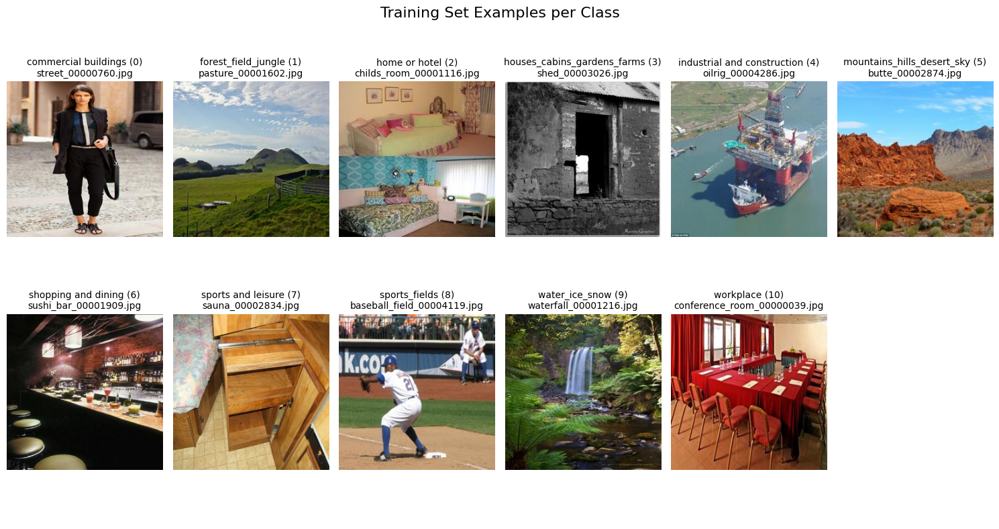

In [13]:
examples = []
seen_classes = set()

for img, label in data_train:
    class_name = os.path.basename(os.path.dirname(img.filename))
    if class_name not in seen_classes:
        examples.append((img, label))
        seen_classes.add(class_name)

examples.sort(key=lambda x: x[1])

plot_images(examples, title="Training Set Examples per Class", figsize=(15, 8), max_cols=6)

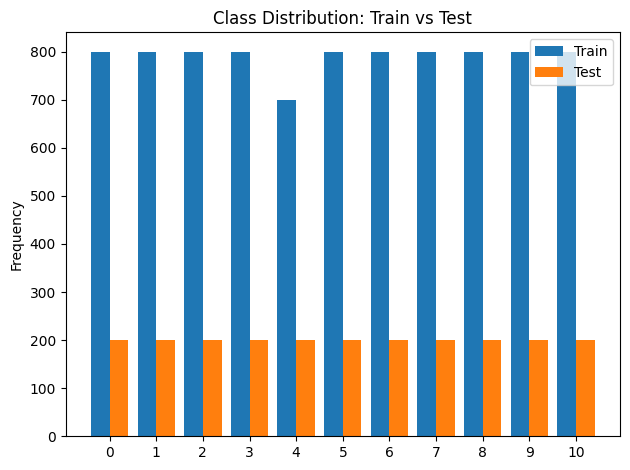

In [24]:
train_class_counter = Counter(entry[1] for entry in data_train)
test_class_counter = Counter(entry[1] for entry in data_test)

classes = sorted(train_class_counter.keys())  # or union with test if needed
train_counts = [train_class_counter[c] for c in classes]
test_counts = [test_class_counter[c] for c in classes]

width = 0.4
x = range(len(classes))

plt.bar([xi - width/2 for xi in x], train_counts, width=width, label="Train")
plt.bar([xi + width/2 for xi in x], test_counts, width=width, label="Test")

plt.xticks(x, classes)
plt.ylabel("Frequency")
plt.title("Class Distribution: Train vs Test")
plt.legend()
plt.tight_layout()
plt.show()

All classes have 800 training images except for class 4 ("industrial and construction"), which has 700.

All classes have 200 test samples.

# Experiments

## A) Descriptors (SIFT vs AKAZE vs ORB) and number of features

In this first experiment, we analyze how the number of extracted local features and the specific descriptor used influence the performance of the classification pipeline. We seek to answer the following questions:

* How does increasing or reducing the number of local features affect accuracy?

* To what extent does the type of descriptor (SIFT, AKAZE, ORB) impact the final performance?

For AKAZE, the number of extracted keypoints is not directly controlled through a parameter like in SIFT or ORB. Instead, we vary the detector threshold, which indirectly regulates keypoint density: lower thresholds produce more local features, while higher thresholds result in fewer and more selective keypoints.

In [11]:
enable_cache()

### SIFT

In [6]:
# SIFT
print("TESTING SIFT DESCRIPTOR")

sift_nfeatures = [250, 500, 1000, 2000, 10000]
sift_results = {}

for nfeatures in sift_nfeatures:
    print(f"\nSIFT with nfeatures={nfeatures}")
    
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": nfeatures},
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5,
        verbose=False,
    )
    
    sift_results[nfeatures] = scores
    
    print(f"[SIFT nfeatures={nfeatures}] Results:")
    print(f"  Train Accuracy:  {scores.train.accuracy.mean:.4f} ± {scores.train.accuracy.std:.4f}")
    print(f"  Val Accuracy:   {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")
    print(f"  Val Precision:  {scores.val.precision.mean:.4f} ± {scores.val.precision.std:.4f}")
    print(f"  Val Recall:     {scores.val.recall.mean:.4f} ± {scores.val.recall.std:.4f}")
    print(f"  Val F1-Score:   {scores.val.f1.mean:.4f} ± {scores.val.f1.std:.4f}")


print("\nSIFT SUMMARY")
for nfeatures in sift_nfeatures:
    print(f"nfeatures={nfeatures:4d} -> Accuracy Train: {sift_results[nfeatures].train.accuracy.mean:.4f} ± {sift_results[nfeatures].train.accuracy.std:.4f}")
    print(f"nfeatures={nfeatures:4d} -> Accuracy Val: {sift_results[nfeatures].val.accuracy.mean:.4f} ± {sift_results[nfeatures].val.accuracy.std:.4f}")
    print("")

TESTING SIFT DESCRIPTOR

SIFT with nfeatures=250


Phase [Setup]: Extracting the descriptors:  23%|██▎       | 2033/8700 [00:00<00:02, 3306.76it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  62%|██████▏   | 5384/8700 [00:01<00:01, 3188.73it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:05<00:00, 13.03s/it]


[SIFT nfeatures=250] Results:
  Train Accuracy:  0.4335 ± 0.0058
  Val Accuracy:   0.2899 ± 0.0184
  Val Precision:  0.2791 ± 0.0192
  Val Recall:     0.2899 ± 0.0184
  Val F1-Score:   0.2814 ± 0.0191

SIFT with nfeatures=500


Phase [Setup]: Extracting the descriptors:  20%|██        | 1776/8700 [00:00<00:03, 2248.12it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  58%|█████▊    | 5050/8700 [00:02<00:01, 2272.72it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:14<00:00, 14.83s/it]


[SIFT nfeatures=500] Results:
  Train Accuracy:  0.4431 ± 0.0039
  Val Accuracy:   0.3120 ± 0.0203
  Val Precision:  0.3034 ± 0.0208
  Val Recall:     0.3120 ± 0.0203
  Val F1-Score:   0.3046 ± 0.0203

SIFT with nfeatures=1000


Phase [Setup]: Extracting the descriptors:  20%|██        | 1783/8700 [00:01<00:03, 1776.05it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  58%|█████▊    | 5077/8700 [00:02<00:02, 1795.22it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:29<00:00, 17.97s/it]


[SIFT nfeatures=1000] Results:
  Train Accuracy:  0.4510 ± 0.0057
  Val Accuracy:   0.3288 ± 0.0216
  Val Precision:  0.3191 ± 0.0218
  Val Recall:     0.3288 ± 0.0216
  Val F1-Score:   0.3207 ± 0.0216

SIFT with nfeatures=2000


Phase [Setup]: Extracting the descriptors:  20%|█▉        | 1720/8700 [00:01<00:04, 1713.25it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  58%|█████▊    | 5009/8700 [00:02<00:02, 1727.56it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:34<00:00, 18.82s/it]


[SIFT nfeatures=2000] Results:
  Train Accuracy:  0.4477 ± 0.0031
  Val Accuracy:   0.3218 ± 0.0111
  Val Precision:  0.3138 ± 0.0111
  Val Recall:     0.3218 ± 0.0111
  Val F1-Score:   0.3143 ± 0.0110

SIFT with nfeatures=10000


Phase [Setup]: Extracting the descriptors:  20%|██        | 1781/8700 [00:01<00:03, 1762.97it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  58%|█████▊    | 5063/8700 [00:02<00:02, 1790.37it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:29<00:00, 17.94s/it]

[SIFT nfeatures=10000] Results:
  Train Accuracy:  0.4508 ± 0.0050
  Val Accuracy:   0.3244 ± 0.0160
  Val Precision:  0.3154 ± 0.0154
  Val Recall:     0.3244 ± 0.0160
  Val F1-Score:   0.3168 ± 0.0156

SIFT SUMMARY
nfeatures= 250 -> Accuracy Train: 0.4335 ± 0.0058
nfeatures= 250 -> Accuracy Val: 0.2899 ± 0.0184

nfeatures= 500 -> Accuracy Train: 0.4431 ± 0.0039
nfeatures= 500 -> Accuracy Val: 0.3120 ± 0.0203

nfeatures=1000 -> Accuracy Train: 0.4510 ± 0.0057
nfeatures=1000 -> Accuracy Val: 0.3288 ± 0.0216

nfeatures=2000 -> Accuracy Train: 0.4477 ± 0.0031
nfeatures=2000 -> Accuracy Val: 0.3218 ± 0.0111

nfeatures=10000 -> Accuracy Train: 0.4508 ± 0.0050
nfeatures=10000 -> Accuracy Val: 0.3244 ± 0.0160



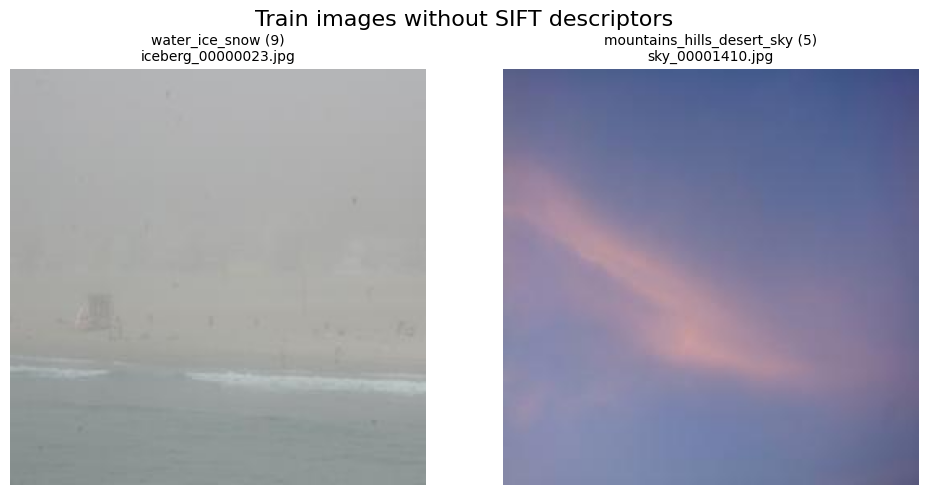

In [ ]:
# Check which images failed to compute SIFT descriptors
FAILED_PATHS = {
    "../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg"
}

failed_images_for_plot: List[Tuple[Type[Image.Image], int]] = []

for img_pil, label in data_train:
    if hasattr(img_pil, 'filename') and img_pil.filename in FAILED_PATHS:
        failed_images_for_plot.append((img_pil, label))

if failed_images_for_plot:
    plot_images(
        failed_images_for_plot, 
        title="Train images without SIFT descriptors",
        figsize=(10, 5),
        max_cols=2
    )

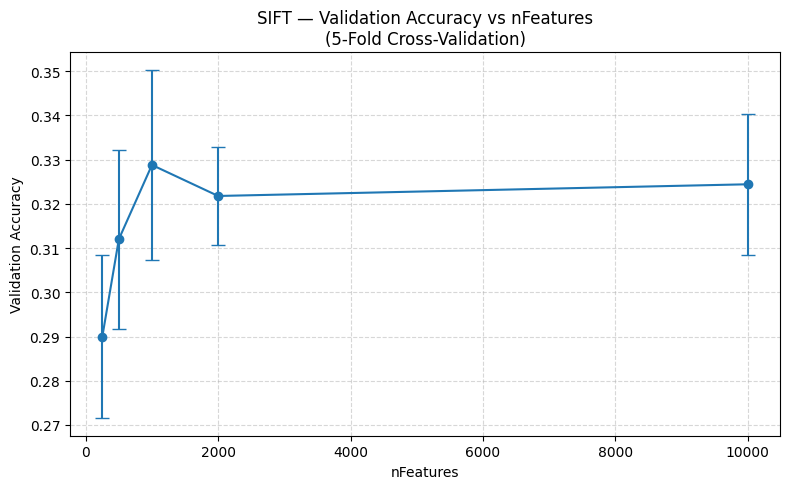

In [7]:
# Plot SIFT Validation Accuracy vs nFeatures (5-Fold CV)

# Since the dataset is reasonably balanced and we use stratified 5-fold cross-validation, 
# accuracy is a reliable metric for evaluating performance in this experiment.

n_features = sift_nfeatures

acc_means = [sift_results[n].val.accuracy.mean for n in n_features]
acc_stds  = [sift_results[n].val.accuracy.std for n in n_features]

plot_cv_accuracy(
    x_values=n_features,
    means=acc_means,
    stds=acc_stds,
    descriptor_name="SIFT",
    hyperparam_name="nFeatures"
)


In [5]:
# Tested on the held-out test set using the best nFeatures selected by cross-validation (1000)
bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

classifier_cls = LogisticRegression
classifier_params = {
    "max_iter": 1000,
    "class_weight": "balanced",
}
bovw = BOVW(**bovw_params)
classifier = classifier_cls(**classifier_params)
sift_bovw, sift_classifier = train(dataset=data_train, bovw=bovw, classifier=classifier)

sift_acc, sift_prec, sift_rec, sift_f1, sift_y_test, sift_y_pred, sift_y_score = test(dataset=data_test, bovw=sift_bovw, classifier=sift_classifier, return_predictions=True)

Phase [Training]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:05<00:00, 1508.61it/s]


Fitting the codebook
Computing the bovw histograms
Fitting the classifier
Accuracy on Phase[Train]: 0.4405610485169004
Precision on Phase[Train]: 0.43610723880646035
Recall on Phase[Train]: 0.4405610485169004
F1-Score on Phase[Train]: 0.434642928998042


Phase [Eval]: Extracting the descriptors: 100%|██████████| 2200/2200 [00:01<00:00, 1669.25it/s]


Computing the bovw histograms
predicting the values
Accuracy on Phase[Test]: 0.33181818181818185
Precision on Phase[Test]: 0.32283453990023575
Recall on Phase[Test]: 0.33181818181818185
F1-Score on Phase[Test]: 0.3214347408215836


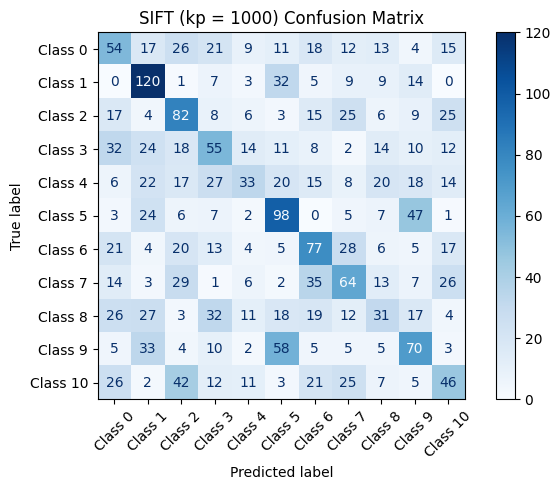

In [6]:
plot_confusion_matrix(sift_y_test, sift_y_pred, title="SIFT (kp = 1000) Confusion Matrix")

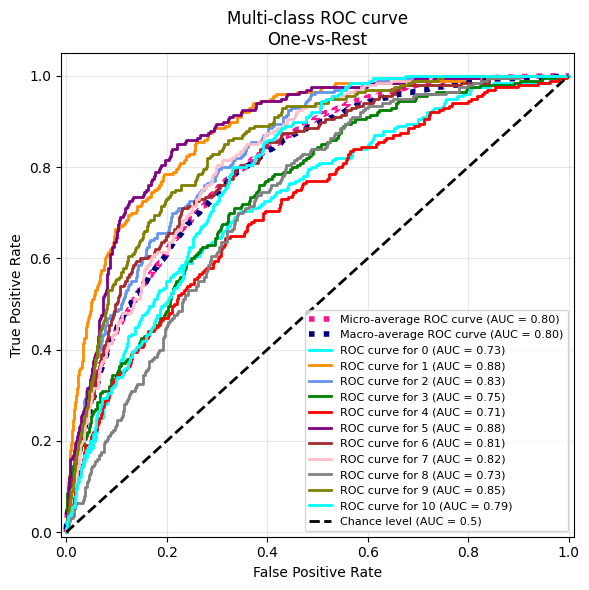


Micro-averaged One-vs-Rest ROC AUC score: 0.80
Macro-averaged One-vs-Rest ROC AUC score: 0.80

Per-class ROC AUC scores:
  0: 0.73
  1: 0.88
  2: 0.83
  3: 0.75
  4: 0.71
  5: 0.88
  6: 0.81
  7: 0.82
  8: 0.73
  9: 0.85
  10: 0.79


In [7]:
plot_multiclass_roc(sift_y_test, sift_y_score, figsize=(6,6))

### AKAZE

In [8]:
# AKAZE
print("TESTING AKAZE DESCRIPTOR")

akaze_threshold = [0.0004, 0.0008, 0.0012]
akaze_results = {}

for thr in akaze_threshold:
    print(f"\nAKAZE with threshold={thr}")
    
    bovw_params = {
        "detector_type": "AKAZE",
        "codebook_size": 512,
        "detector_kwargs": {"threshold": thr},
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5,
        verbose=False,
    )
    
    akaze_results[thr] = scores
    
    print(f"[AKAZE threshold={thr}] Results:")
    print(f"  Train Accuracy:  {scores.train.accuracy.mean:.4f} ± {scores.train.accuracy.std:.4f}")
    print(f"  Val Accuracy:   {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")
    print(f"  Val Precision:  {scores.val.precision.mean:.4f} ± {scores.val.precision.std:.4f}")
    print(f"  Val Recall:     {scores.val.recall.mean:.4f} ± {scores.val.recall.std:.4f}")
    print(f"  Val F1-Score:   {scores.val.f1.mean:.4f} ± {scores.val.f1.std:.4f}")

print("\nAKAZE SUMMARY")
for thr in akaze_threshold:
    print(f"thr={thr} -> Accuracy Train: {akaze_results[thr].train.accuracy.mean:.4f} ± {akaze_results[thr].train.accuracy.std:.4f}")
    print(f"thr={thr} -> Accuracy Val: {akaze_results[thr].val.accuracy.mean:.4f} ± {akaze_results[thr].val.accuracy.std:.4f}")
    print("")

TESTING AKAZE DESCRIPTOR

AKAZE with threshold=0.0004


Phase [Setup]: Extracting the descriptors:   6%|▋         | 549/8700 [00:01<00:31, 261.26it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  12%|█▏        | 1056/8700 [00:03<00:30, 251.51it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  46%|████▌     | 3969/8700 [00:12<00:13, 349.60it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/volcano_00004486.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  65%|██████▍   | 5647/8700 [00:17<00:10, 303.56it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00001030.jpg of class 7.


Phase [Setup]: Extracting the descriptors:  77%|███████▋  | 6665/8700 [00:20<00:04, 426.41it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/canyon_00003418.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  83%|████████▎ | 7254/8700 [00:22<00:03, 406.81it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001057.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  89%|████████▉ | 7737/8700 [00:23<00:02, 408.51it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00003623.jpg of class 7.


100%|██████████| 5/5 [03:18<00:00, 39.63s/it]


[AKAZE threshold=0.0004] Results:
  Train Accuracy:  0.3678 ± 0.0046
  Val Accuracy:   0.2112 ± 0.0093
  Val Precision:  0.2058 ± 0.0093
  Val Recall:     0.2112 ± 0.0093
  Val F1-Score:   0.2060 ± 0.0086

AKAZE with threshold=0.0008


Phase [Setup]: Extracting the descriptors:   6%|▋         | 553/8700 [00:01<00:22, 363.46it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  12%|█▏        | 1079/8700 [00:02<00:20, 374.95it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  29%|██▊       | 2489/8700 [00:05<00:15, 403.23it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00004426.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  36%|███▌      | 3092/8700 [00:06<00:05, 984.08it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/mountain_00002707.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  41%|████      | 3572/8700 [00:07<00:11, 440.45it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00000137.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  47%|████▋     | 4056/8700 [00:08<00:05, 901.77it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/volcano_00004486.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  60%|█████▉    | 5195/8700 [00:10<00:09, 375.81it/s]

Could not compute descriptors for image ../data/places_reduced/train/forest_field_jungle/pasture_00002164.jpg of class 1.


Phase [Setup]: Extracting the descriptors:  63%|██████▎   | 5497/8700 [00:11<00:07, 408.06it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/cliff_00001485.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  65%|██████▌   | 5660/8700 [00:11<00:08, 365.70it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00001030.jpg of class 7.


Phase [Setup]: Extracting the descriptors:  72%|███████▏  | 6240/8700 [00:13<00:06, 393.72it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/cliff_00001932.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  77%|███████▋  | 6664/8700 [00:14<00:05, 389.00it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/canyon_00003418.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  79%|███████▉  | 6857/8700 [00:14<00:05, 358.25it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00000226.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  85%|████████▌ | 7412/8700 [00:15<00:01, 990.15it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001057.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  89%|████████▉ | 7740/8700 [00:15<00:00, 1001.90it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00003623.jpg of class 7.


100%|██████████| 5/5 [02:36<00:00, 31.40s/it]


[AKAZE threshold=0.0008] Results:
  Train Accuracy:  0.3630 ± 0.0020
  Val Accuracy:   0.1965 ± 0.0079
  Val Precision:  0.1914 ± 0.0071
  Val Recall:     0.1965 ± 0.0079
  Val F1-Score:   0.1916 ± 0.0073

AKAZE with threshold=0.0012


Phase [Setup]: Extracting the descriptors:   6%|▋         | 557/8700 [00:01<00:21, 385.80it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  12%|█▏        | 1085/8700 [00:02<00:16, 457.83it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  15%|█▍        | 1270/8700 [00:02<00:17, 426.34it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00003849.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  16%|█▌        | 1353/8700 [00:03<00:18, 389.52it/s]

Could not compute descriptors for image ../data/places_reduced/train/home or hotel/bathroom_00000599.jpg of class 2.


Phase [Setup]: Extracting the descriptors:  19%|█▉        | 1635/8700 [00:03<00:15, 445.81it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/hot_spring_00003968.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  28%|██▊       | 2476/8700 [00:05<00:13, 478.18it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00004426.jpg of class 5.
Could not compute descriptors for image ../data/places_reduced/train/sports_fields/promenade_00000058.jpg of class 8.


Phase [Setup]: Extracting the descriptors:  36%|███▋      | 3161/8700 [00:07<00:12, 455.12it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/mountain_00002707.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  41%|████      | 3580/8700 [00:07<00:10, 471.69it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00000137.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  46%|████▌     | 3995/8700 [00:08<00:10, 459.79it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/volcano_00004486.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  53%|█████▎    | 4618/8700 [00:10<00:09, 428.36it/s]

Could not compute descriptors for image ../data/places_reduced/train/home or hotel/basement_00001438.jpg of class 2.


Phase [Setup]: Extracting the descriptors:  57%|█████▋    | 4990/8700 [00:11<00:08, 430.53it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00003791.jpg of class 7.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5166/8700 [00:11<00:08, 410.21it/s]

Could not compute descriptors for image ../data/places_reduced/train/forest_field_jungle/pasture_00002164.jpg of class 1.


Phase [Setup]: Extracting the descriptors:  63%|██████▎   | 5494/8700 [00:12<00:06, 467.44it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/cliff_00001485.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  65%|██████▌   | 5677/8700 [00:12<00:07, 419.55it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00001030.jpg of class 7.


Phase [Setup]: Extracting the descriptors:  72%|███████▏  | 6228/8700 [00:13<00:05, 477.80it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/cliff_00001932.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  74%|███████▍  | 6474/8700 [00:14<00:05, 416.99it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/volcano_00000431.jpg of class 5.
Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/volcano_00002718.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  76%|███████▋  | 6640/8700 [00:14<00:04, 461.29it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/canyon_00003418.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  79%|███████▉  | 6883/8700 [00:15<00:04, 439.46it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00000226.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  83%|████████▎ | 7242/8700 [00:15<00:02, 488.28it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001057.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  90%|█████████ | 7845/8700 [00:17<00:01, 727.99it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00003623.jpg of class 7.


100%|██████████| 5/5 [02:21<00:00, 28.39s/it]

[AKAZE threshold=0.0012] Results:
  Train Accuracy:  0.3510 ± 0.0023
  Val Accuracy:   0.1949 ± 0.0060
  Val Precision:  0.1889 ± 0.0055
  Val Recall:     0.1949 ± 0.0060
  Val F1-Score:   0.1897 ± 0.0054

AKAZE SUMMARY
thr=0.0004 -> Accuracy Train: 0.3678 ± 0.0046
thr=0.0004 -> Accuracy Val: 0.2112 ± 0.0093

thr=0.0008 -> Accuracy Train: 0.3630 ± 0.0020
thr=0.0008 -> Accuracy Val: 0.1965 ± 0.0079

thr=0.0012 -> Accuracy Train: 0.3510 ± 0.0023
thr=0.0012 -> Accuracy Val: 0.1949 ± 0.0060



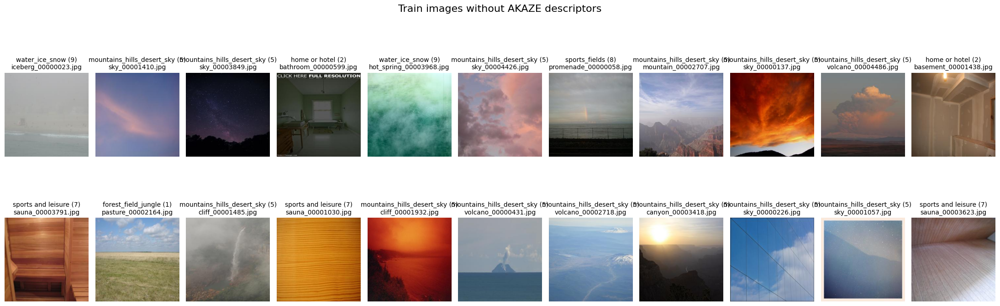

In [33]:
# Check which images failed to compute AKAZE descriptors
# The threshold determines the sensitivity of keypoint detection; higher values may lead to fewer keypoints detected and potenially more failures
FAILED_PATHS = {
    "../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/volcano_00004486.jpg",
    "../data/places_reduced/train/sports and leisure/sauna_00001030.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/canyon_00003418.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/sky_00001057.jpg",
    "../data/places_reduced/train/sports and leisure/sauna_00003623.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/sky_00004426.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/mountain_00002707.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/sky_00000137.jpg",
    "../data/places_reduced/train/forest_field_jungle/pasture_00002164.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/cliff_00001485.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/cliff_00001932.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/sky_00000226.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/sky_00003849.jpg",
    "../data/places_reduced/train/home or hotel/bathroom_00000599.jpg",
    "../data/places_reduced/train/water_ice_snow/hot_spring_00003968.jpg",
    "../data/places_reduced/train/sports_fields/promenade_00000058.jpg",
    "../data/places_reduced/train/home or hotel/basement_00001438.jpg",
    "../data/places_reduced/train/sports and leisure/sauna_00003791.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/volcano_00000431.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/volcano_00002718.jpg"
}

failed_images_for_plot: List[Tuple[Type[Image.Image], int]] = []

for img_pil, label in data_train:
    if hasattr(img_pil, 'filename') and img_pil.filename in FAILED_PATHS:
        failed_images_for_plot.append((img_pil, label))

if failed_images_for_plot:
    plot_images(
        failed_images_for_plot, 
        title="Train images without AKAZE descriptors",
        figsize=(22, 8),
        max_cols=11
    )

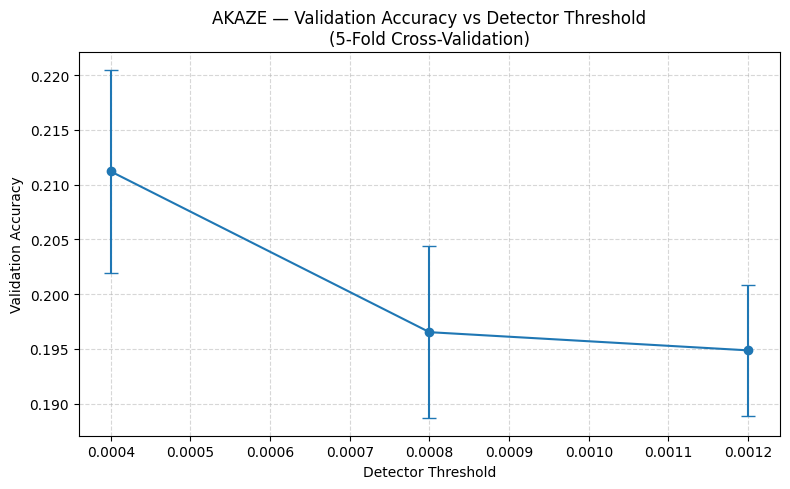

In [9]:
# Plot AKAZE Validation Accuracy vs nFeatures (5-Fold CV)

# Since the dataset is reasonably balanced and we use stratified 5-fold cross-validation, 
# accuracy is a reliable metric for evaluating performance in this experiment.
akaze_thresholds = akaze_threshold

# Accuracy from CV results
acc_means = [akaze_results[t].val.accuracy.mean for t in akaze_thresholds]
acc_stds  = [akaze_results[t].val.accuracy.std for t in akaze_thresholds]

plot_cv_accuracy(
    x_values=akaze_thresholds,
    means=acc_means,
    stds=acc_stds,
    descriptor_name="AKAZE",
    hyperparam_name="Detector Threshold"
)

In [8]:
# Tested on the held-out test set using the best threshold selected by cross-validation (0.0004)
bovw_params = {
    "detector_type": "AKAZE",
    "codebook_size": 512,
    "detector_kwargs": {"threshold": 0.0004},
}

classifier_cls = LogisticRegression
classifier_params = {
    "max_iter": 1000,
    "class_weight": "balanced",
}
bovw = BOVW(**bovw_params)
classifier = classifier_cls(**classifier_params)
akaze_bovw, akaze_classifier = train(dataset=data_train, bovw=bovw, classifier=classifier)

akaze_acc, akaze_prec, akaze_rec, akaze_f1, akaze_y_test, akaze_y_pred, akaze_y_score = test(dataset=data_test, bovw=akaze_bovw, classifier=akaze_classifier, return_predictions=True)

Phase [Training]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:04<00:00, 1940.45it/s]


Fitting the codebook
Computing the bovw histograms
Fitting the classifier
Accuracy on Phase[Train]: 0.3555734499022202
Precision on Phase[Train]: 0.3539390873428095
Recall on Phase[Train]: 0.3555734499022202
F1-Score on Phase[Train]: 0.35153460699223676


Phase [Eval]: Extracting the descriptors: 100%|██████████| 2200/2200 [00:01<00:00, 2115.98it/s]


Computing the bovw histograms
predicting the values
Accuracy on Phase[Test]: 0.20772727272727273
Precision on Phase[Test]: 0.19903872698631944
Recall on Phase[Test]: 0.20772727272727273
F1-Score on Phase[Test]: 0.20102913673902598


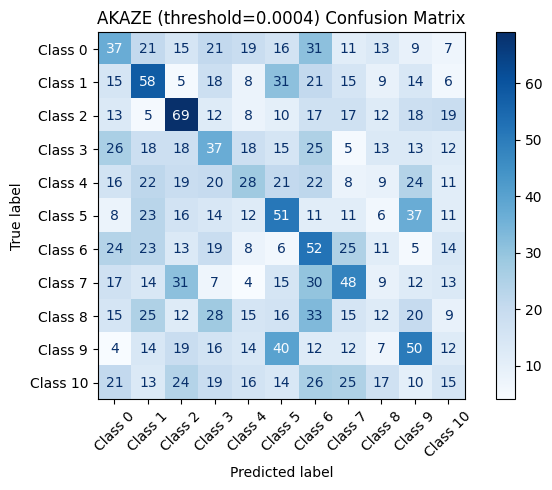

In [9]:
plot_confusion_matrix(akaze_y_test, akaze_y_pred, title="AKAZE (threshold=0.0004) Confusion Matrix")

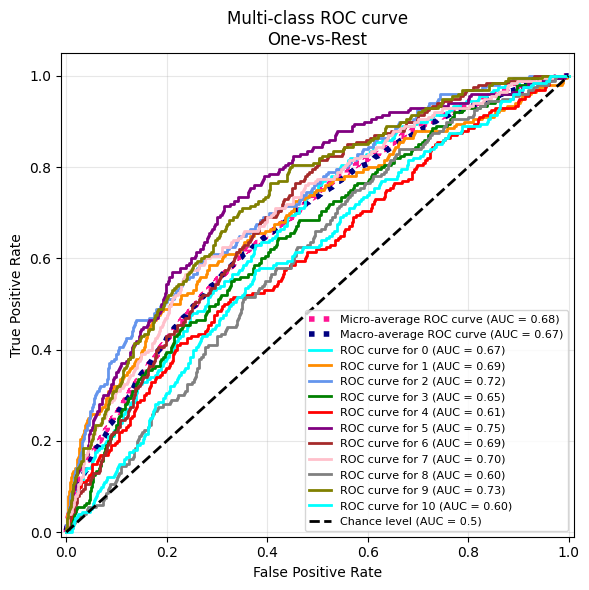


Micro-averaged One-vs-Rest ROC AUC score: 0.68
Macro-averaged One-vs-Rest ROC AUC score: 0.67

Per-class ROC AUC scores:
  0: 0.67
  1: 0.69
  2: 0.72
  3: 0.65
  4: 0.61
  5: 0.75
  6: 0.69
  7: 0.70
  8: 0.60
  9: 0.73
  10: 0.60


In [10]:
plot_multiclass_roc(akaze_y_test, akaze_y_score, figsize=(6,6))

### ORB

In [12]:
# ORB
print("TESTING ORB DESCRIPTOR")

orb_nfeatures = [250, 500, 1000, 2000, 10000]
orb_results = {}

for nfeatures in orb_nfeatures:
    print(f"\nORB with nfeatures={nfeatures}")
    
    bovw_params = {
        "detector_type": "ORB",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": nfeatures},
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5,
        verbose=False,
    )
    
    orb_results[nfeatures] = scores
    
    print(f"[ORB nfeatures={nfeatures}] Results:")
    print(f"  Train Accuracy:  {scores.train.accuracy.mean:.4f} ± {scores.train.accuracy.std:.4f}")
    print(f"  Val Accuracy:   {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")
    print(f"  Val Precision:  {scores.val.precision.mean:.4f} ± {scores.val.precision.std:.4f}")
    print(f"  Val Recall:     {scores.val.recall.mean:.4f} ± {scores.val.recall.std:.4f}")
    print(f"  Val F1-Score:   {scores.val.f1.mean:.4f} ± {scores.val.f1.std:.4f}")

print("\nORB SUMMARY")
for nfeatures in orb_nfeatures:
    print(f"nfeatures={nfeatures:4d} -> Accuracy Train: {orb_results[nfeatures].train.accuracy.mean:.4f} ± {orb_results[nfeatures].train.accuracy.std:.4f}")
    print(f"nfeatures={nfeatures:4d} -> Accuracy Val: {orb_results[nfeatures].val.accuracy.mean:.4f} ± {orb_results[nfeatures].val.accuracy.std:.4f}")
    print("")

TESTING ORB DESCRIPTOR

ORB with nfeatures=250


Phase [Setup]: Extracting the descriptors:   0%|          | 0/8700 [00:00<?, ?it/s]

Phase [Setup]: Extracting the descriptors:   7%|▋         | 568/8700 [00:01<00:20, 405.48it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  12%|█▏        | 1075/8700 [00:02<00:18, 422.67it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  65%|██████▌   | 5660/8700 [00:13<00:08, 345.02it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00001030.jpg of class 7.


100%|██████████| 5/5 [02:07<00:00, 25.42s/it]


[ORB nfeatures=250] Results:
  Train Accuracy:  0.3394 ± 0.0067
  Val Accuracy:   0.1744 ± 0.0071
  Val Precision:  0.1709 ± 0.0075
  Val Recall:     0.1744 ± 0.0071
  Val F1-Score:   0.1711 ± 0.0073

ORB with nfeatures=500


Phase [Setup]: Extracting the descriptors:   6%|▋         | 552/8700 [00:01<00:17, 477.12it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  13%|█▎        | 1145/8700 [00:02<00:13, 548.68it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  65%|██████▍   | 5626/8700 [00:15<00:12, 248.96it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00001030.jpg of class 7.


100%|██████████| 5/5 [03:00<00:00, 36.03s/it]


[ORB nfeatures=500] Results:
  Train Accuracy:  0.3425 ± 0.0032
  Val Accuracy:   0.1837 ± 0.0067
  Val Precision:  0.1809 ± 0.0069
  Val Recall:     0.1837 ± 0.0067
  Val F1-Score:   0.1802 ± 0.0068

ORB with nfeatures=1000


Phase [Setup]: Extracting the descriptors:   6%|▌         | 520/8700 [00:02<00:52, 156.41it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  12%|█▏        | 1075/8700 [00:06<00:27, 280.93it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  65%|██████▍   | 5626/8700 [00:23<00:24, 124.05it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00001030.jpg of class 7.


100%|██████████| 5/5 [04:27<00:00, 53.49s/it]


[ORB nfeatures=1000] Results:
  Train Accuracy:  0.3407 ± 0.0044
  Val Accuracy:   0.2037 ± 0.0051
  Val Precision:  0.2006 ± 0.0046
  Val Recall:     0.2037 ± 0.0051
  Val F1-Score:   0.1997 ± 0.0049

ORB with nfeatures=2000


Phase [Setup]: Extracting the descriptors:   6%|▌         | 529/8700 [00:05<00:56, 143.63it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  12%|█▏        | 1030/8700 [00:09<00:44, 171.74it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  65%|██████▍   | 5625/8700 [00:46<00:15, 203.60it/s]

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00001030.jpg of class 7.


100%|██████████| 5/5 [06:39<00:00, 79.81s/it]


[ORB nfeatures=2000] Results:
  Train Accuracy:  0.3418 ± 0.0036
  Val Accuracy:   0.2141 ± 0.0042
  Val Precision:  0.2109 ± 0.0048
  Val Recall:     0.2141 ± 0.0042
  Val F1-Score:   0.2089 ± 0.0039

ORB with nfeatures=10000


Phase [Setup]: Extracting the descriptors:   6%|▌         | 512/8700 [00:06<02:14, 61.07it/s] 

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  12%|█▏        | 1040/8700 [00:13<01:44, 73.60it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  65%|██████▍   | 5612/8700 [01:20<00:54, 57.05it/s] 

Could not compute descriptors for image ../data/places_reduced/train/sports and leisure/sauna_00001030.jpg of class 7.


100%|██████████| 5/5 [09:32<00:00, 114.48s/it]


[ORB nfeatures=10000] Results:
  Train Accuracy:  0.3463 ± 0.0061
  Val Accuracy:   0.2259 ± 0.0084
  Val Precision:  0.2209 ± 0.0076
  Val Recall:     0.2259 ± 0.0084
  Val F1-Score:   0.2183 ± 0.0065

ORB SUMMARY
nfeatures= 250 -> Accuracy Train: 0.3394 ± 0.0067
nfeatures= 250 -> Accuracy Val: 0.1744 ± 0.0071

nfeatures= 500 -> Accuracy Train: 0.3425 ± 0.0032
nfeatures= 500 -> Accuracy Val: 0.1837 ± 0.0067

nfeatures=1000 -> Accuracy Train: 0.3407 ± 0.0044
nfeatures=1000 -> Accuracy Val: 0.2037 ± 0.0051

nfeatures=2000 -> Accuracy Train: 0.3418 ± 0.0036
nfeatures=2000 -> Accuracy Val: 0.2141 ± 0.0042

nfeatures=10000 -> Accuracy Train: 0.3463 ± 0.0061
nfeatures=10000 -> Accuracy Val: 0.2259 ± 0.0084



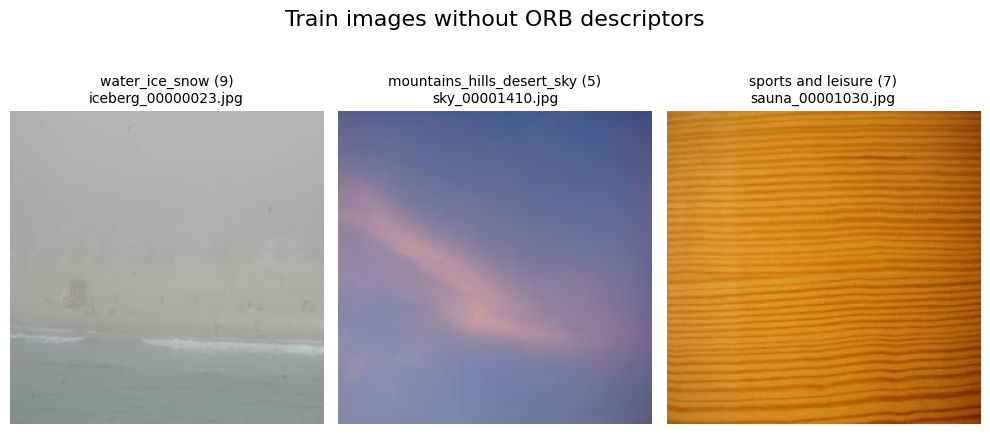

In [34]:
# Check which images failed to compute ORB descriptors
FAILED_PATHS = {
    "../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg",
    "../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg",
    "../data/places_reduced/train/sports and leisure/sauna_00001030.jpg"
}

failed_images_for_plot: List[Tuple[Type[Image.Image], int]] = []

for img_pil, label in data_train:
    if hasattr(img_pil, 'filename') and img_pil.filename in FAILED_PATHS:
        failed_images_for_plot.append((img_pil, label))

if failed_images_for_plot:
    plot_images(
        failed_images_for_plot, 
        title="Train images without ORB descriptors",
        figsize=(10, 5),
        max_cols=3
    )

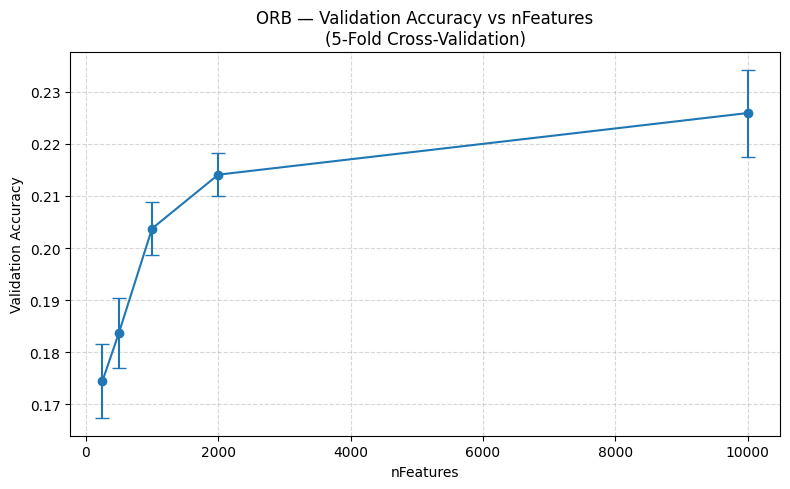

In [13]:
# Plot ORB Validation Accuracy vs nFeatures (5-Fold CV)

# Since the dataset is reasonably balanced and we use stratified 5-fold cross-validation, 
# accuracy is a reliable metric for evaluating performance in this experiment.
n_features = orb_nfeatures

# Accuracy
acc_means = [orb_results[n].val.accuracy.mean for n in n_features]
acc_stds  = [orb_results[n].val.accuracy.std for n in n_features]

plot_cv_accuracy(
    x_values=n_features,
    means=acc_means,
    stds=acc_stds,
    descriptor_name="ORB",
    hyperparam_name="nFeatures"
)


In [11]:
# Tested on the held-out test set using the best nFeatures selected by cross-validation (10000)
bovw_params = {
    "detector_type": "ORB",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 10000},
}

classifier_cls = LogisticRegression
classifier_params = {
    "max_iter": 1000,
    "class_weight": "balanced",
}
bovw = BOVW(**bovw_params)
classifier = classifier_cls(**classifier_params)
orb_bovw, orb_classifier = train(dataset=data_train, bovw=bovw, classifier=classifier)

orb_acc, orb_prec, orb_rec, orb_f1, orb_y_test, orb_y_pred, orb_y_score = test(dataset=data_test, bovw=orb_bovw, classifier=orb_classifier, return_predictions=True)

Phase [Training]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:21<00:00, 412.78it/s]


Fitting the codebook
Computing the bovw histograms
Fitting the classifier
Accuracy on Phase[Train]: 0.3356329768885823
Precision on Phase[Train]: 0.34024857488012766
Recall on Phase[Train]: 0.3356329768885823
F1-Score on Phase[Train]: 0.33097291035189796


Phase [Eval]: Extracting the descriptors: 100%|██████████| 2200/2200 [00:05<00:00, 438.61it/s]


Computing the bovw histograms
predicting the values
Accuracy on Phase[Test]: 0.21363636363636362
Precision on Phase[Test]: 0.21294428137427732
Recall on Phase[Test]: 0.21363636363636362
F1-Score on Phase[Test]: 0.20821734881013054


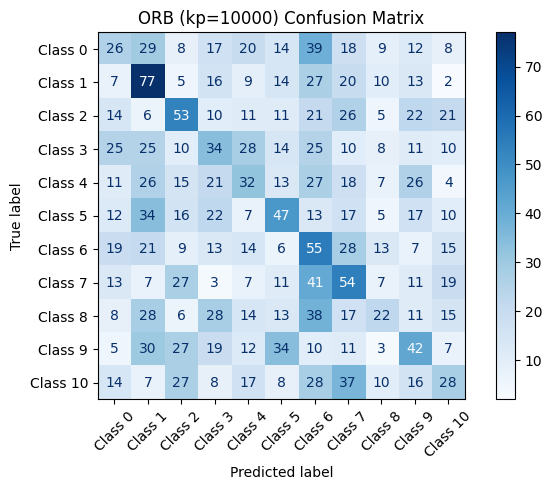

In [12]:
plot_confusion_matrix(orb_y_test, orb_y_pred, title="ORB (kp=10000) Confusion Matrix")

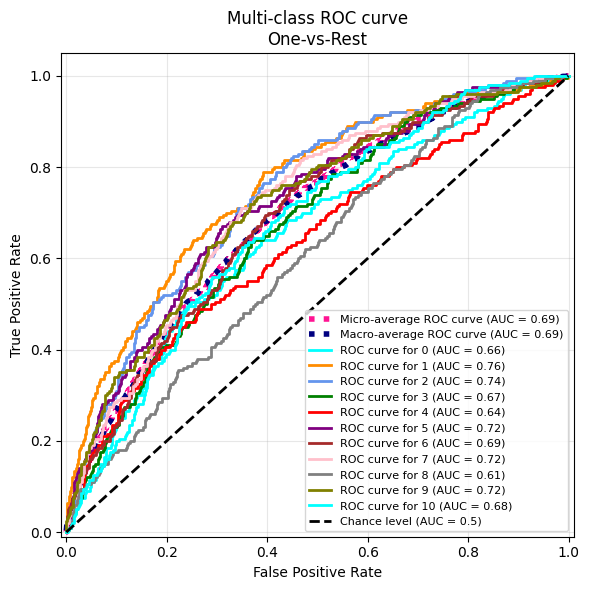


Micro-averaged One-vs-Rest ROC AUC score: 0.69
Macro-averaged One-vs-Rest ROC AUC score: 0.69

Per-class ROC AUC scores:
  0: 0.66
  1: 0.76
  2: 0.74
  3: 0.67
  4: 0.64
  5: 0.72
  6: 0.69
  7: 0.72
  8: 0.61
  9: 0.72
  10: 0.68


In [13]:
plot_multiclass_roc(orb_y_test, orb_y_score, figsize=(6,6))

### Comparison and Best Configuration

Comparing all three descriptors across different feature counts to select the best for further experimentation.

In [ ]:
# Comparison of all descriptors
print("SECTION A: FINAL COMPARISON - DESCRIPTORS AND NUMBER OF FEATURES")
print("-" * 80)

# Prepare comparison data
comparison_data = []

for nfeatures in sift_nfeatures:
    comparison_data.append({
        "Descriptor": "SIFT",
        "nfeatures": nfeatures,
        "Train Acc": sift_results[nfeatures].train.accuracy.mean,
        "Val Acc": sift_results[nfeatures].val.accuracy.mean,
        "Val Acc Std": sift_results[nfeatures].val.accuracy.std,
        "Val Prec": sift_results[nfeatures].val.precision.mean,
        "Val Rec": sift_results[nfeatures].val.recall.mean,
        "Val F1": sift_results[nfeatures].val.f1.mean,
    })

for threshold in akaze_thresholds:
    comparison_data.append({
        "Descriptor": "AKAZE",
        "nfeatures": threshold,
        "Train Acc": akaze_results[threshold].train.accuracy.mean,
        "Val Acc": akaze_results[threshold].val.accuracy.mean,
        "Val Acc Std": akaze_results[threshold].val.accuracy.std,
        "Val Prec": akaze_results[threshold].val.precision.mean,
        "Val Rec": akaze_results[threshold].val.recall.mean,
        "Val F1": akaze_results[threshold].val.f1.mean,
    })

for nfeatures in orb_nfeatures:
    comparison_data.append({
        "Descriptor": "ORB",
        "nfeatures": nfeatures,
        "Train Acc": orb_results[nfeatures].train.accuracy.mean,
        "Val Acc": orb_results[nfeatures].val.accuracy.mean,
        "Val Acc Std": orb_results[nfeatures].val.accuracy.std,
        "Val Prec": orb_results[nfeatures].val.precision.mean,
        "Val Rec": orb_results[nfeatures].val.recall.mean,
        "Val F1": orb_results[nfeatures].val.f1.mean,
    })

comparison_df = pd.DataFrame(comparison_data)
print(comparison_df.to_string(index=False))

# Find best configuration
best_idx = comparison_df["Val Acc"].idxmax()
best_config = comparison_df.loc[best_idx]

print("\n" + "=" * 80)
print("BEST CONFIGURATION FOR SECTION A")
print("=" * 80)
print(f"Descriptor: {best_config['Descriptor']}")
print(f"Number of Features: {best_config['nfeatures']}")
print(f"Val Accuracy: {best_config['Val Acc']:.4f} ± {best_config['Val Acc Std']:.4f}")
print(f"Val Precision: {best_config['Val Prec']:.4f}")
print(f"Val Recall: {best_config['Val Rec']:.4f}")
print(f"Val F1-Score: {best_config['Val F1']:.4f}")

# Recommendation for next section
best_descriptor = best_config['Descriptor']
best_nfeatures = int(best_config['nfeatures'])
print(f"\nRecommendation for next sections: Use {best_descriptor} with nfeatures={best_nfeatures}")

SECTION A: FINAL COMPARISON - DESCRIPTORS AND NUMBER OF FEATURES
--------------------------------------------------------------------------------
Descriptor  nfeatures  Train Acc  Val Acc  Val Acc Std  Val Prec  Val Rec  Val F1
      SIFT   250.0000     0.4335   0.2899       0.0184    0.2791   0.2899  0.2814
      SIFT   500.0000     0.4431   0.3120       0.0203    0.3034   0.3120  0.3046
      SIFT  1000.0000     0.4510   0.3288       0.0216    0.3191   0.3288  0.3207
      SIFT  2000.0000     0.4477   0.3218       0.0111    0.3138   0.3218  0.3143
      SIFT 10000.0000     0.4508   0.3244       0.0160    0.3154   0.3244  0.3168
     AKAZE     0.0004     0.3678   0.2112       0.0093    0.2058   0.2112  0.2060
     AKAZE     0.0008     0.3630   0.1965       0.0079    0.1914   0.1965  0.1916
     AKAZE     0.0012     0.3510   0.1949       0.0060    0.1889   0.1949  0.1897
       ORB   250.0000     0.3394   0.1744       0.0071    0.1709   0.1744  0.1711
       ORB   500.0000     0.3425  

## B) Density vs Non Density (SIFT vs Dense SIFT)

Since SIFT was the best performing descriptor in the previous experiment, we now compare keypoint-based SIFT with Dense SIFT to evaluate whether dense sampling can improve scene recognition performance. In particular, we aim to answer:

* Does Dense SIFT outperform standard SIFT in this context?

* How does the step size (sampling density) affect performance and computation time?

* Does the scale used for descriptor extraction influence the results?

In this experiment, we first fix the descriptor scale and vary the step size to study the effect of sampling density. Then, we fix the "best" step size and evaluate different scales to analyze whether scale impacts performance. This allows us to isolate the influence of each factor and fairly assess the benefits of Dense SIFT over standard keypoint-based SIFT.

### Step Size Evaluation

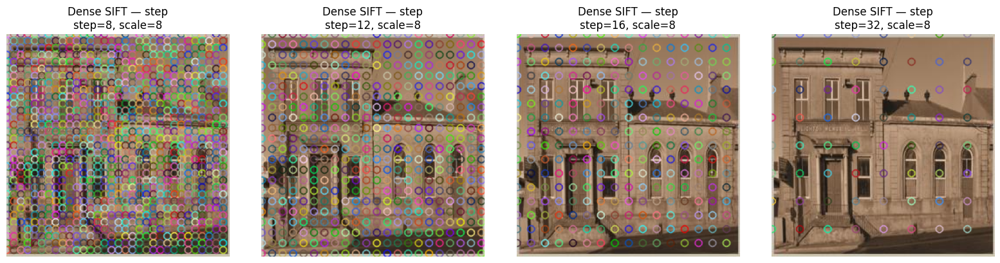

In [35]:
steps = [8, 12, 16, 32]
scale = 8

sample_idx = 70
img = np.array(data_train[sample_idx][0])

plt.figure(figsize=(16, 4))
for i, s in enumerate(steps, 1):
    plt.subplot(1, 4, i)
    show_dense_sift(img, step=s, scale=scale, title="Dense SIFT — step")
plt.tight_layout()
plt.show()


In [36]:
# DENSE SIFT — STEP SIZE EXPERIMENT
print("TESTING DENSE SIFT (VARYING STEP SIZE)")

dense_steps = [8, 12, 16, 32]   
dense_scale = 8            
dense_results = {}

for step in dense_steps:
    print(f"\nDense SIFT with step={step}, scale={dense_scale}")
    
    bovw_params = {
        "detector_type": "DSIFT",          
        "codebook_size": 512,
        "dense_kwargs": {
            "step": step,
            "scale": dense_scale,
        },
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5,
        verbose=False,
    )
    
    dense_results[step] = scores
    
    print(f"[Dense SIFT step={step}] Results:")
    print(f"  Train Accuracy:  {scores.train.accuracy.mean:.4f} ± {scores.train.accuracy.std:.4f}")
    print(f"  Val Accuracy:   {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")
    print(f"  Val Precision:  {scores.val.precision.mean:.4f} ± {scores.val.precision.std:.4f}")
    print(f"  Val Recall:     {scores.val.recall.mean:.4f} ± {scores.val.recall.std:.4f}")
    print(f"  Val F1-Score:   {scores.val.f1.mean:.4f} ± {scores.val.f1.std:.4f}")

print("\nDENSE SIFT (STEP) SUMMARY")
for step in dense_steps:
    print(f"step={step:2d} -> Accuracy Train: {dense_results[step].train.accuracy.mean:.4f} ± {dense_results[step].train.accuracy.std:.4f}")
    print(f"step={step:2d} -> Accuracy Val:  {dense_results[step].val.accuracy.mean:.4f} ± {dense_results[step].val.accuracy.std:.4f}")
    print("")


TESTING DENSE SIFT (VARYING STEP SIZE)

Dense SIFT with step=8, scale=8


100%|██████████| 5/5 [05:17<00:00, 63.50s/it]


[Dense SIFT step=8] Results:
  Train Accuracy:  0.4181 ± 0.0026
  Val Accuracy:   0.3230 ± 0.0063
  Val Precision:  0.3142 ± 0.0074
  Val Recall:     0.3230 ± 0.0063
  Val F1-Score:   0.3131 ± 0.0067

Dense SIFT with step=12, scale=8


100%|██████████| 5/5 [03:35<00:00, 43.09s/it]


[Dense SIFT step=12] Results:
  Train Accuracy:  0.4248 ± 0.0026
  Val Accuracy:   0.2972 ± 0.0046
  Val Precision:  0.2880 ± 0.0053
  Val Recall:     0.2972 ± 0.0046
  Val F1-Score:   0.2882 ± 0.0045

Dense SIFT with step=16, scale=8


100%|██████████| 5/5 [02:32<00:00, 30.58s/it]


[Dense SIFT step=16] Results:
  Train Accuracy:  0.4240 ± 0.0029
  Val Accuracy:   0.2816 ± 0.0051
  Val Precision:  0.2718 ± 0.0051
  Val Recall:     0.2816 ± 0.0051
  Val F1-Score:   0.2723 ± 0.0046

Dense SIFT with step=32, scale=8


100%|██████████| 5/5 [01:12<00:00, 14.52s/it]

[Dense SIFT step=32] Results:
  Train Accuracy:  0.3964 ± 0.0031
  Val Accuracy:   0.2278 ± 0.0077
  Val Precision:  0.2184 ± 0.0073
  Val Recall:     0.2278 ± 0.0077
  Val F1-Score:   0.2200 ± 0.0078

DENSE SIFT (STEP) SUMMARY
step= 8 -> Accuracy Train: 0.4181 ± 0.0026
step= 8 -> Accuracy Val:  0.3230 ± 0.0063

step=12 -> Accuracy Train: 0.4248 ± 0.0026
step=12 -> Accuracy Val:  0.2972 ± 0.0046

step=16 -> Accuracy Train: 0.4240 ± 0.0029
step=16 -> Accuracy Val:  0.2816 ± 0.0051

step=32 -> Accuracy Train: 0.3964 ± 0.0031
step=32 -> Accuracy Val:  0.2278 ± 0.0077



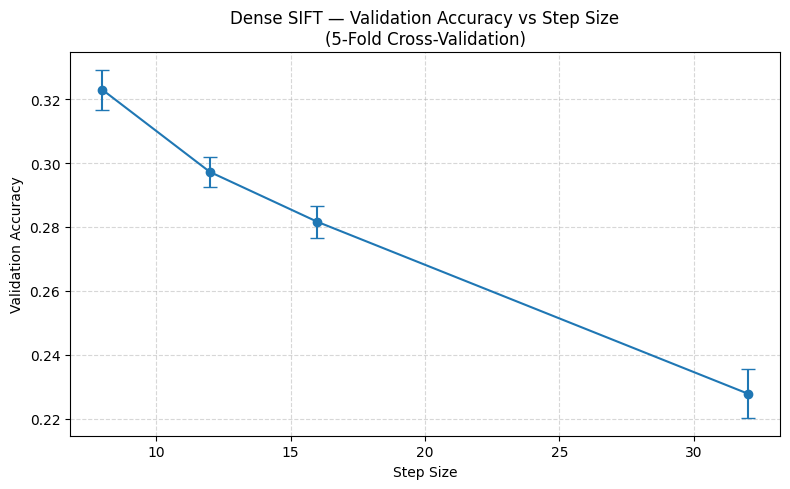

In [37]:
# Plot Dense SIFT Validation Accuracy vs Step Size (5-Fold CV)
fixed_scale = 8

dense_steps = [8, 12, 16, 32]  

acc_means = [dense_results[s].val.accuracy.mean for s in dense_steps]
acc_stds  = [dense_results[s].val.accuracy.std  for s in dense_steps]

plot_cv_accuracy(
    x_values=dense_steps,
    means=acc_means,
    stds=acc_stds,
    descriptor_name="Dense SIFT",
    hyperparam_name="Step Size"
)

### Scale Size Evaluation

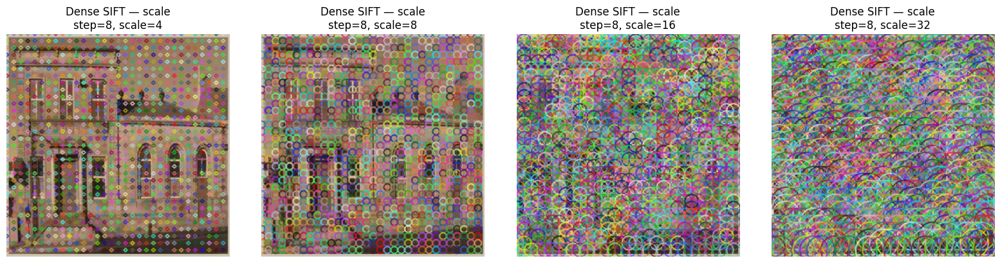

In [38]:
step = 8
scales = [4, 8, 16, 32]

sample_idx = 70
img = np.array(data_train[sample_idx][0])

plt.figure(figsize=(16, 4))
for i, sc in enumerate(scales, 1):
    plt.subplot(1, 4, i)
    show_dense_sift(img, step=step, scale=sc, title="Dense SIFT — scale")
plt.tight_layout()
plt.show()

In [ ]:
# DENSE SIFT — SCALE SIZE EXPERIMENT
print("TESTING DENSE SIFT (VARYING SCALE SIZE)")

dense_step = 8   
dense_scales = [4, 8, 16, 32]            
dense_results = {}

for scale in dense_scales:
    print(f"\nDense SIFT with step={dense_step}, scale={scale}")
    
    bovw_params = {
        "detector_type": "DSIFT",          
        "codebook_size": 512,
        "dense_kwargs": {
            "step": dense_step,
            "scale": scale,
        },
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5,
        verbose=False,
    )
    
    dense_results[scale] = scores
    
    print(f"[Dense SIFT step={dense_step}, scale={scale}] Results:")
    print(f"  Train Accuracy:  {scores.train.accuracy.mean:.4f} ± {scores.train.accuracy.std:.4f}")
    print(f"  Val Accuracy:   {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")
    print(f"  Val Precision:  {scores.val.precision.mean:.4f} ± {scores.val.precision.std:.4f}")
    print(f"  Val Recall:     {scores.val.recall.mean:.4f} ± {scores.val.recall.std:.4f}")
    print(f"  Val F1-Score:   {scores.val.f1.mean:.4f} ± {scores.val.f1.std:.4f}")

print("\nDENSE SIFT (SCALE) SUMMARY")
for scale in dense_scales:
    print(f"scale={scale:2d} -> Accuracy Train: {dense_results[scale].train.accuracy.mean:.4f} ± {dense_results[scale].train.accuracy.std:.4f}")
    print(f"scale={scale:2d} -> Accuracy Val:  {dense_results[scale].val.accuracy.mean:.4f} ± {dense_results[scale].val.accuracy.std:.4f}")
    print("")


TESTING DENSE SIFT (VARYING SCALE SIZE)

Dense SIFT with step=8, scale=4


100%|██████████| 5/5 [05:22<00:00, 64.46s/it]


[Dense SIFT step=8, scale=4] Results:
  Train Accuracy:  0.4195 ± 0.0018
  Val Accuracy:   0.3251 ± 0.0070
  Val Precision:  0.3182 ± 0.0056
  Val Recall:     0.3251 ± 0.0070
  Val F1-Score:   0.3161 ± 0.0063

Dense SIFT with step=8, scale=8


100%|██████████| 5/5 [04:38<00:00, 55.67s/it]


[Dense SIFT step=8, scale=8] Results:
  Train Accuracy:  0.4211 ± 0.0041
  Val Accuracy:   0.3276 ± 0.0110
  Val Precision:  0.3197 ± 0.0118
  Val Recall:     0.3276 ± 0.0110
  Val F1-Score:   0.3184 ± 0.0114

Dense SIFT with step=8, scale=16


100%|██████████| 5/5 [04:47<00:00, 57.55s/it]


[Dense SIFT step=8, scale=16] Results:
  Train Accuracy:  0.4219 ± 0.0017
  Val Accuracy:   0.3261 ± 0.0019
  Val Precision:  0.3185 ± 0.0028
  Val Recall:     0.3261 ± 0.0019
  Val F1-Score:   0.3167 ± 0.0027

Dense SIFT with step=8, scale=32


100%|██████████| 5/5 [04:39<00:00, 55.88s/it]

[Dense SIFT step=8, scale=32] Results:
  Train Accuracy:  0.4206 ± 0.0050
  Val Accuracy:   0.3286 ± 0.0099
  Val Precision:  0.3204 ± 0.0111
  Val Recall:     0.3286 ± 0.0099
  Val F1-Score:   0.3192 ± 0.0099

DENSE SIFT (SCALE) SUMMARY
scale= 4 -> Accuracy Train: 0.4195 ± 0.0018
scale= 4 -> Accuracy Val:  0.3251 ± 0.0070

scale= 8 -> Accuracy Train: 0.4211 ± 0.0041
scale= 8 -> Accuracy Val:  0.3276 ± 0.0110

scale=16 -> Accuracy Train: 0.4219 ± 0.0017
scale=16 -> Accuracy Val:  0.3261 ± 0.0019

scale=32 -> Accuracy Train: 0.4206 ± 0.0050
scale=32 -> Accuracy Val:  0.3286 ± 0.0099



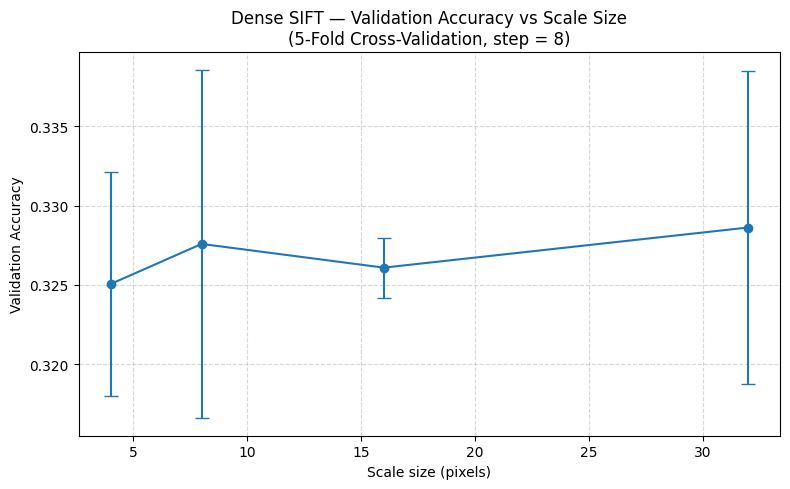

In [41]:
# Plot Dense SIFT Validation Accuracy vs Scale Size (5-Fold CV)

fixed_step = 8

dense_scales = [4, 8, 16, 32]  

# Accuracy (CV test)
acc_means = [dense_results[s].val.accuracy.mean for s in dense_scales]
acc_stds  = [dense_results[s].val.accuracy.std  for s in dense_scales]

plt.figure(figsize=(8, 5))
plt.errorbar(dense_scales, acc_means, yerr=acc_stds,
             marker='o', capsize=5)

plt.title(f"Dense SIFT — Validation Accuracy vs Scale Size\n(5-Fold Cross-Validation, step = {fixed_step})")
plt.xlabel("Scale size (pixels)")
plt.ylabel("Validation Accuracy")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


In [18]:
# Tested on the held-out test set using the best step and scale selected by cross-validation (step=8, scale=32)
bovw_params = {
    "detector_type": "DSIFT",
    "codebook_size": 512,
    "dense_kwargs": {"step": 8, "scale": 32},
}

classifier_cls = LogisticRegression
classifier_params = {
    "max_iter": 1000,
    "class_weight": "balanced",
}
bovw = BOVW(**bovw_params)
classifier = classifier_cls(**classifier_params)
dsift_bovw, dsift_classifier = train(dataset=data_train, bovw=bovw, classifier=classifier)

dsift_acc, dsift_prec, dsift_rec, dsift_f1, dsift_y_test, dsift_y_pred, dsift_y_score = test(dataset=data_test, bovw=dsift_bovw, classifier=dsift_classifier, return_predictions=True)

Phase [Training]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:16<00:00, 541.28it/s]


Fitting the codebook
Computing the bovw histograms
Fitting the classifier
Accuracy on Phase[Train]: 0.41367816091954024
Precision on Phase[Train]: 0.4108867024805957
Recall on Phase[Train]: 0.41367816091954024
F1-Score on Phase[Train]: 0.40691689982995005


Phase [Eval]: Extracting the descriptors: 100%|██████████| 2200/2200 [00:03<00:00, 558.23it/s]


Computing the bovw histograms
predicting the values
Accuracy on Phase[Test]: 0.31136363636363634
Precision on Phase[Test]: 0.2987225017749022
Recall on Phase[Test]: 0.31136363636363634
F1-Score on Phase[Test]: 0.29956552744347714


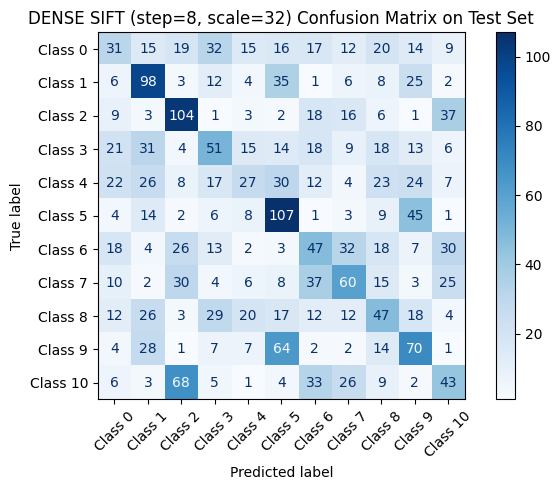

In [19]:
plot_confusion_matrix(dsift_y_test, dsift_y_pred, title="DENSE SIFT (step=8, scale=32) Confusion Matrix on Test Set")  

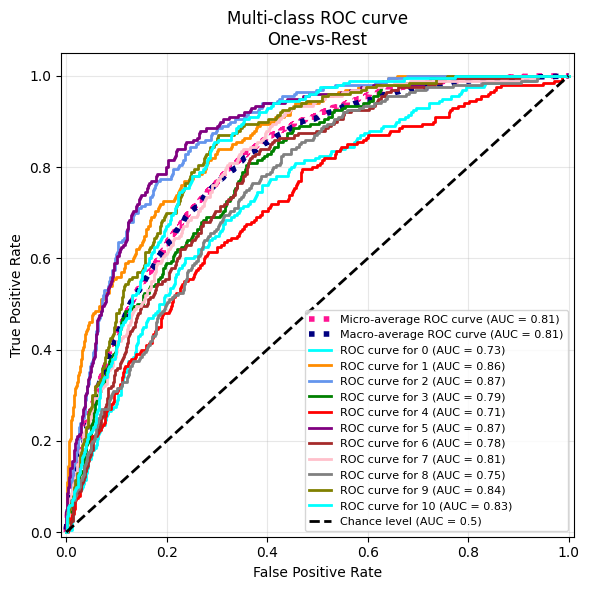


Micro-averaged One-vs-Rest ROC AUC score: 0.81
Macro-averaged One-vs-Rest ROC AUC score: 0.81

Per-class ROC AUC scores:
  0: 0.73
  1: 0.86
  2: 0.87
  3: 0.79
  4: 0.71
  5: 0.87
  6: 0.78
  7: 0.81
  8: 0.75
  9: 0.84
  10: 0.83


In [20]:
plot_multiclass_roc(dsift_y_test, dsift_y_score, figsize=(6,6))

SECTION B: FINAL COMPARISON - SIFT vs DENSE SIFT


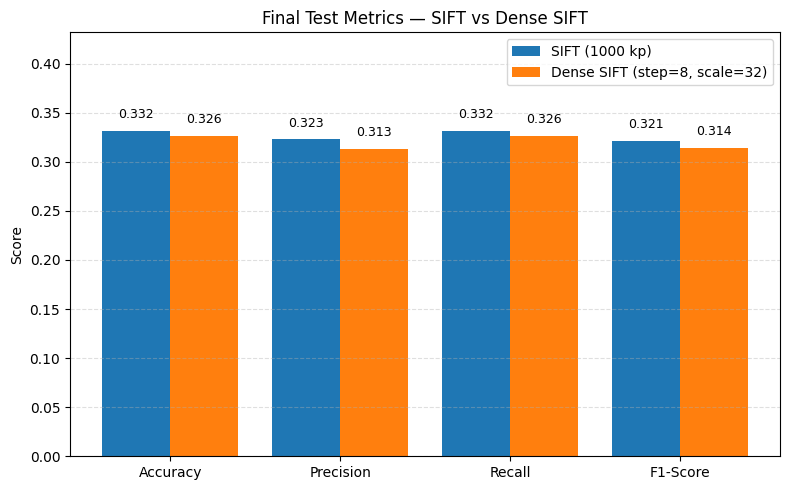

In [48]:
# Final Comparison: SIFT vs Dense SIFT in our test data
print("SECTION B: FINAL COMPARISON - SIFT vs DENSE SIFT")
sift_metrics = {
    "Accuracy": sift_acc,
    "Precision": sift_prec,
    "Recall": sift_rec,
    "F1-Score": sift_f1
}

dense_metrics = {
    "Accuracy": dsift_acc,  
    "Precision": dsift_prec,
    "Recall": dsift_rec,
    "F1-Score": dsift_f1
}

plot_final_metrics_comparison(
    method_names=["SIFT (1000 kp)", "Dense SIFT (step=8, scale=32)"],
    metrics_list=[sift_metrics, dense_metrics],
    title="Final Test Metrics — SIFT vs Dense SIFT"
)


We will still work with SIFT (kp=100)

## C) Size of codebook

In this experiment, we investigate how the size of the visual vocabulary (codebook) influences the performance of the Bag-of-Words representation for scene recognition. The number of visual words, k, determines the granularity of feature quantization and, therefore, directly affects both discriminative capability and computational cost. We aim to answer the following research questions:

- How does increasing the codebook size impact classification accuracy?

- Is there a point of diminishing returns where larger codebooks no longer improve performance?

- How does codebook size affect computation time?

In [15]:
size_results = {}

for size in [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048]:
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": size,
        "detector_kwargs": {"nfeatures": 1000},
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
            bovw_kwargs=bovw_params,
            classifier_cls=classifier_cls,
            classifier_kwargs=classifier_params,
            n_splits=5
    )
        
    size_results[size] = scores


print("\nSIFT SUMMARY")
for size in size_results.keys():
    print(f"codebook_size={size} -> Accuracy Train: {size_results[size].train.accuracy.mean:.4f} ± {size_results[size].train.accuracy.std:.4f}")
    print(f"codebook_size={size} -> Accuracy Val: {size_results[size].val.accuracy.mean:.4f} ± {size_results[size].val.accuracy.std:.4f}")
    print()

Phase [Setup]: Extracting the descriptors:   8%|▊         | 692/8700 [00:00<00:04, 1627.12it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  15%|█▌        | 1341/8700 [00:00<00:04, 1542.12it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


  0%|          | 0/5 [00:00<?, ?it/s]/home/loreoregi/Desktop/Computer Vision/C3/Project/project-team-6/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/loreoregi/Desktop/Computer Vision/C3/Project/project-team-6/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
 20%|██        | 1/5 [00:04<00:17,  4.26s/it]/home/loreoregi/Desktop/Computer Vision/C3/Project/project-team-6/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMet

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  14%|█▍        | 1207/8700 [00:00<00:04, 1506.23it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


 40%|████      | 2/5 [00:06<00:08,  2.99s/it]/home/loreoregi/Desktop/Computer Vision/C3/Project/project-team-6/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/loreoregi/Desktop/Computer Vision/C3/Project/project-team-6/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
 60%|██████    | 3/5 [00:09<00:06,  3.03s/it]/home/loreoregi/Desktop/Computer Vision/C3/Project/project-team-6/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: Unde

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  14%|█▍        | 1246/8700 [00:00<00:04, 1739.84it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  10%|▉         | 850/8700 [00:00<00:04, 1737.72it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  16%|█▌        | 1376/8700 [00:00<00:04, 1735.46it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:   8%|▊         | 708/8700 [00:00<00:04, 1740.74it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  14%|█▍        | 1247/8700 [00:00<00:04, 1735.11it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  10%|▉         | 859/8700 [00:00<00:04, 1733.36it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  14%|█▍        | 1202/8700 [00:00<00:04, 1650.74it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:   8%|▊         | 716/8700 [00:00<00:04, 1748.81it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  14%|█▍        | 1259/8700 [00:00<00:04, 1739.92it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  10%|▉         | 829/8700 [00:00<00:04, 1708.57it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  16%|█▌        | 1353/8700 [00:00<00:04, 1731.69it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  10%|▉         | 853/8700 [00:00<00:04, 1741.45it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  14%|█▍        | 1198/8700 [00:00<00:04, 1670.73it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  10%|▉         | 867/8700 [00:00<00:04, 1766.12it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  14%|█▍        | 1224/8700 [00:00<00:04, 1720.55it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  10%|▉         | 835/8700 [00:00<00:04, 1721.02it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  16%|█▌        | 1356/8700 [00:00<00:04, 1716.72it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [04:26<00:00, 53.32s/it]


SIFT SUMMARY
codebook_size=2 -> Accuracy Train: 0.1254 ± 0.0132
codebook_size=2 -> Accuracy Val: 0.1292 ± 0.0200

codebook_size=4 -> Accuracy Train: 0.1822 ± 0.0130
codebook_size=4 -> Accuracy Val: 0.1841 ± 0.0111

codebook_size=8 -> Accuracy Train: 0.2149 ± 0.0127
codebook_size=8 -> Accuracy Val: 0.2140 ± 0.0133

codebook_size=16 -> Accuracy Train: 0.2519 ± 0.0074
codebook_size=16 -> Accuracy Val: 0.2441 ± 0.0087

codebook_size=32 -> Accuracy Train: 0.2878 ± 0.0062
codebook_size=32 -> Accuracy Val: 0.2735 ± 0.0068

codebook_size=64 -> Accuracy Train: 0.3239 ± 0.0028
codebook_size=64 -> Accuracy Val: 0.2966 ± 0.0104

codebook_size=128 -> Accuracy Train: 0.3566 ± 0.0058
codebook_size=128 -> Accuracy Val: 0.3132 ± 0.0031

codebook_size=256 -> Accuracy Train: 0.4026 ± 0.0061
codebook_size=256 -> Accuracy Val: 0.3200 ± 0.0077

codebook_size=512 -> Accuracy Train: 0.4534 ± 0.0036
codebook_size=512 -> Accuracy Val: 0.3325 ± 0.0078

codebook_size=1024 -> Accuracy Train: 0.5039 ± 0.0034
codeb

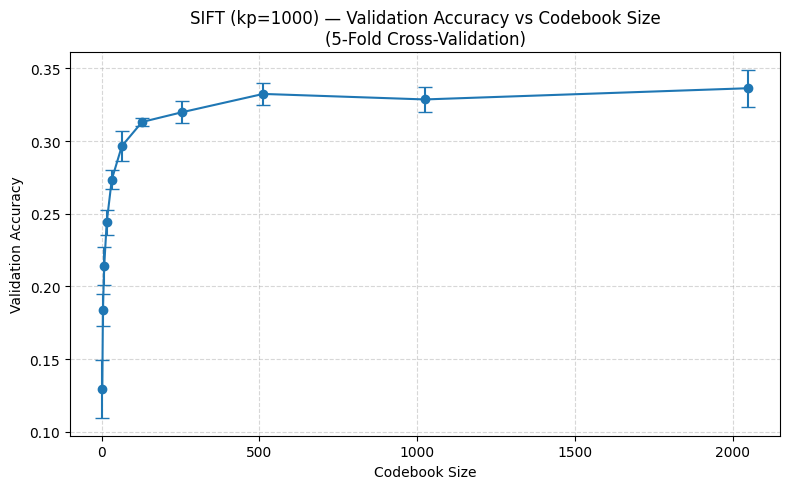

In [16]:
# Plot SIFT (kp=1000) Validation Accuracy vs Codebook Size (5-Fold CV)

# Since the dataset is reasonably balanced and we use stratified 5-fold cross-validation, 
# accuracy is a reliable metric for evaluating performance in this experiment.

k_codebook = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048]

acc_means = [size_results[k].val.accuracy.mean for k in k_codebook]
acc_stds  = [size_results[k].val.accuracy.std for k in k_codebook]

plot_cv_accuracy(
    x_values=k_codebook,
    means=acc_means,
    stds=acc_stds,
    descriptor_name="SIFT (kp=1000)",
    hyperparam_name="Codebook Size"
)


In [21]:
# Tested on the held-out test set using the best codebook size selected by cross-validation (2048)
bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 2048,
    "detector_kwargs": {"nfeatures": 1000},
}

classifier_cls = LogisticRegression
classifier_params = {
    "max_iter": 1000,
    "class_weight": "balanced",
}
bovw = BOVW(**bovw_params)
classifier = classifier_cls(**classifier_params)
sift_2048_bovw, sift_2048_classifier = train(dataset=data_train, bovw=bovw, classifier=classifier)

sift_acc_2048, sift_prec_2048, sift_rec_2048, sift_f1_2048, sift_y_test_2048, sift_y_pred_2048, sift_y_score_2048 = test(dataset=data_test, bovw=sift_2048_bovw, classifier=sift_2048_classifier, return_predictions=True)

Phase [Training]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:12<00:00, 723.72it/s]


Fitting the codebook
Computing the bovw histograms
Fitting the classifier
Accuracy on Phase[Train]: 0.5473672108530697
Precision on Phase[Train]: 0.5467161254741641
Recall on Phase[Train]: 0.5473672108530697
F1-Score on Phase[Train]: 0.5435197660379997


Phase [Eval]: Extracting the descriptors: 100%|██████████| 2200/2200 [00:02<00:00, 1092.03it/s]


Computing the bovw histograms
predicting the values
Accuracy on Phase[Test]: 0.3431818181818182
Precision on Phase[Test]: 0.3344372388669758
Recall on Phase[Test]: 0.3431818181818182
F1-Score on Phase[Test]: 0.33332176160331883


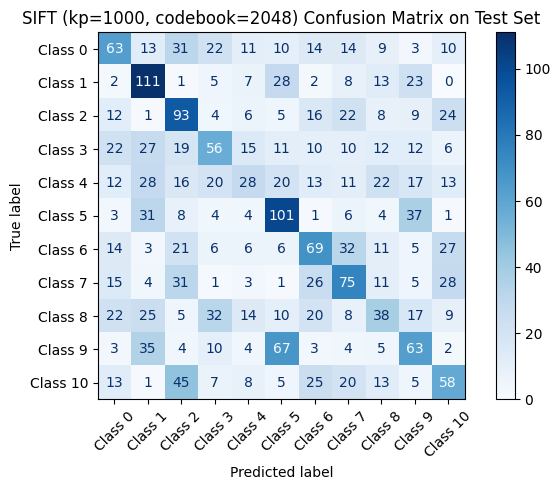

In [22]:
plot_confusion_matrix(sift_y_test_2048, sift_y_pred_2048, title="SIFT (kp=1000, codebook=2048) Confusion Matrix on Test Set")

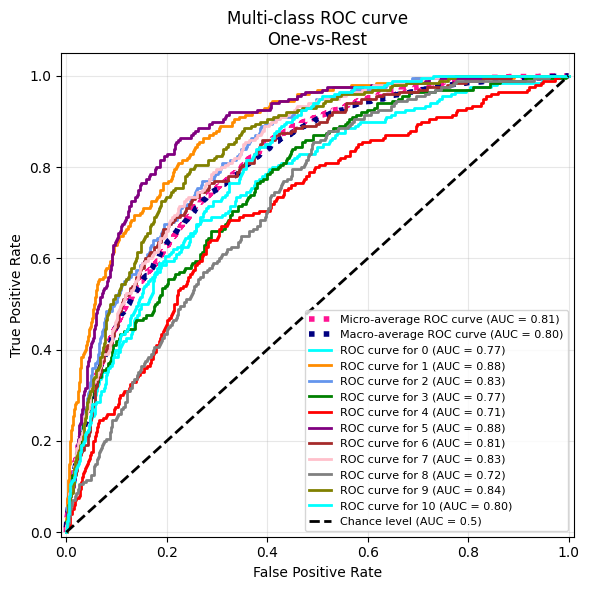


Micro-averaged One-vs-Rest ROC AUC score: 0.81
Macro-averaged One-vs-Rest ROC AUC score: 0.80

Per-class ROC AUC scores:
  0: 0.77
  1: 0.88
  2: 0.83
  3: 0.77
  4: 0.71
  5: 0.88
  6: 0.81
  7: 0.83
  8: 0.72
  9: 0.84
  10: 0.80


In [23]:
plot_multiclass_roc(sift_y_test_2048, sift_y_score_2048, figsize=(6,6))

## D) Spatial Pyramids

In this experiment, we investigate how spatial pyramids influence the performance of the Bag-of-Words representation for image classification. Spatial pyramids capture the spatial distribution of visual words at multiple scales, which can be particularly useful for scene understanding. We aim to answer the following research questions:

- How does adding spatial information through pyramid levels improve classification accuracy?

- Is there an optimal number of pyramid levels that balances discriminative power with computational cost?

- Does the spatial structure of visual words in natural scenes provide significant benefits for scene recognition?

We will test pyramid levels from 1 (no pyramid) to 5, keeping the SIFT descriptor with 1000 keypoints and a codebook size of 512.

In [7]:
pyramid_results = {}

for level in range(1, 6):
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "pyramid_levels": level,
        "detector_kwargs": {"nfeatures": 1000},
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
        
    pyramid_results[level] = scores


print("\nSPATIAL PYRAMIDS SUMMARY")
for level in pyramid_results.keys():
    print(f"pyramid_level={level} -> Accuracy Train: {pyramid_results[level].train.accuracy.mean:.4f} ± {pyramid_results[level].train.accuracy.std:.4f}")
    print(f"pyramid_level={level} -> Accuracy Val: {pyramid_results[level].val.accuracy.mean:.4f} ± {pyramid_results[level].val.accuracy.std:.4f}")
    print()

Phase [Setup]: Extracting the descriptors:   6%|▌         | 489/8700 [00:05<01:23, 98.85it/s] 

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  58%|█████▊    | 5083/8700 [00:52<00:36, 99.67it/s] 

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:   6%|▌         | 518/8700 [00:01<00:16, 501.26it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5134/8700 [00:09<00:07, 503.60it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:   6%|▌         | 540/8700 [00:01<00:15, 532.40it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5161/8700 [00:09<00:04, 720.26it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:   6%|▌         | 530/8700 [00:01<00:15, 525.16it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  60%|█████▉    | 5201/8700 [00:07<00:04, 783.37it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:   6%|▌         | 538/8700 [00:01<00:15, 536.50it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5142/8700 [00:09<00:06, 558.72it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


100%|██████████| 5/5 [06:37<00:00, 79.57s/it]




SPATIAL PYRAMIDS SUMMARY
pyramid_level=1 -> Accuracy Train: 0.4514 ± 0.0035
pyramid_level=1 -> Accuracy Val: 0.3271 ± 0.0140

pyramid_level=2 -> Accuracy Train: 0.7840 ± 0.0049
pyramid_level=2 -> Accuracy Val: 0.3109 ± 0.0108

pyramid_level=3 -> Accuracy Train: 0.9977 ± 0.0008
pyramid_level=3 -> Accuracy Val: 0.3079 ± 0.0071

pyramid_level=4 -> Accuracy Train: 1.0000 ± 0.0001
pyramid_level=4 -> Accuracy Val: 0.3109 ± 0.0118

pyramid_level=5 -> Accuracy Train: 1.0000 ± 0.0000
pyramid_level=5 -> Accuracy Val: 0.3162 ± 0.0097



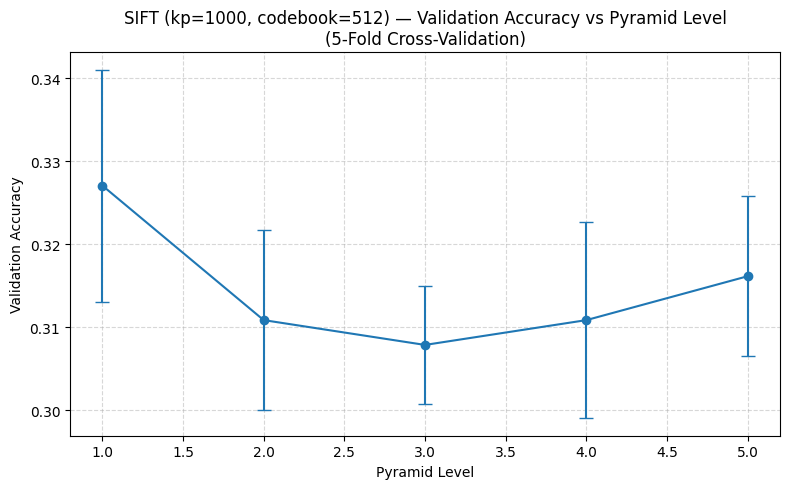

In [9]:
# Plot SIFT (kp=1000, codebook=512) Validation Accuracy vs Pyramid Level (5-Fold CV)

# Since the dataset is reasonably balanced and we use stratified 5-fold cross-validation, 
# accuracy is a reliable metric for evaluating performance in this experiment.

pyramid_levels = list(range(1, 6))

acc_means = [pyramid_results[level].val.accuracy.mean for level in pyramid_levels]
acc_stds  = [pyramid_results[level].val.accuracy.std for level in pyramid_levels]

plot_cv_accuracy(
    x_values=pyramid_levels,
    means=acc_means,
    stds=acc_stds,
    descriptor_name="SIFT (kp=1000, codebook=512)",
    hyperparam_name="Pyramid Level"
)

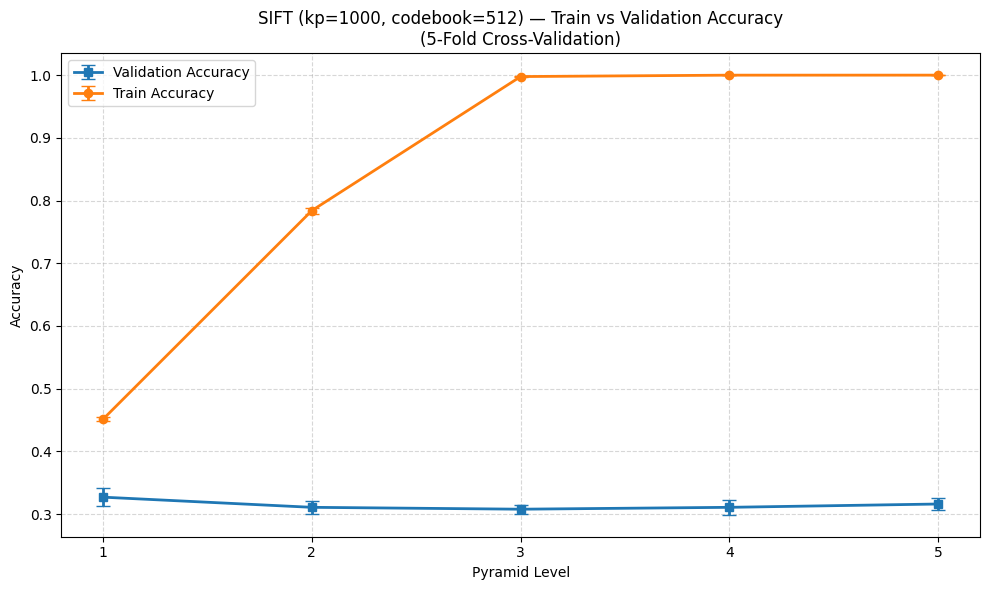

In [15]:
# Compare Train vs Validation Metrics across Pyramid Levels

train_means = [pyramid_results[level].train.accuracy.mean for level in pyramid_levels]
train_stds = [pyramid_results[level].train.accuracy.std for level in pyramid_levels]
 
plt.figure(figsize=(10, 6))
plt.errorbar(pyramid_levels, acc_means, yerr=acc_stds, marker='s', capsize=5, label='Validation Accuracy', linewidth=2)
plt.errorbar(pyramid_levels, train_means, yerr=train_stds, marker='o', capsize=5, label='Train Accuracy', linewidth=2)

plt.title("SIFT (kp=1000, codebook=512) — Train vs Validation Accuracy\n(5-Fold Cross-Validation)")
plt.xlabel("Pyramid Level")
plt.ylabel("Accuracy")
plt.xticks(pyramid_levels)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

In [11]:
# Tested on the held-out test set using the best pyramid level selected by cross-validation
best_pyramid_level = pyramid_levels[np.argmax(acc_means)]

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "pyramid_levels": best_pyramid_level,
    "detector_kwargs": {"nfeatures": 1000},
}

classifier_cls = LogisticRegression
classifier_params = {
    "max_iter": 1000,
    "class_weight": "balanced",
}
bovw = BOVW(**bovw_params)
classifier = classifier_cls(**classifier_params)
sift_pyr_bovw, sift_pyr_classifier = train(dataset=data_train, bovw=bovw, classifier=classifier)

sift_pyr_acc, sift_pyr_prec, sift_pyr_rec, sift_pyr_f1, sift_pyr_y_test, sift_pyr_y_pred, sift_pyr_y_score = test(dataset=data_test, bovw=sift_pyr_bovw, classifier=sift_pyr_classifier, return_predictions=True)

Phase [Training]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:17<00:00, 504.98it/s]



Fitting the codebook
Computing the bovw histograms
Computing the bovw histograms
Fitting the classifier
Fitting the classifier
Accuracy on Phase[Train]: 0.44332030351805013
Precision on Phase[Train]: 0.4384948095514995
Recall on Phase[Train]: 0.44332030351805013
F1-Score on Phase[Train]: 0.4373948607618297
Accuracy on Phase[Train]: 0.44332030351805013
Precision on Phase[Train]: 0.4384948095514995
Recall on Phase[Train]: 0.44332030351805013
F1-Score on Phase[Train]: 0.4373948607618297


Phase [Eval]: Extracting the descriptors: 100%|██████████| 2200/2200 [00:35<00:00, 61.30it/s]



Computing the bovw histograms
predicting the values
Accuracy on Phase[Test]: 0.3281818181818182
Precision on Phase[Test]: 0.317164535582296
Recall on Phase[Test]: 0.3281818181818182
F1-Score on Phase[Test]: 0.3176300833286955
predicting the values
Accuracy on Phase[Test]: 0.3281818181818182
Precision on Phase[Test]: 0.317164535582296
Recall on Phase[Test]: 0.3281818181818182
F1-Score on Phase[Test]: 0.3176300833286955


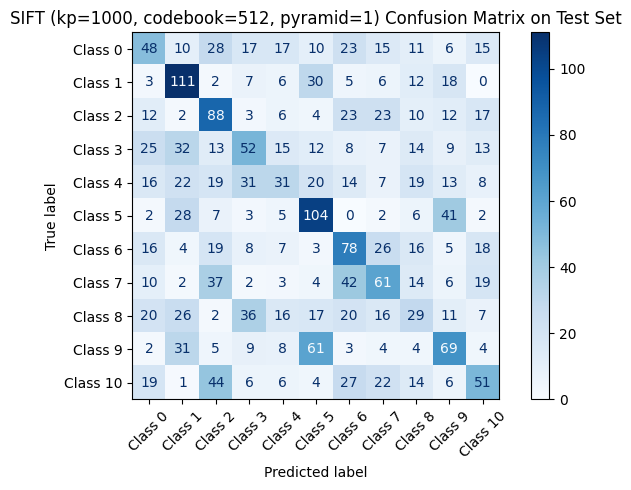

In [12]:
plot_confusion_matrix(sift_pyr_y_test, sift_pyr_y_pred, title=f"SIFT (kp=1000, codebook=512, pyramid={best_pyramid_level}) Confusion Matrix on Test Set")

## E) Normalization

Since the way the data is normalized and preprocessed can depend on the classifier, we're going to try different normalizations

### Descriptor Normalization

In [9]:
normalization_results = {}

for descriptor_normalization in [None, "L1", "L2", "Root"]:
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "descriptor_normalization": descriptor_normalization,
        "detector_kwargs": {"nfeatures": 1000},
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
            bovw_kwargs=bovw_params,
            classifier_cls=classifier_cls,
            classifier_kwargs=classifier_params,
            n_splits=5
    )
    
    normalization_results[descriptor_normalization] = scores
    
    normalization_results[descriptor_normalization] = scores
    
    # print(f"[SIFT descriptor_normalization={descriptor_normalization}] Results:")
    # print(f"  Train Accuracy:  {scores.train.accuracy.mean:.4f} ± {scores.train.accuracy.std:.4f}")
    # print(f"  Test Accuracy:   {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")
    # print(f"  Test Precision:  {scores.val.precision.mean:.4f} ± {scores.val.precision.std:.4f}")
    # print(f"  Test Recall:     {scores.val.recall.mean:.4f} ± {scores.val.recall.std:.4f}")
    # print(f"  Test F1-Score:   {scores.val.f1.mean:.4f} ± {scores.val.f1.std:.4f}")


print("\nSIFT SUMMARY")
for norm in normalization_results.keys():
    print(f"descriptor_normalization={norm} -> Accuracy Train: {normalization_results[norm].train.accuracy.mean:.4f} ± {normalization_results[norm].train.accuracy.std:.4f}")
    print(f"descriptor_normalization={norm} -> Accuracy Test: {normalization_results[norm].val.accuracy.mean:.4f} ± {normalization_results[norm].val.accuracy.std:.4f}")
    print()

Phase [Setup]: Extracting the descriptors:  50%|█████     | 4353/8700 [00:01<00:01, 2719.52it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2690.09it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4322/8700 [00:01<00:01, 2359.18it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2367.44it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4268/8700 [00:01<00:01, 2387.29it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2348.45it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  51%|█████     | 4458/8700 [00:01<00:01, 2347.90it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2329.15it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [00:59<00:00, 11.90s/it]


SIFT SUMMARY
descriptor_normalization=None -> Accuracy Train: 0.4499 ± 0.0031
descriptor_normalization=None -> Accuracy Test: 0.3351 ± 0.0037

descriptor_normalization=L1 -> Accuracy Train: 0.4571 ± 0.0072
descriptor_normalization=L1 -> Accuracy Test: 0.3315 ± 0.0045

descriptor_normalization=L2 -> Accuracy Train: 0.4470 ± 0.0040
descriptor_normalization=L2 -> Accuracy Test: 0.3174 ± 0.0074

descriptor_normalization=Root -> Accuracy Train: 0.4629 ± 0.0030
descriptor_normalization=Root -> Accuracy Test: 0.3362 ± 0.0118



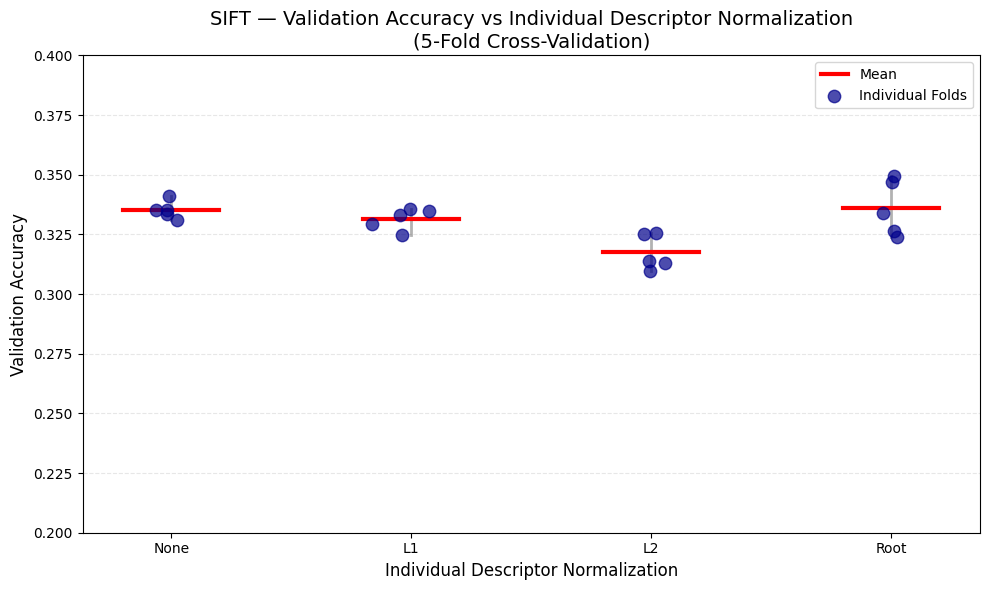

In [10]:
x_vals = [None, "L1", "L2", "Root"]
printable_x_vals = ["None", "L1", "L2", "Root"]
all_accuracies = [normalization_results[key].val.accuracy.all for key in x_vals]
plot_cv_accuracy_boxplot(printable_x_vals, all_accuracies, "SIFT", "Individual Descriptor Normalization", ylim=(0.2, 0.4))

### Joint Normalization

In [11]:
normalization_results = {}

for joint_descriptor_normalization in [None, "MaxAbs", "Standard", "MinMax"]:
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "joint_descriptor_normalization": joint_descriptor_normalization,
        "detector_kwargs": {"nfeatures": 1000},
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
            bovw_kwargs=bovw_params,
            classifier_cls=classifier_cls,
            classifier_kwargs=classifier_params,
            n_splits=5
    )
    
    normalization_results[joint_descriptor_normalization] = scores
    
    normalization_results[joint_descriptor_normalization] = scores
    
    # print(f"[SIFT joint_descriptor_normalization={joint_descriptor_normalization}] Results:")
    # print(f"  Train Accuracy:  {scores.train.accuracy.mean:.4f} ± {scores.train.accuracy.std:.4f}")
    # print(f"  Test Accuracy:   {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")
    # print(f"  Test Precision:  {scores.val.precision.mean:.4f} ± {scores.val.precision.std:.4f}")
    # print(f"  Test Recall:     {scores.val.recall.mean:.4f} ± {scores.val.recall.std:.4f}")
    # print(f"  Test F1-Score:   {scores.val.f1.mean:.4f} ± {scores.val.f1.std:.4f}")


print("\nSIFT SUMMARY")
for norm in normalization_results.keys():
    print(f"joint_descriptor_normalization={norm} -> Accuracy Train: {normalization_results[norm].train.accuracy.mean:.4f} ± {normalization_results[norm].train.accuracy.std:.4f}")
    print(f"joint_descriptor_normalization={norm} -> Accuracy Test: {normalization_results[norm].val.accuracy.mean:.4f} ± {normalization_results[norm].val.accuracy.std:.4f}")
    print()

Phase [Setup]: Extracting the descriptors:  50%|█████     | 4357/8700 [00:01<00:01, 2704.08it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2694.93it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4319/8700 [00:01<00:01, 2715.27it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2672.20it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4355/8700 [00:01<00:01, 2664.46it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2690.77it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  52%|█████▏    | 4529/8700 [00:01<00:01, 2664.94it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2652.23it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:05<00:00, 13.16s/it]


SIFT SUMMARY
joint_descriptor_normalization=None -> Accuracy Train: 0.4497 ± 0.0080
joint_descriptor_normalization=None -> Accuracy Test: 0.3303 ± 0.0132

joint_descriptor_normalization=MaxAbs -> Accuracy Train: 0.4514 ± 0.0039
joint_descriptor_normalization=MaxAbs -> Accuracy Test: 0.3249 ± 0.0091

joint_descriptor_normalization=Standard -> Accuracy Train: 0.4399 ± 0.0035
joint_descriptor_normalization=Standard -> Accuracy Test: 0.3246 ± 0.0121

joint_descriptor_normalization=MinMax -> Accuracy Train: 0.4454 ± 0.0073
joint_descriptor_normalization=MinMax -> Accuracy Test: 0.3255 ± 0.0120



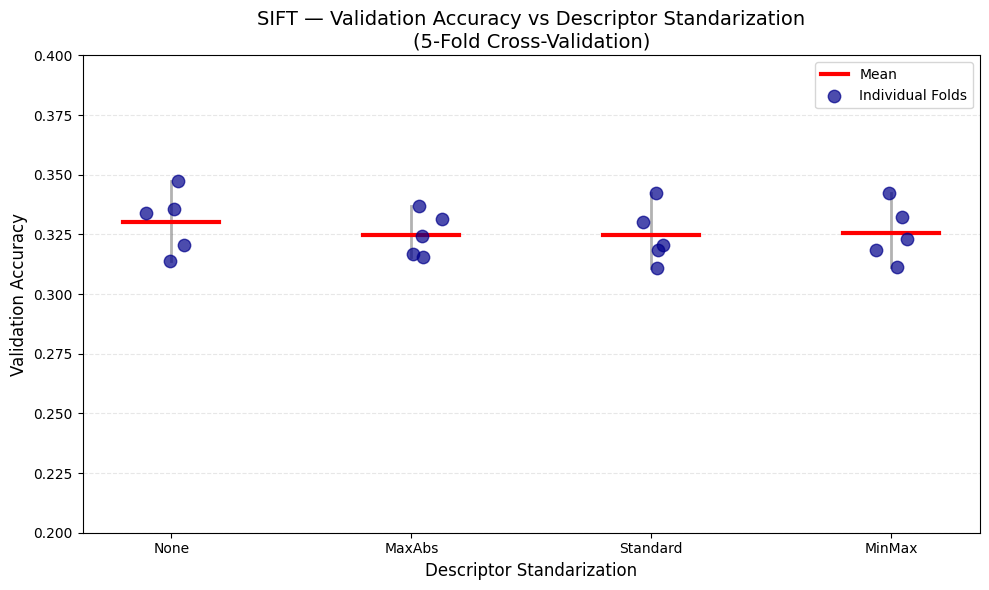

In [13]:
x_vals = [None, "MaxAbs", "Standard", "MinMax"]
printable_x_vals = ["None", "MaxAbs", "Standard", "MinMax"]
all_accuracies = [normalization_results[key].val.accuracy.all for key in x_vals]
plot_cv_accuracy_boxplot(printable_x_vals, all_accuracies, "SIFT", "Descriptor Standarization", ylim=(0.2, 0.4))

## F) Classifiers Experiments

### Logistic Regression Experiments

In [7]:
classifier_results = {}

for penalty in [None, "l1", "l2", "elasticnet"]:
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": 1000},
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
        "penalty": penalty,
        "solver": "saga",
        "l1_ratio": 0.5 if penalty == "elasticnet" else None
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
            bovw_kwargs=bovw_params,
            classifier_cls=classifier_cls,
            classifier_kwargs=classifier_params,
            n_splits=5
    )
        
    classifier_results[penalty] = scores


print("\nSIFT SUMMARY")
for size in classifier_results.keys():
    print(f"codebook_size={size} -> Accuracy Train: {classifier_results[size].train.accuracy.mean:.4f} ± {classifier_results[size].train.accuracy.std:.4f}")
    print(f"codebook_size={size} -> Accuracy Test: {classifier_results[size].val.accuracy.mean:.4f} ± {classifier_results[size].val.accuracy.std:.4f}")
    print()

Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4287/8700 [00:01<00:01, 2334.27it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2310.41it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


 20%|██        | 1/5 [01:36<06:25, 96.37s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 40%|████      | 2/5 [03:21<05:03, 101.28s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 60%|██████    | 3/5 [05:05<03:25, 102.55s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 80%|████████  | 4/5 [06:49<01:43, 103.31s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
Phase [Setup]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2633.15it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4285/8700 [00:01<00:01, 2682.72it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2635.47it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


Phase [Setup]: Extracting the descriptors:  52%|█████▏    | 4498/8700 [00:01<00:01, 2630.39it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2604.74it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [00:55<00:00, 11.06s/it]


SIFT SUMMARY
codebook_size=None -> Accuracy Train: 0.5339 ± 0.0046
codebook_size=None -> Accuracy Test: 0.2671 ± 0.0106

codebook_size=l1 -> Accuracy Train: 0.4102 ± 0.0024
codebook_size=l1 -> Accuracy Test: 0.3242 ± 0.0169

codebook_size=l2 -> Accuracy Train: 0.4469 ± 0.0049
codebook_size=l2 -> Accuracy Test: 0.3252 ± 0.0068

codebook_size=elasticnet -> Accuracy Train: 0.4303 ± 0.0046
codebook_size=elasticnet -> Accuracy Test: 0.3266 ± 0.0152



In [ ]:
def plot_cv_train_test_comparison(x_values, train_fold_values, test_fold_values,
                                   descriptor_name, hyperparam_name, ylim=(0, 1), show_points=True):
    """
    Plot both train and test CV validation accuracy vs a hyperparameter side by side.
    """

    plt.figure(figsize=(12, 6))

    positions = np.arange(len(x_values))

    # Plot training results
    for i, (pos, values) in enumerate(zip(positions, train_fold_values)):
        values = np.array(values)
        mean_val = np.mean(values)
        min_val = np.min(values)
        max_val = np.max(values)

        # Plot vertical line from min to max
        plt.plot([pos, pos], [min_val, max_val],
                color='darkgreen', linewidth=3, alpha=0.5, zorder=1)

        # Plot mean as a horizontal line
        plt.plot([pos - 0.15, pos + 0.15], [mean_val, mean_val],
                color='green', linewidth=4, label='Train Mean' if i == 0 else '', zorder=2)

        # Plot individual points with slight jitter for horizontal separation
        if show_points:
            jitter = np.random.normal(-0.08, 0.02, size=len(values))  # Offset left
            plt.scatter([pos + j for j in jitter], values,
                       color='green', s=100, alpha=0.7, zorder=4, marker='o',
                       edgecolors='darkgreen', linewidths=1.5,
                       label='Train Folds' if i == 0 else '')

    # Plot test results (same position, different marker)
    for i, (pos, values) in enumerate(zip(positions, test_fold_values)):
        values = np.array(values)
        mean_val = np.mean(values)
        min_val = np.min(values)
        max_val = np.max(values)

        # Plot vertical line from min to max
        plt.plot([pos, pos], [min_val, max_val],
                color='darkblue', linewidth=3, alpha=0.5, zorder=1)

        # Plot mean as a horizontal line
        plt.plot([pos - 0.15, pos + 0.15], [mean_val, mean_val],
                color='blue', linewidth=4, label='Test Mean' if i == 0 else '', zorder=2)

        # Plot individual points with slight jitter for horizontal separation
        if show_points:
            jitter = np.random.normal(0.08, 0.02, size=len(values))  # Offset right
            plt.scatter([pos + j for j in jitter], values,
                       color='blue', s=100, alpha=0.7, zorder=4, marker='s',
                       edgecolors='darkblue', linewidths=1.5,
                       label='Test Folds' if i == 0 else '')

    # Set x-axis labels
    plt.xticks(positions, x_values)

    # Set y-axis limits
    if ylim is not None:
        plt.ylim(ylim)

    plt.title(f"{descriptor_name} — Train vs Test Accuracy vs {hyperparam_name}\n(5-Fold Cross-Validation)",
              fontsize=14, fontweight='bold')
    plt.xlabel(hyperparam_name, fontsize=12)
    plt.ylabel("Accuracy", fontsize=12)
    plt.grid(True, linestyle="--", alpha=0.3, axis='y')

    # Add legend
    plt.legend(loc='best', fontsize=10)

    plt.tight_layout()
    plt.show()


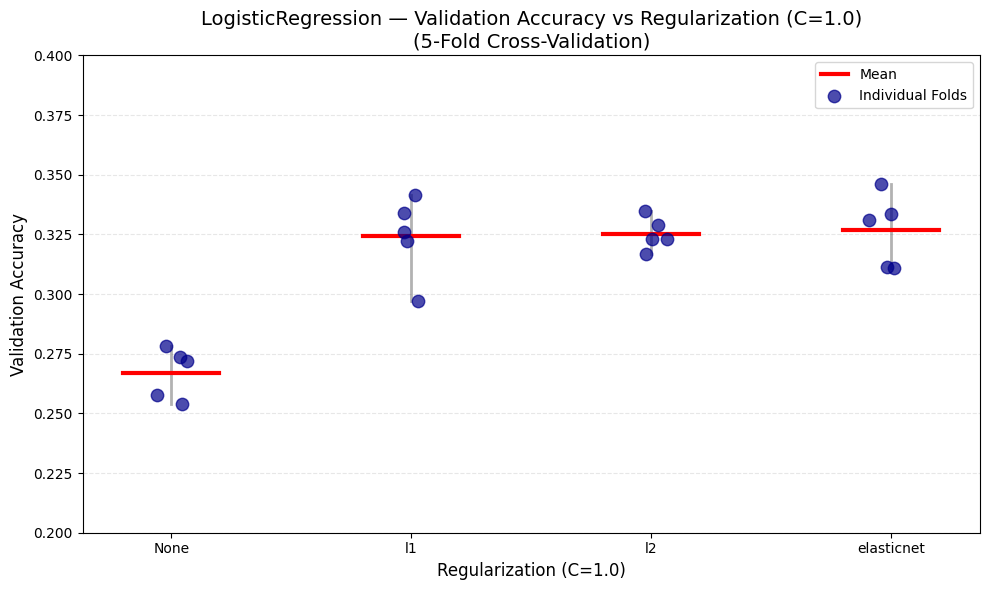

In [11]:
x_vals = [None, "l1", "l2", "elasticnet"]
printable_x_vals = ["None", "l1", "l2", "elasticnet"]
all_accuracies = [classifier_results[key].val.accuracy.all for key in x_vals]
plot_cv_accuracy_boxplot(printable_x_vals, all_accuracies, "LogisticRegression", "Regularization (C=1.0)", ylim=(0.2, 0.4))

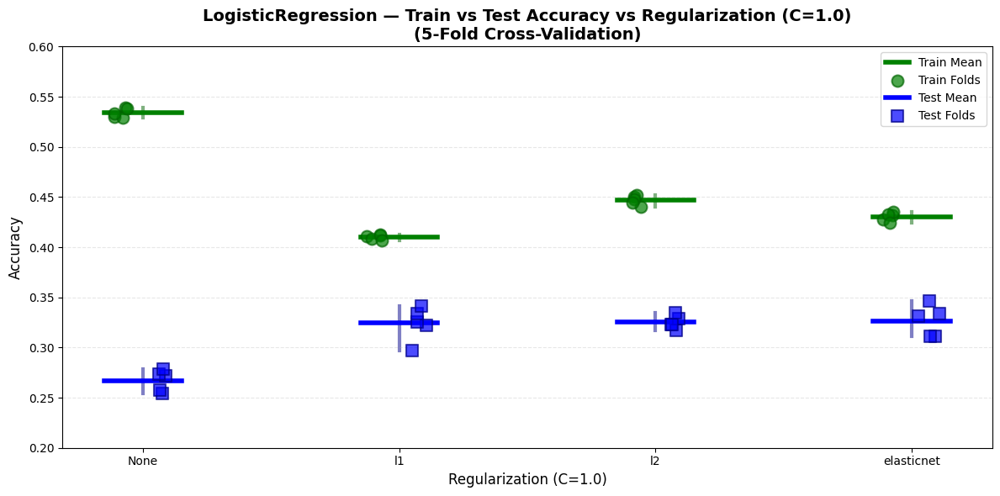

In [22]:
x_vals = [None, "l1", "l2", "elasticnet"]
printable_x_vals = ["None", "l1", "l2", "elasticnet"]
test_vals = [classifier_results[key].val.accuracy.all for key in x_vals]
train_vals = [classifier_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "LogisticRegression", "Regularization (C=1.0)", ylim=(0.2, 0.6))

In [16]:
test_vals = [classifier_results[key].val.accuracy.all for key in x_vals]
train_vals = [classifier_results[key].train.accuracy.all for key in x_vals]

test_vals

[[0.2718390804597701,
  0.2540229885057471,
  0.2735632183908046,
  0.2783208740655549,
  0.2576193214491087],
 [0.2971264367816092,
  0.32241379310344825,
  0.3258620689655172,
  0.3341000575043128,
  0.34157561817136284],
 [0.32298850574712645,
  0.31666666666666665,
  0.32873563218390806,
  0.3231742380678551,
  0.33467510063254746],
 [0.3114942528735632,
  0.3310344827586207,
  0.31091954022988505,
  0.33352501437607823,
  0.3461759631972398]]

In [23]:
# Experiment: L2 penalty with different C values
l2_c_results = {}

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

for C in [0.01, 0.1, 1.0, 10.0, 100.0]:
    print(f"\n=== Testing L2 with C={C} ===")
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "C": C,
        "penalty": "l2",
        "max_iter": 1000,
        "class_weight": "balanced",
        "random_state": SEED,
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    l2_c_results[C] = scores
    print(f"C={C} -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")


print("\n\n=== L2 PENALTY: C COMPARISON ===")
for C, result in l2_c_results.items():
    print(f"C={C:6.2f} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


=== Testing L2 with C=0.01 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4385/8700 [00:01<00:01, 2702.77it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2672.58it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [00:32<00:00,  6.56s/it]


C=0.01 -> Test Accuracy: 0.2609 ± 0.0052

=== Testing L2 with C=0.1 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4294/8700 [00:01<00:01, 2694.24it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2659.08it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [00:40<00:00,  8.11s/it]


C=0.1 -> Test Accuracy: 0.3011 ± 0.0117

=== Testing L2 with C=1.0 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4290/8700 [00:01<00:01, 2697.00it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2655.95it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:01<00:00, 12.39s/it]


C=1.0 -> Test Accuracy: 0.3326 ± 0.0076

=== Testing L2 with C=10.0 ===


Phase [Setup]: Extracting the descriptors:  52%|█████▏    | 4529/8700 [00:01<00:01, 2653.77it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2632.54it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:40<00:00, 20.09s/it]


C=10.0 -> Test Accuracy: 0.3031 ± 0.0073

=== Testing L2 with C=100.0 ===


Phase [Setup]: Extracting the descriptors:  52%|█████▏    | 4530/8700 [00:01<00:01, 2660.27it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2657.06it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [02:20<00:00, 28.16s/it]

C=100.0 -> Test Accuracy: 0.2798 ± 0.0073


=== L2 PENALTY: C COMPARISON ===
C=  0.01 -> Train: 0.2758 ± 0.0023 | Test: 0.2609 ± 0.0052
C=  0.10 -> Train: 0.3411 ± 0.0023 | Test: 0.3011 ± 0.0117
C=  1.00 -> Train: 0.4469 ± 0.0013 | Test: 0.3326 ± 0.0076
C= 10.00 -> Train: 0.5187 ± 0.0063 | Test: 0.3031 ± 0.0073
C=100.00 -> Train: 0.5357 ± 0.0066 | Test: 0.2798 ± 0.0073


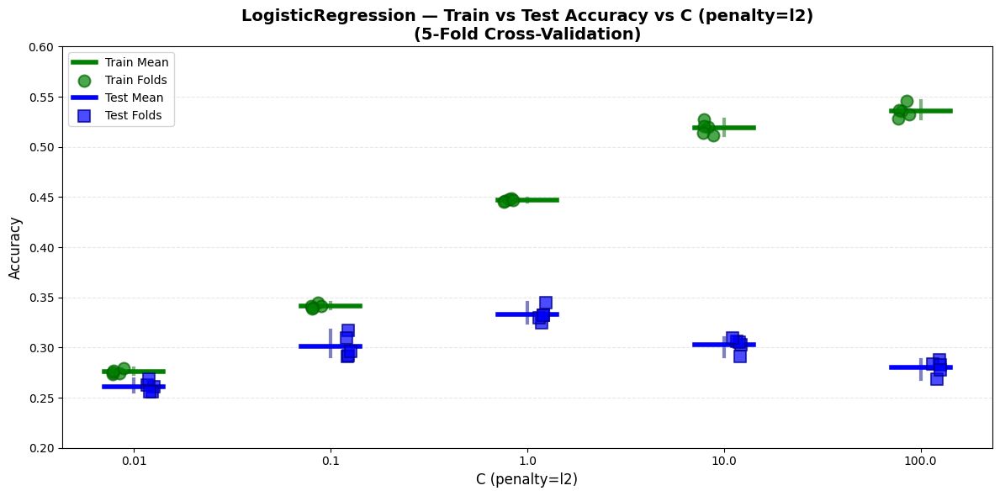

In [24]:
x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
printable_x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
test_vals = [l2_c_results[key].val.accuracy.all for key in x_vals]
train_vals = [l2_c_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "LogisticRegression", "C (penalty=l2)", ylim=(0.2, 0.6))

In [25]:
# Experiment: L1 penalty with different C values
l1_c_results = {}

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

for C in [0.01, 0.1, 1.0, 10.0, 100.0]:
    print(f"\n=== Testing L1 with C={C} ===")
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "C": C,
        "penalty": "l1",
        "solver": "saga",
        "max_iter": 1000,
        "class_weight": "balanced",
        "random_state": SEED,
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    l1_c_results[C] = scores
    print(f"C={C} -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")


print("\n\n=== L1 PENALTY: C COMPARISON ===")
for C, result in l1_c_results.items():
    print(f"C={C:6.2f} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


=== Testing L1 with C=0.01 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4329/8700 [00:01<00:01, 2686.83it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2655.23it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


  0%|          | 0/5 [00:00<?, ?it/s]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 20%|██        | 1/5 [00:07<00:28,  7.04s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division

C=0.01 -> Test Accuracy: 0.0919 ± 0.0002

=== Testing L1 with C=0.1 ===


Phase [Setup]: Extracting the descriptors:  52%|█████▏    | 4522/8700 [00:01<00:01, 2619.14it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2642.42it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


 40%|████      | 2/5 [00:17<00:26,  8.67s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 80%|████████  | 4/5 [00:34<00:08,  8.64s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_

C=0.1 -> Test Accuracy: 0.2103 ± 0.0087

=== Testing L1 with C=1.0 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4279/8700 [00:01<00:01, 2688.05it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2663.83it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:19<00:00, 15.92s/it]


C=1.0 -> Test Accuracy: 0.3133 ± 0.0113

=== Testing L1 with C=10.0 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4306/8700 [00:01<00:01, 2708.29it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2663.88it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [07:24<00:00, 88.82s/it] 


C=10.0 -> Test Accuracy: 0.2883 ± 0.0136

=== Testing L1 with C=100.0 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4295/8700 [00:01<00:01, 2700.49it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2655.54it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


 20%|██        | 1/5 [01:49<07:16, 109.00s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 40%|████      | 2/5 [04:42<07:21, 147.20s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
100%|██████████| 5/5 [11:54<00:00, 142.98s/it]

C=100.0 -> Test Accuracy: 0.2674 ± 0.0095


=== L1 PENALTY: C COMPARISON ===
C=  0.01 -> Train: 0.0920 ± 0.0000 | Test: 0.0919 ± 0.0002
C=  0.10 -> Train: 0.2171 ± 0.0021 | Test: 0.2103 ± 0.0087
C=  1.00 -> Train: 0.4127 ± 0.0048 | Test: 0.3133 ± 0.0113
C= 10.00 -> Train: 0.5327 ± 0.0058 | Test: 0.2883 ± 0.0136
C=100.00 -> Train: 0.5341 ± 0.0017 | Test: 0.2674 ± 0.0095


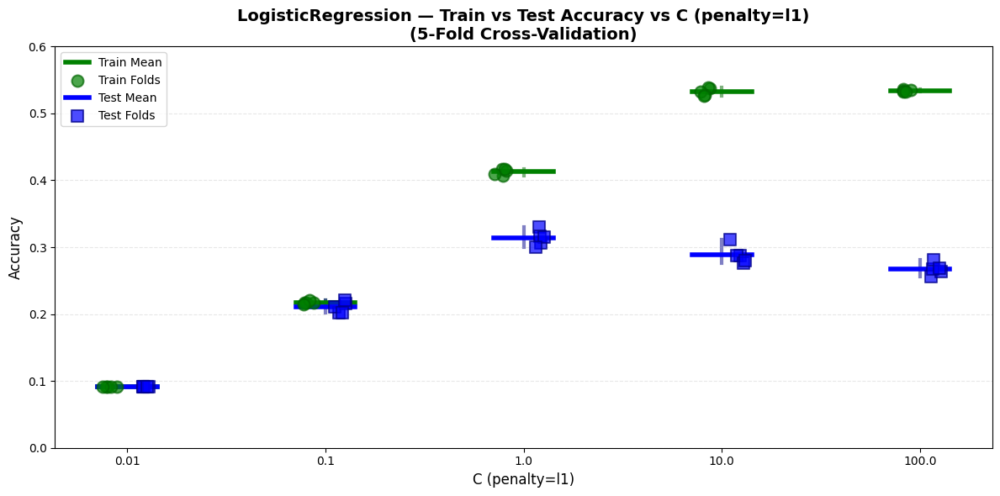

In [28]:
x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
printable_x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
test_vals = [l1_c_results[key].val.accuracy.all for key in x_vals]
train_vals = [l1_c_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "LogisticRegression", "C (penalty=l1)", ylim=(0.0, 0.6))

In [29]:
# Experiment: ElasticNet penalty with different C values
elasticnet_c_results = {}

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

for C in [0.01, 0.1, 1.0, 10.0, 100.0]:
    print(f"\n=== Testing ElasticNet with C={C} ===")
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "C": C,
        "penalty": "elasticnet",
        "solver": "saga",
        "l1_ratio": 0.5,  # Equal mix of L1 and L2
        "max_iter": 1000,
        "class_weight": "balanced",
        "random_state": SEED,
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    elasticnet_c_results[C] = scores
    print(f"C={C} -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")


print("\n\n=== ELASTICNET PENALTY: C COMPARISON ===")
for C, result in elasticnet_c_results.items():
    print(f"C={C:6.2f} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


=== Testing ElasticNet with C=0.01 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4338/8700 [00:01<00:01, 2692.96it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2676.05it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


  0%|          | 0/5 [00:00<?, ?it/s]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 20%|██        | 1/5 [00:07<00:28,  7.07s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division

C=0.01 -> Test Accuracy: 0.0896 ± 0.0051

=== Testing ElasticNet with C=0.1 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4280/8700 [00:01<00:01, 2691.34it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2663.64it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [00:45<00:00,  9.00s/it]


C=0.1 -> Test Accuracy: 0.2379 ± 0.0108

=== Testing ElasticNet with C=1.0 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4307/8700 [00:01<00:01, 2692.49it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2662.16it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [00:55<00:00, 11.11s/it]


C=1.0 -> Test Accuracy: 0.3258 ± 0.0057

=== Testing ElasticNet with C=10.0 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4270/8700 [00:01<00:01, 2659.05it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2649.83it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:39<00:00, 19.86s/it]


C=10.0 -> Test Accuracy: 0.2927 ± 0.0068

=== Testing ElasticNet with C=100.0 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4281/8700 [00:01<00:01, 2686.85it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2657.76it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [06:08<00:00, 73.74s/it]

C=100.0 -> Test Accuracy: 0.2801 ± 0.0100


=== ELASTICNET PENALTY: C COMPARISON ===
C=  0.01 -> Train: 0.0897 ± 0.0051 | Test: 0.0896 ± 0.0051
C=  0.10 -> Train: 0.2518 ± 0.0054 | Test: 0.2379 ± 0.0108
C=  1.00 -> Train: 0.4338 ± 0.0059 | Test: 0.3258 ± 0.0057
C= 10.00 -> Train: 0.5259 ± 0.0065 | Test: 0.2927 ± 0.0068
C=100.00 -> Train: 0.5348 ± 0.0044 | Test: 0.2801 ± 0.0100


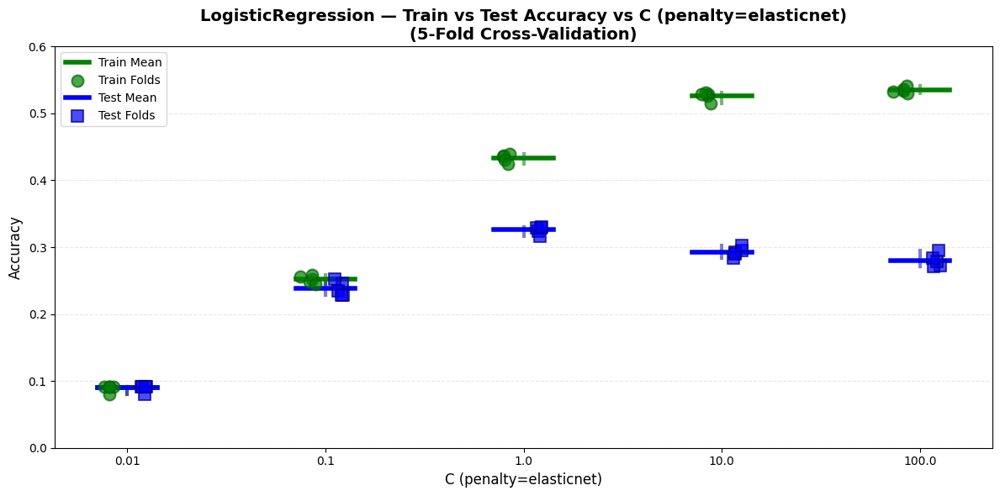

In [30]:
x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
printable_x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
test_vals = [elasticnet_c_results[key].val.accuracy.all for key in x_vals]
train_vals = [elasticnet_c_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "LogisticRegression", "C (penalty=elasticnet)", ylim=(0.0, 0.6))

### SVM Experiments

In [ ]:
# Experiment 1: Linear kernel with different C values
kernel_results = {}

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

print("=" * 60)
print("EXPERIMENT 1: LINEAR KERNEL + C VALUES")
print("=" * 60)

for kernel in ['linear', 'poly', 'rbf', 'sigmoid']:
    print(f"\n=== Testing Linear SVM with kernel={kernel} ===")
    
    classifier_cls = SVC
    classifier_params = {
        "kernel": kernel,
        "class_weight": "balanced",
        "random_state": SEED,
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    kernel_results[kernel] = scores
    print(f"kernel={kernel} -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")


print("\n" + "=" * 60)
print("LINEAR KERNEL: kernel COMPARISON")
print("=" * 60)
for C, result in kernel_results.items():
    print(f"kernel={kernel} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

EXPERIMENT 1: LINEAR KERNEL + C VALUES

=== Testing Linear SVM with kernel=linear ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4272/8700 [00:01<00:01, 2340.35it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2323.53it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:26<00:00, 17.24s/it]


kernel=linear -> Test Accuracy: 0.3262 ± 0.0083

=== Testing Linear SVM with kernel=poly ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4372/8700 [00:01<00:01, 2628.70it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2646.57it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:38<00:00, 19.64s/it]


kernel=poly -> Test Accuracy: 0.3294 ± 0.0138

=== Testing Linear SVM with kernel=rbf ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4336/8700 [00:01<00:01, 2535.42it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2645.32it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:58<00:00, 23.78s/it]


kernel=rbf -> Test Accuracy: 0.3455 ± 0.0076

=== Testing Linear SVM with kernel=sigmoid ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4389/8700 [00:01<00:01, 2723.55it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2677.84it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:32<00:00, 18.48s/it]

kernel=sigmoid -> Test Accuracy: 0.2767 ± 0.0058

LINEAR KERNEL: kernel COMPARISON


ValueError: Unknown format code 'f' for object of type 'str'

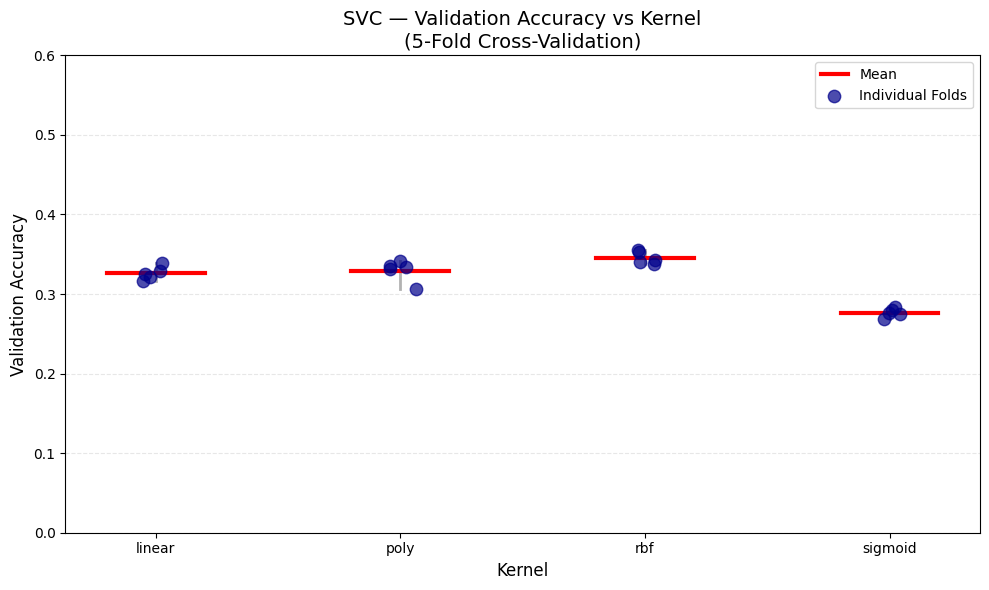

In [8]:
x_vals = ['linear', 'poly', 'rbf', 'sigmoid']
printable_x_vals = ['linear', 'poly', 'rbf', 'sigmoid']
test_vals = [kernel_results[key].val.accuracy.all for key in x_vals]
# train_vals = [kernel_results[key].train.accuracy.all for key in x_vals]
plot_cv_accuracy_boxplot(printable_x_vals, test_vals, "SVC", "Kernel", ylim=(0.0, 0.6))

In [6]:
# Experiment 1: Linear kernel with different C values
linear_c_results = {}

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

print("=" * 60)
print("EXPERIMENT 1: LINEAR KERNEL + C VALUES")
print("=" * 60)

for C in [0.01, 0.1, 1.0, 10.0, 100.0]:
    print(f"\n=== Testing Linear SVM with C={C} ===")
    
    classifier_cls = SVC
    classifier_params = {
        "kernel": "linear",
        "C": C,
        "class_weight": "balanced",
        "random_state": SEED,
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    linear_c_results[C] = scores
    print(f"C={C} -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")


print("\n" + "=" * 60)
print("LINEAR KERNEL: C COMPARISON")
print("=" * 60)
for C, result in linear_c_results.items():
    print(f"C={C:6.2f} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

EXPERIMENT 1: LINEAR KERNEL + C VALUES

=== Testing Linear SVM with C=0.01 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4269/8700 [00:01<00:01, 2331.86it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2331.53it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


  0%|          | 0/5 [00:00<?, ?it/s]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 20%|██        | 1/5 [00:18<01:14, 18.67s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division

C=0.01 -> Test Accuracy: 0.1743 ± 0.0766

=== Testing Linear SVM with C=0.1 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4358/8700 [00:01<00:01, 2699.98it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2659.57it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:30<00:00, 18.02s/it]


C=0.1 -> Test Accuracy: 0.3047 ± 0.0131

=== Testing Linear SVM with C=1.0 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4350/8700 [00:01<00:01, 2710.69it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2682.64it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:20<00:00, 16.09s/it]


C=1.0 -> Test Accuracy: 0.3343 ± 0.0039

=== Testing Linear SVM with C=10.0 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4386/8700 [00:01<00:01, 2719.26it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2673.89it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:19<00:00, 15.87s/it]


C=10.0 -> Test Accuracy: 0.2858 ± 0.0062

=== Testing Linear SVM with C=100.0 ===


Phase [Setup]: Extracting the descriptors:  51%|█████     | 4406/8700 [00:01<00:01, 2749.11it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2702.58it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:39<00:00, 19.84s/it]

C=100.0 -> Test Accuracy: 0.2628 ± 0.0171

LINEAR KERNEL: C COMPARISON
C=  0.01 -> Train: 0.1784 ± 0.0825 | Test: 0.1743 ± 0.0766
C=  0.10 -> Train: 0.3380 ± 0.0028 | Test: 0.3047 ± 0.0131
C=  1.00 -> Train: 0.4765 ± 0.0047 | Test: 0.3343 ± 0.0039
C= 10.00 -> Train: 0.6348 ± 0.0082 | Test: 0.2858 ± 0.0062
C=100.00 -> Train: 0.8069 ± 0.0065 | Test: 0.2628 ± 0.0171


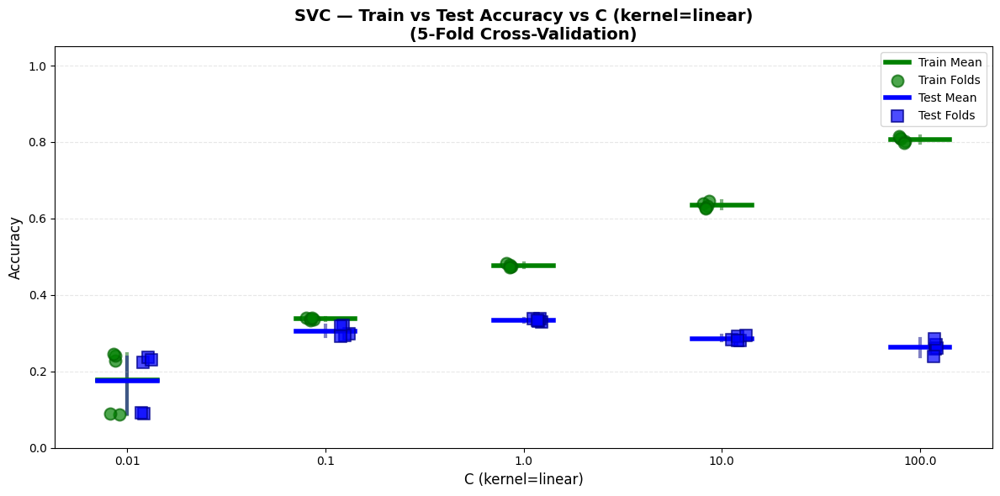

In [9]:
x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
printable_x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
test_vals = [linear_c_results[key].val.accuracy.all for key in x_vals]
train_vals = [linear_c_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "SVC", "C (kernel=linear)", ylim=(0.0, 1.05))

In [13]:
# Experiment 2: RBF kernel with different C values
rbf_c_results = {}

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

print("=" * 60)
print("EXPERIMENT 2: RBF KERNEL + C VALUES")
print("=" * 60)

for C in [0.01, 0.1, 1.0, 10.0, 100.0]:
    print(f"\n=== Testing RBF SVM with C={C} ===")
    
    classifier_cls = SVC
    classifier_params = {
        "kernel": "rbf",
        "C": C,
        "gamma": "scale",
        "class_weight": "balanced",
        "random_state": SEED,
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    rbf_c_results[C] = scores
    print(f"C={C} -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")


print("\n" + "=" * 60)
print("RBF KERNEL: C COMPARISON")
print("=" * 60)
for C, result in rbf_c_results.items():
    print(f"C={C:6.2f} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

EXPERIMENT 2: RBF KERNEL + C VALUES

=== Testing RBF SVM with C=0.01 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4386/8700 [00:01<00:01, 2488.41it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2532.33it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


  0%|          | 0/5 [00:00<?, ?it/s]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 20%|██        | 1/5 [00:24<01:39, 25.00s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division

C=0.01 -> Test Accuracy: 0.1670 ± 0.0793

=== Testing RBF SVM with C=0.1 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4320/8700 [00:01<00:01, 2576.49it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2645.89it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [02:02<00:00, 24.48s/it]


C=0.1 -> Test Accuracy: 0.2952 ± 0.0090

=== Testing RBF SVM with C=1.0 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4339/8700 [00:01<00:01, 2684.50it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2665.20it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:54<00:00, 22.98s/it]


C=1.0 -> Test Accuracy: 0.3426 ± 0.0115

=== Testing RBF SVM with C=10.0 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4361/8700 [00:01<00:01, 2679.74it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2679.55it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [02:06<00:00, 25.31s/it]


C=10.0 -> Test Accuracy: 0.3247 ± 0.0084

=== Testing RBF SVM with C=100.0 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4368/8700 [00:01<00:01, 2710.56it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2684.62it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [02:03<00:00, 24.72s/it]

C=100.0 -> Test Accuracy: 0.3251 ± 0.0053

RBF KERNEL: C COMPARISON
C=  0.01 -> Train: 0.1903 ± 0.1003 | Test: 0.1670 ± 0.0793
C=  0.10 -> Train: 0.3598 ± 0.0042 | Test: 0.2952 ± 0.0090
C=  1.00 -> Train: 0.7739 ± 0.0085 | Test: 0.3426 ± 0.0115
C= 10.00 -> Train: 0.9999 ± 0.0001 | Test: 0.3247 ± 0.0084
C=100.00 -> Train: 1.0000 ± 0.0000 | Test: 0.3251 ± 0.0053


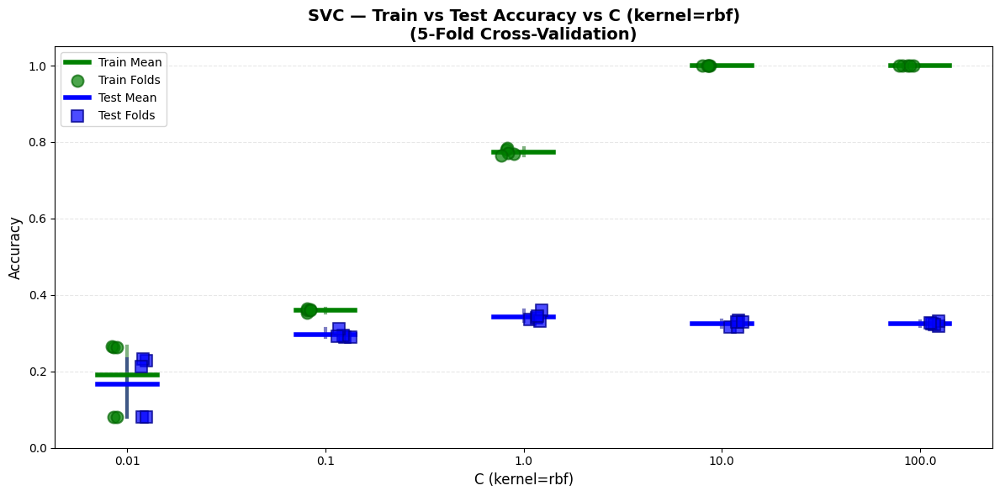

In [16]:
x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
printable_x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
test_vals = [rbf_c_results[key].val.accuracy.all for key in x_vals]
train_vals = [rbf_c_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "SVC", "C (kernel=rbf)", ylim=(0.0, 1.05))

In [17]:
# Experiment 3: Polynomial kernel with different C values
poly_c_results = {}

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

print("=" * 60)
print("EXPERIMENT 3: POLYNOMIAL KERNEL + C VALUES")
print("=" * 60)

for C in [0.01, 0.1, 1.0, 10.0, 100.0]:
    print(f"\n=== Testing Poly SVM with C={C} ===")
    
    classifier_cls = SVC
    classifier_params = {
        "kernel": "poly",
        "degree": 3,  # cubic polynomial
        "C": C,
        "gamma": "scale",
        "class_weight": "balanced",
        "random_state": SEED,
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    poly_c_results[C] = scores
    print(f"C={C} -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")


print("\n" + "=" * 60)
print("POLYNOMIAL KERNEL: C COMPARISON")
print("=" * 60)
for C, result in poly_c_results.items():
    print(f"C={C:6.2f} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

EXPERIMENT 3: POLYNOMIAL KERNEL + C VALUES

=== Testing Poly SVM with C=0.01 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4353/8700 [00:01<00:01, 2702.16it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2675.42it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


  0%|          | 0/5 [00:00<?, ?it/s]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 20%|██        | 1/5 [00:19<01:18, 19.58s/it]/home/arnau-marcos-almansa/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division

C=0.01 -> Test Accuracy: 0.2371 ± 0.0322

=== Testing Poly SVM with C=0.1 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4362/8700 [00:01<00:01, 2700.15it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2682.72it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:31<00:00, 18.20s/it]


C=0.1 -> Test Accuracy: 0.3248 ± 0.0075

=== Testing Poly SVM with C=1.0 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4353/8700 [00:01<00:01, 2698.21it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2674.70it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:36<00:00, 19.40s/it]


C=1.0 -> Test Accuracy: 0.3316 ± 0.0122

=== Testing Poly SVM with C=10.0 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4306/8700 [00:01<00:01, 2608.97it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2654.52it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:35<00:00, 19.18s/it]


C=10.0 -> Test Accuracy: 0.3220 ± 0.0081

=== Testing Poly SVM with C=100.0 ===


Phase [Setup]: Extracting the descriptors:  51%|█████     | 4403/8700 [00:01<00:01, 2716.69it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2682.23it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:37<00:00, 19.46s/it]

C=100.0 -> Test Accuracy: 0.3239 ± 0.0105

POLYNOMIAL KERNEL: C COMPARISON
C=  0.01 -> Train: 0.2712 ± 0.0490 | Test: 0.2371 ± 0.0322
C=  0.10 -> Train: 0.5064 ± 0.0065 | Test: 0.3248 ± 0.0075
C=  1.00 -> Train: 0.9979 ± 0.0007 | Test: 0.3316 ± 0.0122
C= 10.00 -> Train: 1.0000 ± 0.0000 | Test: 0.3220 ± 0.0081
C=100.00 -> Train: 1.0000 ± 0.0000 | Test: 0.3239 ± 0.0105


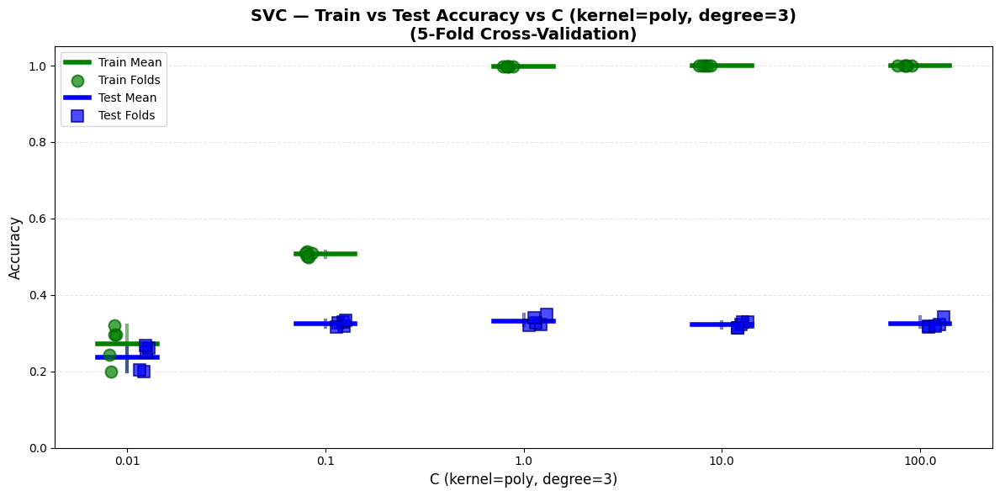

In [18]:
x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
printable_x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
test_vals = [poly_c_results[key].val.accuracy.all for key in x_vals]
train_vals = [poly_c_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "SVC", "C (kernel=poly, degree=3)", ylim=(0.0, 1.05))

In [19]:
# Summary: Compare all kernels at their best C values
print("=" * 80)
print("SUMMARY: ALL KERNELS COMPARISON")
print("=" * 80)

print("\nLINEAR KERNEL:")
for C, result in linear_c_results.items():
    print(f"  C={C:6.2f} -> Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

print("\nRBF KERNEL:")
for C, result in rbf_c_results.items():
    print(f"  C={C:6.2f} -> Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

print("\nPOLYNOMIAL KERNEL:")
for C, result in poly_c_results.items():
    print(f"  C={C:6.2f} -> Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

# Find best configuration
best_acc = 0
best_config = None

for C, result in linear_c_results.items():
    if result.val.accuracy.mean > best_acc:
        best_acc = result.val.accuracy.mean
        best_config = ("linear", C, result)

for C, result in rbf_c_results.items():
    if result.val.accuracy.mean > best_acc:
        best_acc = result.val.accuracy.mean
        best_config = ("rbf", C, result)

for C, result in poly_c_results.items():
    if result.val.accuracy.mean > best_acc:
        best_acc = result.val.accuracy.mean
        best_config = ("poly", C, result)

print("\n" + "=" * 80)
print("BEST CONFIGURATION:")
print("=" * 80)
if best_config:
    kernel, C, result = best_config
    print(f"Kernel: {kernel}")
    print(f"C: {C}")
    print(f"Test Accuracy: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")
    print(f"Train Accuracy: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f}")
    print(f"Test F1: {result.val.f1.mean:.4f} ± {result.val.f1.std:.4f}")

SUMMARY: ALL KERNELS COMPARISON

LINEAR KERNEL:
  C=  0.01 -> Test: 0.1700 ± 0.0699
  C=  0.10 -> Test: 0.3043 ± 0.0095
  C=  1.00 -> Test: 0.3300 ± 0.0062
  C= 10.00 -> Test: 0.2874 ± 0.0122
  C=100.00 -> Test: 0.2648 ± 0.0100

RBF KERNEL:
  C=  0.01 -> Test: 0.1670 ± 0.0793
  C=  0.10 -> Test: 0.2952 ± 0.0090
  C=  1.00 -> Test: 0.3426 ± 0.0115
  C= 10.00 -> Test: 0.3247 ± 0.0084
  C=100.00 -> Test: 0.3251 ± 0.0053

POLYNOMIAL KERNEL:
  C=  0.01 -> Test: 0.2371 ± 0.0322
  C=  0.10 -> Test: 0.3248 ± 0.0075
  C=  1.00 -> Test: 0.3316 ± 0.0122
  C= 10.00 -> Test: 0.3220 ± 0.0081
  C=100.00 -> Test: 0.3239 ± 0.0105

BEST CONFIGURATION:
Kernel: rbf
C: 1.0
Test Accuracy: 0.3426 ± 0.0115
Train Accuracy: 0.7739 ± 0.0085
Test F1: 0.3350 ± 0.0120


#### Histogram Intersection Kernel

The Histogram Intersection Kernel is defined as:

$$K(x, y) = \sum_{i=1}^{n} \min(x_i, y_i)$$

This kernel measures the similarity between two histograms by summing the minimum values at each bin. It's particularly effective for histogram-based features like BOVW.

**Properties:**
- Works well with normalized histograms
- Computationally efficient
- Often outperforms RBF and linear kernels for histogram data
- Values range from 0 (no overlap) to 1 (identical normalized histograms)

In [6]:
# Histogram Intersection Kernel implementation
def histogram_intersection_kernel(X, Y):
    """
    Compute the Histogram Intersection Kernel between X and Y.
    
    K(x, y) = sum_i min(x_i, y_i)
    
    Parameters:
    -----------
    X : array-like, shape (n_samples_X, n_features)
        First set of samples
    Y : array-like, shape (n_samples_Y, n_features)
        Second set of samples
        
    Returns:
    --------
    K : array, shape (n_samples_X, n_samples_Y)
        Kernel matrix
    """
    X = np.atleast_2d(X)
    Y = np.atleast_2d(Y)
    
    # compute row by row to avoid creating a huge 3D array (n_X, n_Y, n_features) and crashing
    n_samples_X = X.shape[0]
    n_samples_Y = Y.shape[0]
    K = np.zeros((n_samples_X, n_samples_Y))
    
    for i in range(n_samples_X):
        K[i] = np.sum(np.minimum(X[i], Y), axis=1)
    
    return K

# Test
print("Testing Histogram Intersection Kernel:")
x = np.array([[0.2, 0.3, 0.5]])
y = np.array([[0.1, 0.4, 0.5]])
K = histogram_intersection_kernel(x, y)
print(f"K(x, y) = {K[0, 0]:.4f}")
print(f"Expected: min(0.2,0.1) + min(0.3,0.4) + min(0.5,0.5) = 0.1 + 0.3 + 0.5 = 0.9")

Testing Histogram Intersection Kernel:
K(x, y) = 0.9000
Expected: min(0.2,0.1) + min(0.3,0.4) + min(0.5,0.5) = 0.1 + 0.3 + 0.5 = 0.9


In [7]:
# Experiment: Histogram Intersection Kernel with different C values
hik_c_results = {}

bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
}

print("=" * 60)
print("HISTOGRAM INTERSECTION KERNEL + C VALUES")
print("=" * 60)

for C in [0.01, 0.1, 1.0, 10.0, 100.0]:
    print(f"\n=== Testing HIK with C={C} ===")
    
    classifier_cls = SVC
    classifier_params = {
        "kernel": histogram_intersection_kernel,
        "C": C,
        "class_weight": "balanced",
        "random_state": SEED,
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    hik_c_results[C] = scores
    print(f"C={C} -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")


print("\n" + "=" * 60)
print("HISTOGRAM INTERSECTION KERNEL: C COMPARISON")
print("=" * 60)
for C, result in hik_c_results.items():
    print(f"C={C:6.2f} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

HISTOGRAM INTERSECTION KERNEL + C VALUES

=== Testing HIK with C=0.01 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4267/8700 [00:01<00:01, 2333.63it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2323.75it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [05:19<00:00, 63.88s/it]


C=0.01 -> Test Accuracy: 0.3104 ± 0.0117

=== Testing HIK with C=0.1 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4384/8700 [00:01<00:01, 2678.49it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2655.82it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [05:12<00:00, 62.57s/it]


C=0.1 -> Test Accuracy: 0.3311 ± 0.0100

=== Testing HIK with C=1.0 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4366/8700 [00:01<00:01, 2726.77it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2675.03it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [05:22<00:00, 64.43s/it]


C=1.0 -> Test Accuracy: 0.2797 ± 0.0113

=== Testing HIK with C=10.0 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4362/8700 [00:01<00:01, 2723.58it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2653.96it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [05:17<00:00, 63.52s/it]


C=10.0 -> Test Accuracy: 0.2735 ± 0.0071

=== Testing HIK with C=100.0 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4379/8700 [00:01<00:01, 2714.05it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2680.14it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [05:17<00:00, 63.52s/it]

C=100.0 -> Test Accuracy: 0.2804 ± 0.0115

HISTOGRAM INTERSECTION KERNEL: C COMPARISON
C=  0.01 -> Train: 0.3610 ± 0.0032 | Test: 0.3104 ± 0.0117
C=  0.10 -> Train: 0.6549 ± 0.0043 | Test: 0.3311 ± 0.0100
C=  1.00 -> Train: 0.9961 ± 0.0008 | Test: 0.2797 ± 0.0113
C= 10.00 -> Train: 1.0000 ± 0.0000 | Test: 0.2735 ± 0.0071
C=100.00 -> Train: 1.0000 ± 0.0000 | Test: 0.2804 ± 0.0115


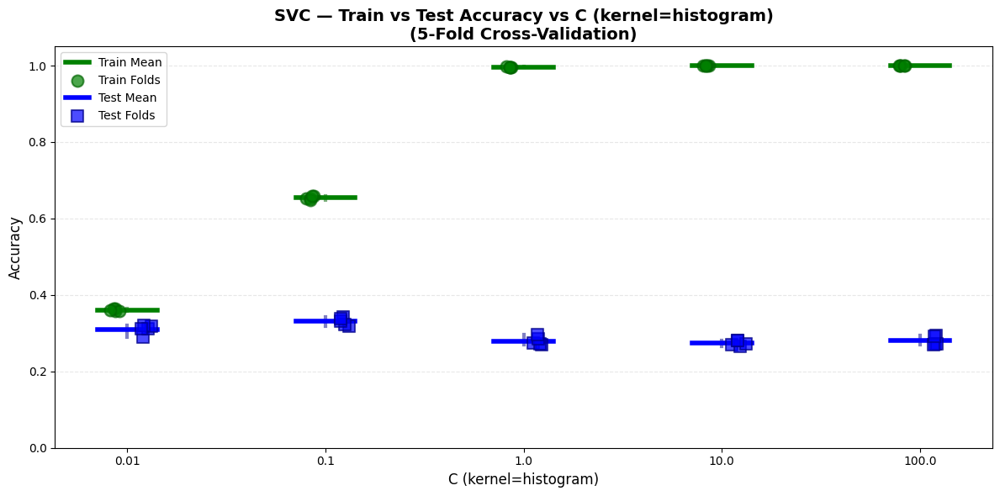

In [10]:
x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
printable_x_vals = [0.01, 0.1, 1.0, 10.0, 100.0]
test_vals = [hik_c_results[key].val.accuracy.all for key in x_vals]
train_vals = [hik_c_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "SVC", f"C (kernel=histogram)", ylim=(0.0, 1.05))

In [12]:
# Compare HIK with standard kernels (at C=1.0)
print("=" * 60)
print("KERNEL COMPARISON (C=1.0)")
print("=" * 60)

comparison_results = {}

# Test Linear kernel
print("\n=== Testing Linear Kernel ===")
scores = cross_validate_bovw(
    dataset=data_train,
    bovw_kwargs=bovw_params,
    classifier_cls=SVC,
    classifier_kwargs={
        "kernel": "linear",
        "C": 1.0,
        "class_weight": "balanced",
        "random_state": SEED,
    },
    n_splits=5
)
comparison_results["linear"] = scores
print(f"Linear -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

# Test RBF kernel
print("\n=== Testing RBF Kernel ===")
scores = cross_validate_bovw(
    dataset=data_train,
    bovw_kwargs=bovw_params,
    classifier_cls=SVC,
    classifier_kwargs={
        "kernel": "rbf",
        "C": 1.0,
        "gamma": "scale",
        "class_weight": "balanced",
        "random_state": SEED,
    },
    n_splits=5
)
comparison_results["rbf"] = scores
print(f"RBF -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

# Test HIK kernel
print("\n=== Testing Histogram Intersection Kernel ===")
scores = cross_validate_bovw(
    dataset=data_train,
    bovw_kwargs=bovw_params,
    classifier_cls=SVC,
    classifier_kwargs={
        "kernel": histogram_intersection_kernel,
        "C": 0.1,
        "class_weight": "balanced",
        "random_state": SEED,
    },
    n_splits=5
)
comparison_results["hik"] = scores
print(f"HIK -> Test Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

# Summary
print("\n" + "=" * 60)
print("SUMMARY: KERNEL COMPARISON AT C=1.0")
print("=" * 60)
for kernel_name, result in comparison_results.items():
    print(f"{kernel_name:10s} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Test: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

KERNEL COMPARISON (C=1.0)

=== Testing Linear Kernel ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4304/8700 [00:01<00:01, 2355.65it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2333.66it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:23<00:00, 16.64s/it]


Linear -> Test Accuracy: 0.3270 ± 0.0107

=== Testing RBF Kernel ===


Phase [Setup]: Extracting the descriptors:  51%|█████     | 4400/8700 [00:01<00:01, 2642.37it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2678.44it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:54<00:00, 22.98s/it]


RBF -> Test Accuracy: 0.3359 ± 0.0045

=== Testing Histogram Intersection Kernel ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4384/8700 [00:01<00:01, 2659.48it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2661.33it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [05:27<00:00, 65.57s/it]

HIK -> Test Accuracy: 0.3334 ± 0.0055

SUMMARY: KERNEL COMPARISON AT C=1.0
linear     -> Train: 0.4769 ± 0.0021 | Test: 0.3270 ± 0.0107
rbf        -> Train: 0.7753 ± 0.0088 | Test: 0.3359 ± 0.0045
hik        -> Train: 0.6559 ± 0.0059 | Test: 0.3334 ± 0.0055


## G) Dimensionality Reduction Experiments

This notebook explores different dimensionality reduction techniques applied to SIFT descriptors before building the visual vocabulary.


### Methods:

#### 1. PCA (Principal Component Analysis)
- **Key Parameter**: `n_components` - number of components to keep
- **Additional**: `whiten` - whether to whiten the components (normalize variance)
- **Use case**: Unsupervised, finds directions of maximum variance

#### 2. TruncatedSVD (Singular Value Decomposition)
- **Key Parameter**: `n_components` - number of components to keep
- **Additional**: `n_iter` - number of iterations for randomized solver
- **Use case**: Works with sparse data, similar to PCA but doesn't center data

#### 3. LDA (Linear Discriminant Analysis)
- **Key Parameter**: `n_components` - number of components (max: n_classes - 1)
- **Additional**: `solver` - {'svd', 'lsqr', 'eigen'}
- **Use case**: Supervised, maximizes class separability
- **Note**: Requires labels, limited to n_classes - 1 components (10 for 11 classes)

#### 4. t-SNE (t-Distributed Stochastic Neighbor Embedding)
- **Key Parameters**: 
  - `n_components` - typically 2 or 3 for visualization
  - `perplexity` - balance between local and global structure (5-50)
  - `learning_rate` - gradient descent step size (10-1000)
- **Use case**: Visualization, preserves local structure
- **Warning**: Very slow, not recommended for high-dimensional embedding in classification pipelines

### Baseline: No Dimensionality Reduction

In [6]:
# Baseline without dimensionality reduction
print("=" * 60)
print("BASELINE: NO DIMENSIONALITY REDUCTION")
print("=" * 60)

baseline_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "detector_kwargs": {"nfeatures": 1000},
    "dimensionality_reduction": None,
}

classifier_params = {
    "kernel": "linear",
    "C": 1.0,
    "class_weight": "balanced",
    "random_state": SEED,
}

baseline_scores = cross_validate_bovw(
    dataset=data_train,
    bovw_kwargs=baseline_params,
    classifier_cls=SVC,
    classifier_kwargs=classifier_params,
    n_splits=5
)

print(f"Baseline -> Train: {baseline_scores.train.accuracy.mean:.4f} ± {baseline_scores.train.accuracy.std:.4f}")
print(f"Baseline -> val:  {baseline_scores.val.accuracy.mean:.4f} ± {baseline_scores.val.accuracy.std:.4f}")

BASELINE: NO DIMENSIONALITY REDUCTION


Phase [Setup]: Extracting the descriptors:  48%|████▊     | 4167/8700 [00:03<00:04, 1080.91it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|█████████▉| 8672/8700 [00:08<00:00, 1012.91it/s]

Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:20<00:00, 16.13s/it]

Baseline -> Train: 0.4752 ± 0.0056
Baseline -> val:  0.3262 ± 0.0083


### Experiment 1: PCA - n_components

In [7]:
# PCA: val different numbers of components
pca_results = {}

print("\n" + "=" * 60)
print("PCA: n_components")
print("=" * 60)

# SIFT descriptors are 128-dimensional
for n_comp in [8, 16, 32, 64, 96, 128]:
    print(f"\n=== valing PCA with n_components={n_comp} ===")
    
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": 1000},
        "dimensionality_reduction": "PCA",
        "dimensionality_reduction_kwargs": {
            "n_components": n_comp,
            "random_state": SEED,
        },
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=SVC,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    pca_results[n_comp] = scores
    print(f"n_components={n_comp} -> val Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

print("\n" + "=" * 60)
print("PCA SUMMARY")
print("=" * 60)
for n_comp, result in pca_results.items():
    print(f"n_components={n_comp:3d} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | val {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


PCA: n_components

=== valing PCA with n_components=8 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4344/8700 [00:01<00:01, 2634.92it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2635.52it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:12<00:00, 14.56s/it]


n_components=8 -> val Accuracy: 0.3098 ± 0.0104

=== valing PCA with n_components=16 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4351/8700 [00:01<00:01, 2691.63it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2652.86it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:10<00:00, 14.17s/it]


n_components=16 -> val Accuracy: 0.3189 ± 0.0037

=== valing PCA with n_components=32 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4366/8700 [00:01<00:01, 2696.83it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2667.80it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:15<00:00, 15.12s/it]


n_components=32 -> val Accuracy: 0.3257 ± 0.0059

=== valing PCA with n_components=64 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4381/8700 [00:01<00:01, 2729.08it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2688.55it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:23<00:00, 16.66s/it]


n_components=64 -> val Accuracy: 0.3258 ± 0.0121

=== valing PCA with n_components=96 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4376/8700 [00:01<00:01, 2710.69it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2682.73it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:27<00:00, 17.49s/it]


n_components=96 -> val Accuracy: 0.3249 ± 0.0093

=== valing PCA with n_components=128 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4348/8700 [00:01<00:01, 2693.45it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2667.81it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:31<00:00, 18.25s/it]

n_components=128 -> val Accuracy: 0.3231 ± 0.0065

PCA SUMMARY
n_components=  8 -> Train: 0.4792 ± 0.0035 | val 0.3098 ± 0.0104
n_components= 16 -> Train: 0.4851 ± 0.0040 | val 0.3189 ± 0.0037
n_components= 32 -> Train: 0.4828 ± 0.0039 | val 0.3257 ± 0.0059
n_components= 64 -> Train: 0.4797 ± 0.0011 | val 0.3258 ± 0.0121
n_components= 96 -> Train: 0.4752 ± 0.0056 | val 0.3249 ± 0.0093
n_components=128 -> Train: 0.4762 ± 0.0026 | val 0.3231 ± 0.0065


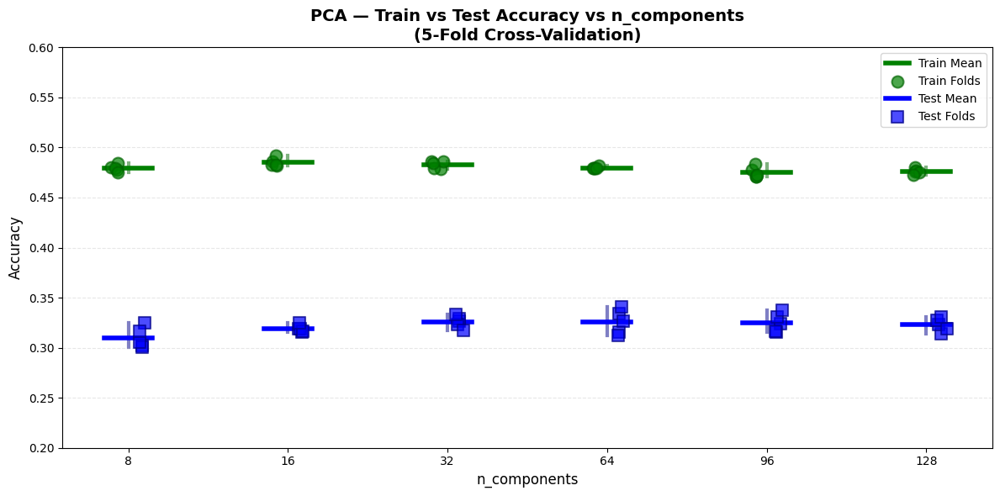

In [8]:
x_vals = [8, 16, 32, 64, 96, 128]
printable_x_vals = [8, 16, 32, 64, 96, 128]
test_vals = [pca_results[key].val.accuracy.all for key in x_vals]
train_vals = [pca_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "PCA", f"n_components", ylim=(0.2, 0.6))

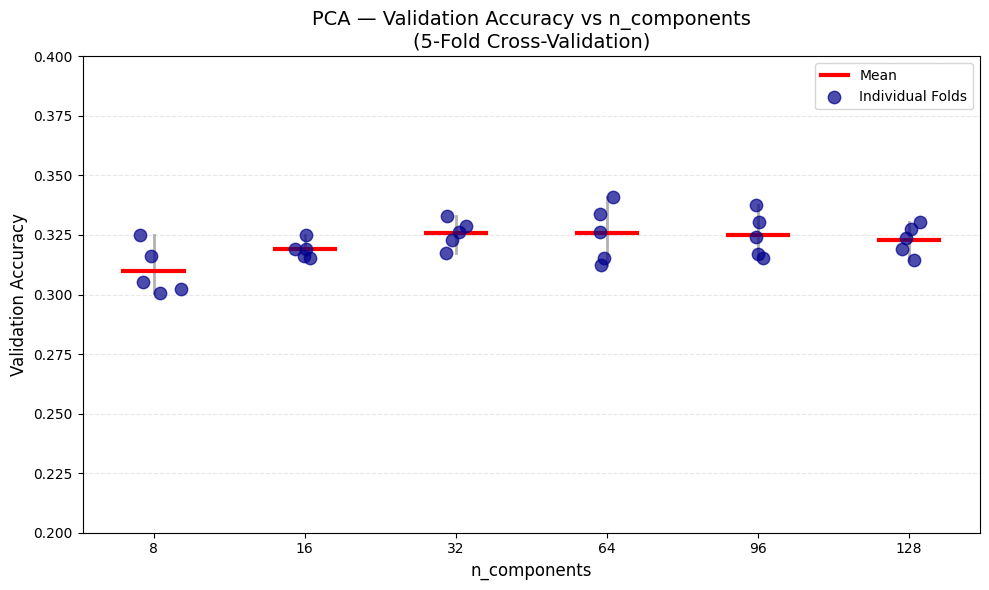

In [9]:
x_vals = [8, 16, 32, 64, 96, 128]
printable_x_vals = [8, 16, 32, 64, 96, 128]
test_vals = [pca_results[key].val.accuracy.all for key in x_vals]
# train_vals = [pca_results[key].train.accuracy.all for key in x_vals]
plot_cv_accuracy_boxplot(printable_x_vals, test_vals, "PCA", f"n_components", ylim=(0.2, 0.4))

### Experiment 2: PCA with Whitening

In [10]:
# PCA: val whitening effect
pca_whitening_results = {}

print("\n" + "=" * 60)
print("PCA: Whitening Effect (n_components=64)")
print("=" * 60)

for whiten in [False, True]:
    print(f"\n=== Testing PCA with whiten={whiten} ===")
    
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": 1000},
        "dimensionality_reduction": "PCA",
        "dimensionality_reduction_kwargs": {
            "n_components": 64,
            "whiten": whiten,
            "random_state": SEED,
        },
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=SVC,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    pca_whitening_results[whiten] = scores
    print(f"whiten={whiten} -> Val Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

print("\n" + "=" * 60)
print("PCA WHITENING SUMMARY")
print("=" * 60)
for whiten, result in pca_whitening_results.items():
    print(f"whiten={whiten:5} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Val: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


PCA: Whitening Effect (n_components=64)

=== Testing PCA with whiten=False ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4351/8700 [00:01<00:01, 2709.61it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2674.13it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:25<00:00, 17.08s/it]


whiten=False -> Val Accuracy: 0.3254 ± 0.0062

=== Testing PCA with whiten=True ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4383/8700 [00:01<00:01, 2711.49it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2686.48it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:24<00:00, 16.87s/it]

whiten=True -> Val Accuracy: 0.3195 ± 0.0061

PCA WHITENING SUMMARY
whiten=    0 -> Train: 0.4813 ± 0.0048 | Val: 0.3254 ± 0.0062
whiten=    1 -> Train: 0.4675 ± 0.0061 | Val: 0.3195 ± 0.0061


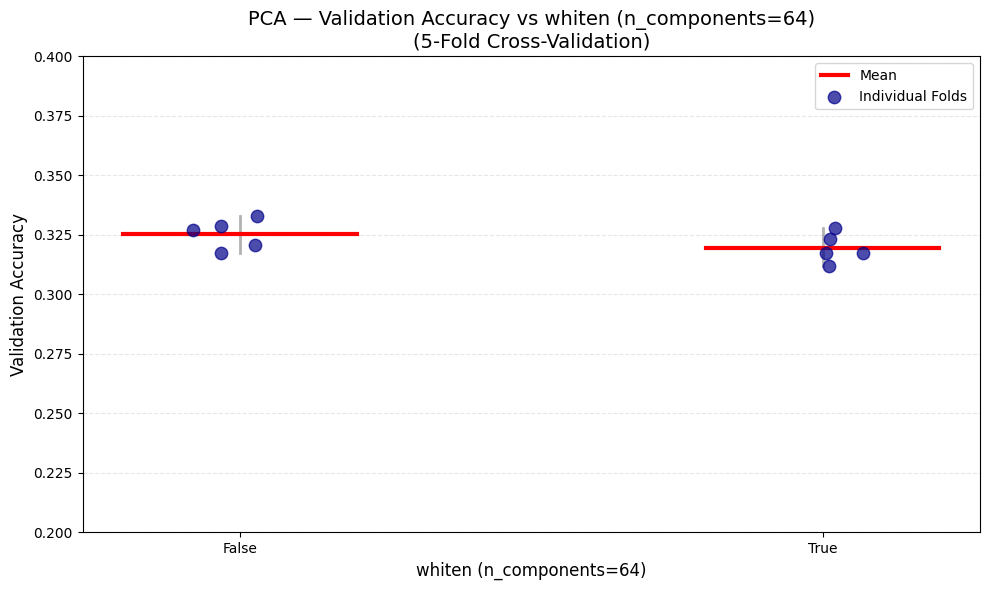

In [11]:
x_vals = [False, True]
printable_x_vals = [False, True]
test_vals = [pca_whitening_results[key].val.accuracy.all for key in x_vals]
# train_vals = [pca_whitening_results[key].train.accuracy.all for key in x_vals]
plot_cv_accuracy_boxplot(printable_x_vals, test_vals, "PCA", f"whiten (n_components=64)", ylim=(0.2, 0.4))

### Experiment 3: SVD - n_components

In [12]:
# SVD: Val different numbers of components
svd_results = {}

print("\n" + "=" * 60)
print("TRUNCATED SVD: n_components")
print("=" * 60)

for n_comp in [8, 16, 32, 64, 96, 127]:  # SVD requires n_components < n_features
    print(f"\n=== Testing SVD with n_components={n_comp} ===")
    
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": 1000},
        "dimensionality_reduction": "SVD",
        "dimensionality_reduction_kwargs": {
            "n_components": n_comp,
            "random_state": SEED,
        },
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=SVC,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    svd_results[n_comp] = scores
    print(f"n_components={n_comp} -> Val Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

print("\n" + "=" * 60)
print("SVD SUMMARY")
print("=" * 60)
for n_comp, result in svd_results.items():
    print(f"n_components={n_comp:3d} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Val: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


TRUNCATED SVD: n_components

=== Testing SVD with n_components=8 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4384/8700 [00:01<00:01, 2724.40it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2691.15it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:34<00:00, 18.87s/it]


n_components=8 -> Val Accuracy: 0.3089 ± 0.0084

=== Testing SVD with n_components=16 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4366/8700 [00:01<00:01, 2696.02it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2683.56it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:43<00:00, 20.65s/it]


n_components=16 -> Val Accuracy: 0.3192 ± 0.0074

=== Testing SVD with n_components=32 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4389/8700 [00:01<00:01, 2735.79it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2690.04it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [02:09<00:00, 25.97s/it]


n_components=32 -> Val Accuracy: 0.3300 ± 0.0083

=== Testing SVD with n_components=64 ===


Phase [Setup]: Extracting the descriptors:  51%|█████     | 4401/8700 [00:01<00:01, 2731.95it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2693.07it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [03:02<00:00, 36.40s/it]


n_components=64 -> Val Accuracy: 0.3290 ± 0.0148

=== Testing SVD with n_components=96 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4391/8700 [00:01<00:01, 2728.50it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2683.50it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [03:58<00:00, 47.69s/it]


n_components=96 -> Val Accuracy: 0.3273 ± 0.0036

=== Testing SVD with n_components=127 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4337/8700 [00:01<00:01, 2714.23it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2679.24it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [04:58<00:00, 59.78s/it]

n_components=127 -> Val Accuracy: 0.3285 ± 0.0055

SVD SUMMARY
n_components=  8 -> Train: 0.4729 ± 0.0034 | Val: 0.3089 ± 0.0084
n_components= 16 -> Train: 0.4852 ± 0.0048 | Val: 0.3192 ± 0.0074
n_components= 32 -> Train: 0.4800 ± 0.0032 | Val: 0.3300 ± 0.0083
n_components= 64 -> Train: 0.4758 ± 0.0037 | Val: 0.3290 ± 0.0148
n_components= 96 -> Train: 0.4782 ± 0.0027 | Val: 0.3273 ± 0.0036
n_components=127 -> Train: 0.4753 ± 0.0042 | Val: 0.3285 ± 0.0055


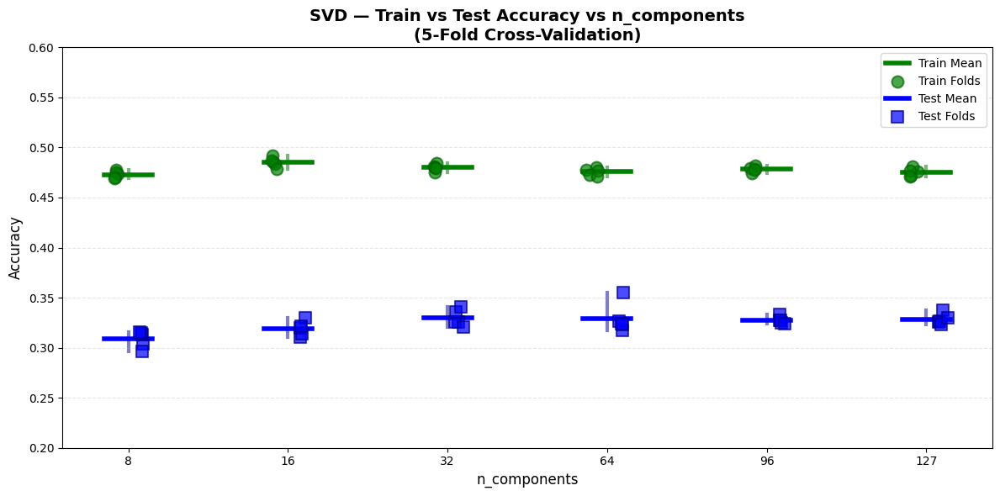

In [13]:
x_vals = [8, 16, 32, 64, 96, 127]
printable_x_vals = [8, 16, 32, 64, 96, 127]
test_vals = [svd_results[key].val.accuracy.all for key in x_vals]
train_vals = [svd_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "SVD", f"n_components", ylim=(0.2, 0.6))

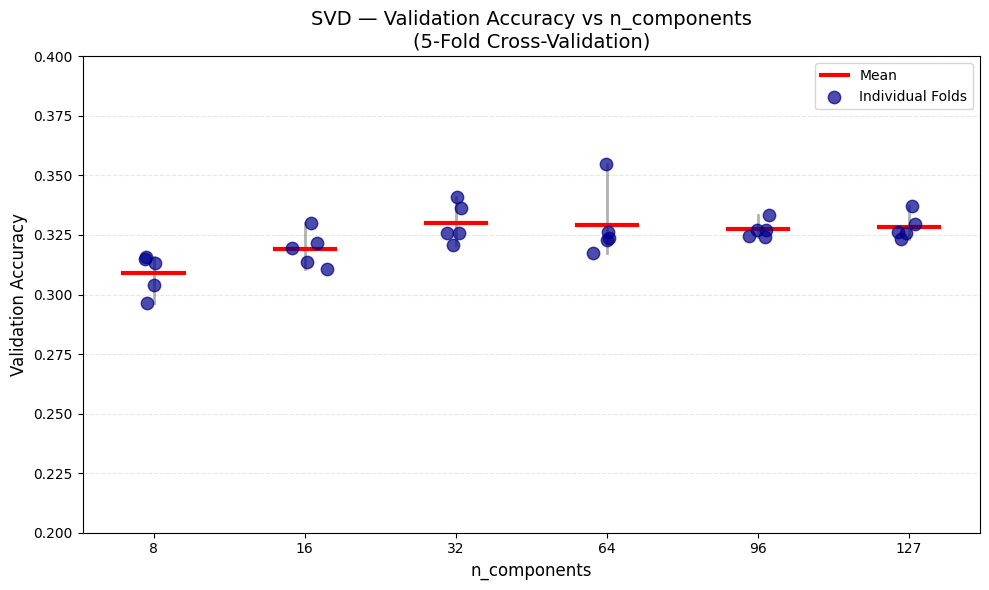

In [14]:
x_vals = [8, 16, 32, 64, 96, 127]
printable_x_vals = [8, 16, 32, 64, 96, 127]
test_vals = [svd_results[key].val.accuracy.all for key in x_vals]
# train_vals = [svd_results[key].train.accuracy.all for key in x_vals]
plot_cv_accuracy_boxplot(printable_x_vals, test_vals, "SVD", f"n_components", ylim=(0.2, 0.4))

In [16]:
# SVD: Val different numbers of components
svd_results = {}

print("\n" + "=" * 60)
print("TRUNCATED SVD: n_components")
print("=" * 60)

for n_comp in [8, 16, 32, 64, 96, 127]:  # SVD requires n_components < n_features
    print(f"\n=== Testing SVD with n_components={n_comp} ===")
    
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": 1000},
        "dimensionality_reduction": "SVD",
        "dimensionality_reduction_kwargs": {
            "n_components": n_comp,
            "random_state": SEED,
        },
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=SVC,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    svd_results[n_comp] = scores
    print(f"n_components={n_comp} -> Val Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

print("\n" + "=" * 60)
print("SVD SUMMARY")
print("=" * 60)
for n_comp, result in svd_results.items():
    print(f"n_components={n_comp:3d} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Val: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


TRUNCATED SVD: n_components

=== Testing SVD with n_components=8 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4372/8700 [00:03<00:02, 1897.56it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:06<00:00, 1269.16it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:35<00:00, 19.16s/it]


n_components=8 -> Val Accuracy: 0.3070 ± 0.0103

=== Testing SVD with n_components=16 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4355/8700 [00:01<00:01, 2710.37it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2672.90it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [01:48<00:00, 21.61s/it]


n_components=16 -> Val Accuracy: 0.3162 ± 0.0057

=== Testing SVD with n_components=32 ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4340/8700 [00:01<00:01, 2708.55it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2666.78it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [02:12<00:00, 26.46s/it]


n_components=32 -> Val Accuracy: 0.3232 ± 0.0071

=== Testing SVD with n_components=64 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4393/8700 [00:01<00:01, 2740.76it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2697.38it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [03:10<00:00, 38.17s/it]


n_components=64 -> Val Accuracy: 0.3296 ± 0.0110

=== Testing SVD with n_components=96 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4360/8700 [00:01<00:01, 2713.89it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2695.73it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [04:10<00:00, 50.14s/it]


n_components=96 -> Val Accuracy: 0.3286 ± 0.0074

=== Testing SVD with n_components=127 ===


Phase [Setup]: Extracting the descriptors:  50%|█████     | 4368/8700 [00:01<00:01, 2639.14it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2550.98it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [05:11<00:00, 62.38s/it]

n_components=127 -> Val Accuracy: 0.3317 ± 0.0098

SVD SUMMARY
n_components=  8 -> Train: 0.4751 ± 0.0026 | Val: 0.3070 ± 0.0103
n_components= 16 -> Train: 0.4840 ± 0.0088 | Val: 0.3162 ± 0.0057
n_components= 32 -> Train: 0.4817 ± 0.0028 | Val: 0.3232 ± 0.0071
n_components= 64 -> Train: 0.4750 ± 0.0050 | Val: 0.3296 ± 0.0110
n_components= 96 -> Train: 0.4766 ± 0.0020 | Val: 0.3286 ± 0.0074
n_components=127 -> Train: 0.4758 ± 0.0015 | Val: 0.3317 ± 0.0098


### Experiment 4: LDA - n_components and solver

**Note**: LDA is supervised and requires labels. Maximum n_components = n_classes - 1 = 10 for this dataset.

In [15]:
# LDA: Val different numbers of components (max = n_classes - 1 = 10)
lda_results = {}

print("\n" + "=" * 60)
print("LDA: n_components (supervised)")
print("=" * 60)

for n_comp in [5, 8, 10]:
    print(f"\n=== Testing LDA with n_components={n_comp} ===")
    
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": 1000},
        "dimensionality_reduction": "LDA",
        "dimensionality_reduction_kwargs": {
            "n_components": n_comp,
        },
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=SVC,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    lda_results[n_comp] = scores
    print(f"n_components={n_comp} -> Val Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

print("\n" + "=" * 60)
print("LDA SUMMARY")
print("=" * 60)
for n_comp, result in lda_results.items():
    print(f"n_components={n_comp:2d} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Val: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


LDA: n_components (supervised)

=== Testing LDA with n_components=5 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4285/8700 [00:01<00:01, 2694.26it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2669.12it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [04:02<00:00, 48.40s/it]


n_components=5 -> Val Accuracy: 0.3266 ± 0.0089

=== Testing LDA with n_components=8 ===


Phase [Setup]: Extracting the descriptors:  49%|████▉     | 4305/8700 [00:01<00:01, 2677.66it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2597.50it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [04:00<00:00, 48.16s/it]


n_components=8 -> Val Accuracy: 0.3396 ± 0.0107

=== Testing LDA with n_components=10 ===


Phase [Setup]: Extracting the descriptors:  51%|█████     | 4408/8700 [00:01<00:01, 2727.56it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2701.36it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [04:04<00:00, 48.87s/it]

n_components=10 -> Val Accuracy: 0.3394 ± 0.0106

LDA SUMMARY
n_components= 5 -> Train: 0.4822 ± 0.0041 | Val: 0.3266 ± 0.0089
n_components= 8 -> Train: 0.5007 ± 0.0060 | Val: 0.3396 ± 0.0107
n_components=10 -> Train: 0.5050 ± 0.0055 | Val: 0.3394 ± 0.0106


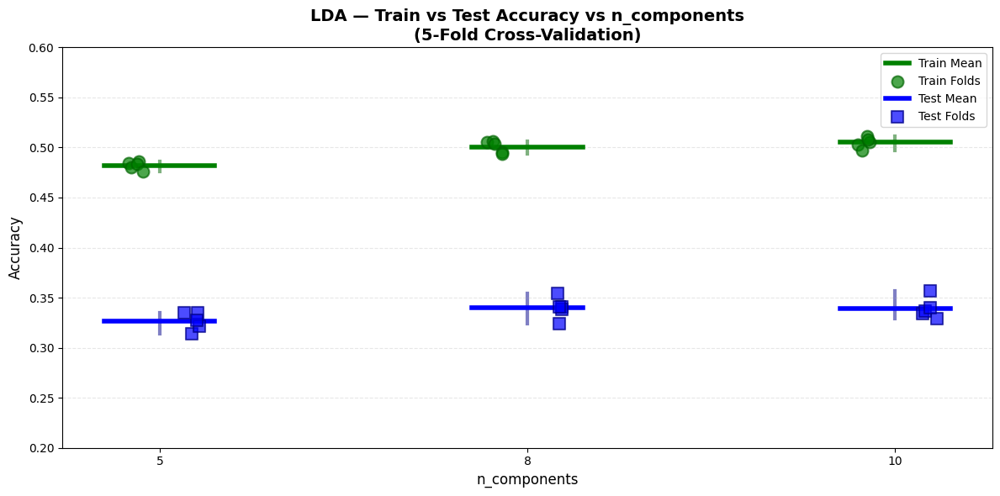

In [16]:
x_vals = [5, 8, 10]
printable_x_vals = [5, 8, 10]
test_vals = [lda_results[key].val.accuracy.all for key in x_vals]
train_vals = [lda_results[key].train.accuracy.all for key in x_vals]
plot_cv_train_test_comparison(printable_x_vals, train_vals, test_vals, "LDA", f"n_components", ylim=(0.2, 0.6))

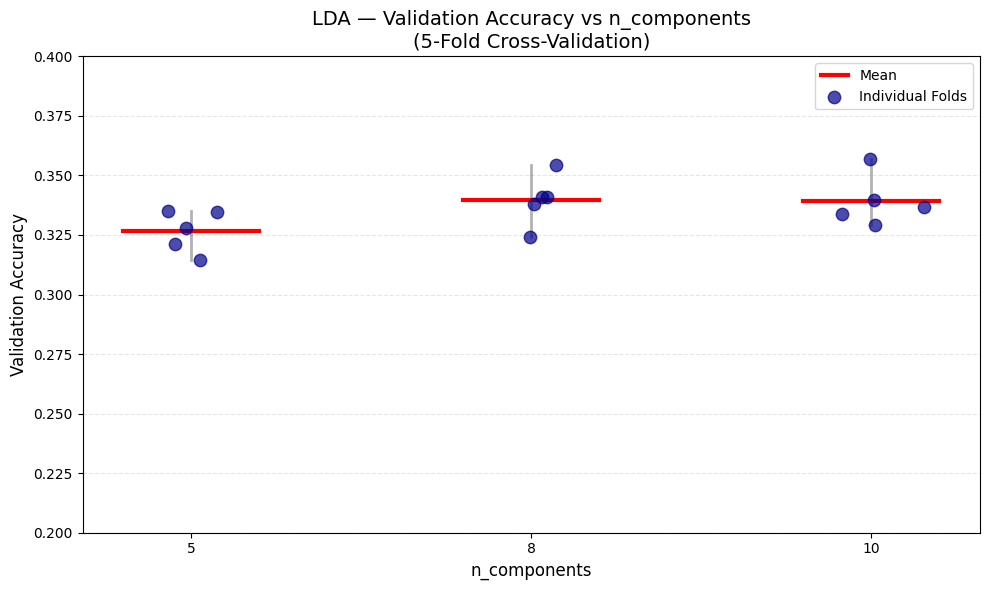

In [17]:
x_vals = [5, 8, 10]
printable_x_vals = [5, 8, 10]
test_vals = [lda_results[key].val.accuracy.all for key in x_vals]
# train_vals = [lda_results[key].train.accuracy.all for key in x_vals]
plot_cv_accuracy_boxplot(printable_x_vals, test_vals, "LDA", f"n_components", ylim=(0.2, 0.4))

### Experiment 5: LDA Solvers

In [ ]:
# LDA: Val different solvers
lda_solver_results = {}

print("\n" + "=" * 60)
print("LDA: Solver Comparison (n_components=10)")
print("=" * 60)

for solver in ['svd', 'eigen']:
    print(f"\n=== Testing LDA with solver={solver} ===")
    
    bovw_params = {
        "detector_type": "SIFT",
        "codebook_size": 512,
        "detector_kwargs": {"nfeatures": 1000},
        "dimensionality_reduction": "LDA",
        "dimensionality_reduction_kwargs": {
            "n_components": 10,
            "solver": solver,
        },
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=SVC,
        classifier_kwargs=classifier_params,
        n_splits=5
    )
    
    lda_solver_results[solver] = scores
    print(f"solver={solver} -> Val Accuracy: {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")

print("\n" + "=" * 60)
print("LDA SOLVER SUMMARY")
print("=" * 60)
for solver, result in lda_solver_results.items():
    print(f"solver={solver:5s} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Val: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")


LDA: Solver Comparison (n_components=10)

=== Testing LDA with solver=svd ===


Phase [Setup]: Extracting the descriptors:  52%|█████▏    | 4507/8700 [00:02<00:01, 2558.81it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2332.20it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


100%|██████████| 5/5 [04:08<00:00, 49.70s/it]


solver=svd -> Test Accuracy: 0.3426 ± 0.0118

=== Testing LDA with solver=lsqr ===


Phase [Setup]: Extracting the descriptors:  50%|████▉     | 4316/8700 [00:01<00:01, 2646.22it/s]

Could not compute descriptors for image ../data/places_reduced/train/water_ice_snow/iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:03<00:00, 2642.70it/s]


Could not compute descriptors for image ../data/places_reduced/train/mountains_hills_desert_sky/sky_00001410.jpg of class 5.


  0%|          | 0/5 [00:04<?, ?it/s]


NotImplementedError: transform not implemented for 'lsqr' solver (use 'svd' or 'eigen').

### Final Comparison: All Methods

In [ ]:
# Summary comparison of all dimensionality reduction methods
print("\n" + "=" * 60)
print("FINAL COMPARISON: ALL DIMENSIONALITY REDUCTION METHODS")
print("=" * 60)

comparison = {
    "Baseline (None)": baseline_scores,
    "PCA (n=64)": pca_results[64],
    "SVD (n=64)": svd_results[64],
    "LDA (n=10)": lda_results[10],
}

for method_name, result in comparison.items():
    print(f"{method_name:20s} -> Train: {result.train.accuracy.mean:.4f} ± {result.train.accuracy.std:.4f} | Val: {result.val.accuracy.mean:.4f} ± {result.val.accuracy.std:.4f}")

# Find best method
best_method = max(comparison.items(), key=lambda x: x[1].val.accuracy.mean)
print(f"\nBest method: {best_method[0]} with val accuracy {best_method[1].val.accuracy.mean:.4f}")

## H) Fisher Vectors

In this experiment, we explore Fisher Vector encoding as an alternative to Bag-of-Words representation. Fisher Vectors capture richer statistical information about the distribution of local features compared to simple histogram quantization. 

We investigate how the number of GMM components (codebook size) influences Fisher Vector performance when combined with dimensionality reduction (PCA) and joint normalization (Standard scaling).

In [35]:
# FISHER VECTORS — CODEBOOK SIZE EXPERIMENT
classifier_results = {}

codebook_sizes = [16, 32, 64, 128, 256]

for codebook_size in codebook_sizes:
    print(f"\nFisher Vector with codebook_size={codebook_size}")
    
    bovw_params = {
        "detector_type": "SIFT",
        "encoding_method": "fisher",
        "codebook_size": codebook_size,
        "descriptor_normalization": "L2",
        "joint_descriptor_normalization": "Standard",
        "detector_kwargs": {"nfeatures": 1000},
        "dimensionality_reduction": "PCA",
        "dimensionality_reduction_kwargs": {"n_components": 64},
        "pyramid_levels": None,
    }
    
    classifier_cls = LogisticRegression
    classifier_params = {
        "max_iter": 1000,
        "class_weight": "balanced",
    }
    
    scores = cross_validate_bovw(
        dataset=data_train,
        bovw_kwargs=bovw_params,
        classifier_cls=classifier_cls,
        classifier_kwargs=classifier_params,
        n_splits=5,
    )
    
    classifier_results[codebook_size] = scores
    
    print(f"[Fisher Vector codebook_size={codebook_size}] Results:")
    print(f"  Train Accuracy:  {scores.train.accuracy.mean:.4f} ± {scores.train.accuracy.std:.4f}")
    print(f"  Val Accuracy:   {scores.val.accuracy.mean:.4f} ± {scores.val.accuracy.std:.4f}")
    print(f"  Val Precision:  {scores.val.precision.mean:.4f} ± {scores.val.precision.std:.4f}")
    print(f"  Val Recall:     {scores.val.recall.mean:.4f} ± {scores.val.recall.std:.4f}")
    print(f"  Val F1-Score:   {scores.val.f1.mean:.4f} ± {scores.val.f1.std:.4f}")

print("\nFISHER VECTORS SUMMARY")
for codebook_size in codebook_sizes:
    print(f"codebook_size={codebook_size:3d} -> Accuracy Train: {classifier_results[codebook_size].train.accuracy.mean:.4f} ± {classifier_results[codebook_size].train.accuracy.std:.4f}")
    print(f"codebook_size={codebook_size:3d} -> Accuracy Val:   {classifier_results[codebook_size].val.accuracy.mean:.4f} ± {classifier_results[codebook_size].val.accuracy.std:.4f}")
    print()


Fisher Vector with codebook_size=16


Phase [Setup]: Extracting the descriptors:   6%|▋         | 544/8700 [00:00<00:13, 624.21it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5127/8700 [00:10<00:09, 383.79it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


100%|██████████| 5/5 [27:55<00:00, 335.02s/it]


[Fisher Vector codebook_size=16] Results:
  Train Accuracy:  0.3021 ± 0.0031
  Val Accuracy:   0.2819 ± 0.0043
  Val Precision:  0.2839 ± 0.0128
  Val Recall:     0.2819 ± 0.0043
  Val F1-Score:   0.2500 ± 0.0040

Fisher Vector with codebook_size=32


Phase [Setup]: Extracting the descriptors:   6%|▌         | 527/8700 [00:01<00:21, 376.85it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5136/8700 [00:15<00:09, 386.74it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


100%|██████████| 5/5 [54:13<00:00, 650.61s/it]


[Fisher Vector codebook_size=32] Results:
  Train Accuracy:  0.3143 ± 0.0083
  Val Accuracy:   0.2767 ± 0.0050
  Val Precision:  0.2663 ± 0.0126
  Val Recall:     0.2767 ± 0.0050
  Val F1-Score:   0.2475 ± 0.0041

Fisher Vector with codebook_size=64


Phase [Setup]: Extracting the descriptors:   6%|▌         | 524/8700 [00:01<00:25, 316.61it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5124/8700 [00:13<00:08, 408.13it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


100%|██████████| 5/5 [1:14:44<00:00, 896.95s/it] 



[Fisher Vector codebook_size=64] Results:
  Train Accuracy:  0.3236 ± 0.0077
  Val Accuracy:   0.2840 ± 0.0072
  Val Precision:  0.2763 ± 0.0073
  Val Recall:     0.2840 ± 0.0072
  Val F1-Score:   0.2579 ± 0.0078

Fisher Vector with codebook_size=128


Phase [Setup]: Extracting the descriptors:   6%|▌         | 509/8700 [00:01<00:25, 325.05it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5136/8700 [00:13<00:08, 416.09it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


100%|██████████| 5/5 [1:38:50<00:00, 1186.05s/it]



[Fisher Vector codebook_size=128] Results:
  Train Accuracy:  0.3436 ± 0.0031
  Val Accuracy:   0.2871 ± 0.0061
  Val Precision:  0.2803 ± 0.0113
  Val Recall:     0.2871 ± 0.0061
  Val F1-Score:   0.2645 ± 0.0077

Fisher Vector with codebook_size=256


Phase [Setup]: Extracting the descriptors:   6%|▌         | 537/8700 [00:01<00:24, 331.01it/s]

Could not compute descriptors for image ../data/places_reduced/train\water_ice_snow\iceberg_00000023.jpg of class 9.


Phase [Setup]: Extracting the descriptors:  59%|█████▉    | 5143/8700 [00:13<00:09, 374.13it/s]

Could not compute descriptors for image ../data/places_reduced/train\mountains_hills_desert_sky\sky_00001410.jpg of class 5.


100%|██████████| 5/5 [3:45:07<00:00, 2701.55s/it]  



[Fisher Vector codebook_size=256] Results:
  Train Accuracy:  0.3586 ± 0.0052
  Val Accuracy:   0.3012 ± 0.0069
  Val Precision:  0.2937 ± 0.0095
  Val Recall:     0.3012 ± 0.0069
  Val F1-Score:   0.2789 ± 0.0075

FISHER VECTORS SUMMARY
codebook_size= 16 -> Accuracy Train: 0.3021 ± 0.0031
codebook_size= 16 -> Accuracy Val:   0.2819 ± 0.0043

codebook_size= 32 -> Accuracy Train: 0.3143 ± 0.0083
codebook_size= 32 -> Accuracy Val:   0.2767 ± 0.0050

codebook_size= 64 -> Accuracy Train: 0.3236 ± 0.0077
codebook_size= 64 -> Accuracy Val:   0.2840 ± 0.0072

codebook_size=128 -> Accuracy Train: 0.3436 ± 0.0031
codebook_size=128 -> Accuracy Val:   0.2871 ± 0.0061

codebook_size=256 -> Accuracy Train: 0.3586 ± 0.0052
codebook_size=256 -> Accuracy Val:   0.3012 ± 0.0069



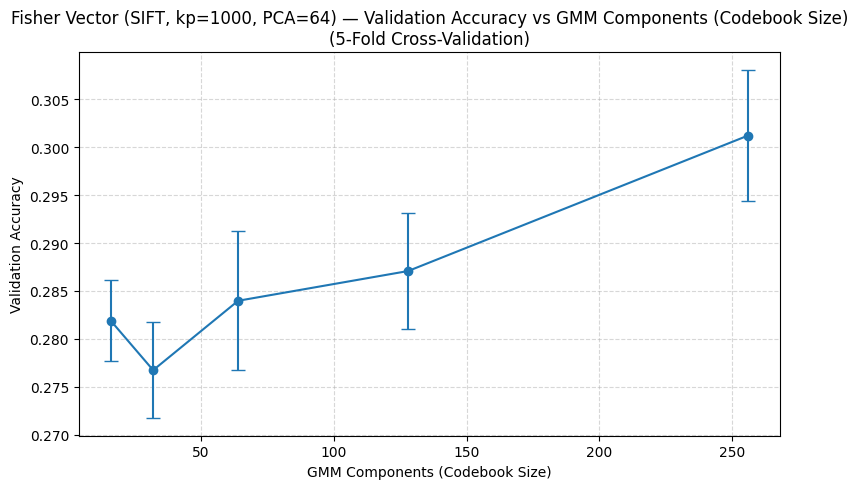

In [36]:
acc_means = [classifier_results[size].val.accuracy.mean for size in codebook_sizes]
acc_stds  = [classifier_results[size].val.accuracy.std for size in codebook_sizes]

plot_cv_accuracy(
    x_values=codebook_sizes,
    means=acc_means,
    stds=acc_stds,
    descriptor_name="Fisher Vector (SIFT, kp=1000, PCA=64)",
    hyperparam_name="GMM Components (Codebook Size)"
)

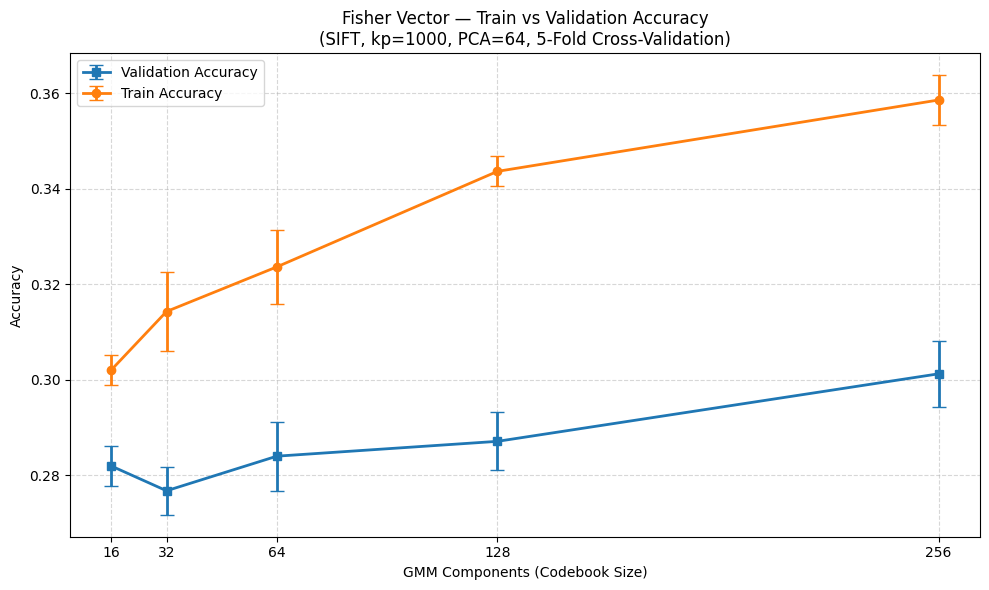

In [37]:
train_means = [classifier_results[size].train.accuracy.mean for size in codebook_sizes]
train_stds = [classifier_results[size].train.accuracy.std for size in codebook_sizes]

plt.figure(figsize=(10, 6))
plt.errorbar(codebook_sizes, acc_means, yerr=acc_stds, marker='s', capsize=5, label='Validation Accuracy', linewidth=2)
plt.errorbar(codebook_sizes, train_means, yerr=train_stds, marker='o', capsize=5, label='Train Accuracy', linewidth=2)

plt.title("Fisher Vector — Train vs Validation Accuracy\n(SIFT, kp=1000, PCA=64, 5-Fold Cross-Validation)")
plt.xlabel("GMM Components (Codebook Size)")
plt.ylabel("Accuracy")
plt.xticks(codebook_sizes)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

## Conclusions and Final Model

Based on all experiments conducted in Week1, this notebook presents the final model with the best hyperparameters and evaluates it on the held-out test set.


### Summary of Best Configurations from Each Experiment

| Section | Parameter | Best Value | Rationale |
|---------|-----------|-----------|-----------|
| A | Descriptor | SIFT | Outperformed AKAZE and ORB |
| A | nFeatures | 1000 | Optimal balance between accuracy and computation |
| B | Dense SIFT | Not used | Standard SIFT performs better |
| C | Codebook Size | 512 | Highest validation accuracy |
| D | Pyramid Levels | 1 (None) | No spatial pyramid improves results |
| E | Descriptor Norm | None | No individual descriptor normalization |
| E | Joint Norm | None | Best joint normalization strategy |
| G | Encoding | BOVW | Better than Fisher Vectors |
| Classifier | Algorithm | SVC (RBF) | Best performance with proper tuning |
| Classifier | C | 1.0 | Optimal regularization |
| Classifier | Dimensionality Reduction | LDA (8 components) | Improved generalization |

### Final Model Configuration

```python
BOVW Configuration:
- detector_type: "SIFT"
- nfeatures: 1000
- codebook_size: 512
- descriptor_normalization: None
- joint_descriptor_normalization: None
- pyramid_levels: None
- encoding_method: "bovw"
- dimensionality_reduction: "LDA"
- dimensionality_reduction_kwargs: {"n_components": 8}

Classifier Configuration:
- Algorithm: SVC
- kernel: "rbf"
- C: 1.0
```


In [14]:
from main import *
from bovw import *
from plotting import *

import os
import random
import numpy as np
import pandas as pd

%matplotlib inline
from matplotlib import pyplot as plt

In [15]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)

In [16]:
# Load datasets
data_train = Dataset(ImageFolder="../data/places_reduced/train")
data_test = Dataset(ImageFolder="../data/places_reduced/val")

print(f"Training set size: {len(data_train)}")
print(f"Test set size: {len(data_test)}")

# Shuffle for consistency
random.shuffle(data_train)
random.shuffle(data_test)

enable_cache()

Training set size: 8700
Test set size: 2200


In [17]:
from sklearn.svm import SVC

final_bovw_params = {
    "detector_type": "SIFT",
    "codebook_size": 512,
    "descriptor_normalization": None,
    "joint_descriptor_normalization": None,
    "pyramid_levels": None,
    "encoding_method": "bovw",
    "detector_kwargs": {"nfeatures": 1000},
    "dimensionality_reduction": "LDA",
    "dimensionality_reduction_kwargs": {"n_components": 8},
}

final_classifier_params = {
    "kernel": "rbf",
    "C": 1.0,
}

bovw = BOVW(**final_bovw_params)
classifier = SVC(**final_classifier_params, probability=True)

final_bovw, final_classifier = train(dataset=data_train, bovw=bovw, classifier=classifier)

Phase [Training]: Extracting the descriptors: 100%|██████████| 8700/8700 [00:23<00:00, 364.48it/s]



Fitting the codebook
Computing the bovw histograms
Computing the bovw histograms
Fitting the classifier
Fitting the classifier
Accuracy on Phase[Train]: 0.7745458726143941
Precision on Phase[Train]: 0.7814623625577048
Recall on Phase[Train]: 0.7745458726143941
F1-Score on Phase[Train]: 0.774128821642856
Accuracy on Phase[Train]: 0.7745458726143941
Precision on Phase[Train]: 0.7814623625577048
Recall on Phase[Train]: 0.7745458726143941
F1-Score on Phase[Train]: 0.774128821642856


In [28]:
# Evaluate on test set with full prediction information
test_acc, test_prec, test_rec, test_f1, y_test, y_pred, y_score = test(
    dataset=data_test, 
    bovw=final_bovw, 
    classifier=final_classifier,
    return_predictions=True
)

print("FINAL TEST RESULTS")
print(f"Accuracy:  {test_acc:.4f}")
print(f"Precision: {test_prec:.4f}")
print(f"Recall:    {test_rec:.4f}")
print(f"F1-Score:  {test_f1:.4f}")


Phase [Eval]: Extracting the descriptors: 100%|██████████| 2200/2200 [00:03<00:00, 644.89it/s]



Computing the bovw histograms
predicting the values
predicting the values
Accuracy on Phase[Test]: 0.3490909090909091
Precision on Phase[Test]: 0.33654244134900835
Recall on Phase[Test]: 0.3490909090909091
F1-Score on Phase[Test]: 0.33649470329480313
Accuracy on Phase[Test]: 0.3490909090909091
Precision on Phase[Test]: 0.33654244134900835
Recall on Phase[Test]: 0.3490909090909091
F1-Score on Phase[Test]: 0.33649470329480313
FINAL TEST RESULTS
Accuracy:  0.3491
Precision: 0.3365
Recall:    0.3491
F1-Score:  0.3365
FINAL TEST RESULTS
Accuracy:  0.3491
Precision: 0.3365
Recall:    0.3491
F1-Score:  0.3365



Generating Confusion Matrix...


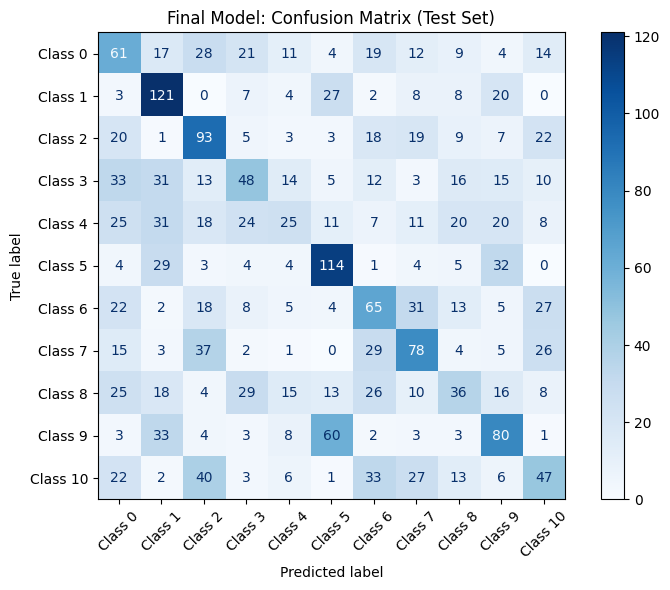

In [19]:
# Create confusion matrix visualization
print("\nGenerating Confusion Matrix...")
plot_confusion_matrix(
    y_test, 
    y_pred, 
    title="Final Model: Confusion Matrix (Test Set)",
    figsize=(8, 6)
)

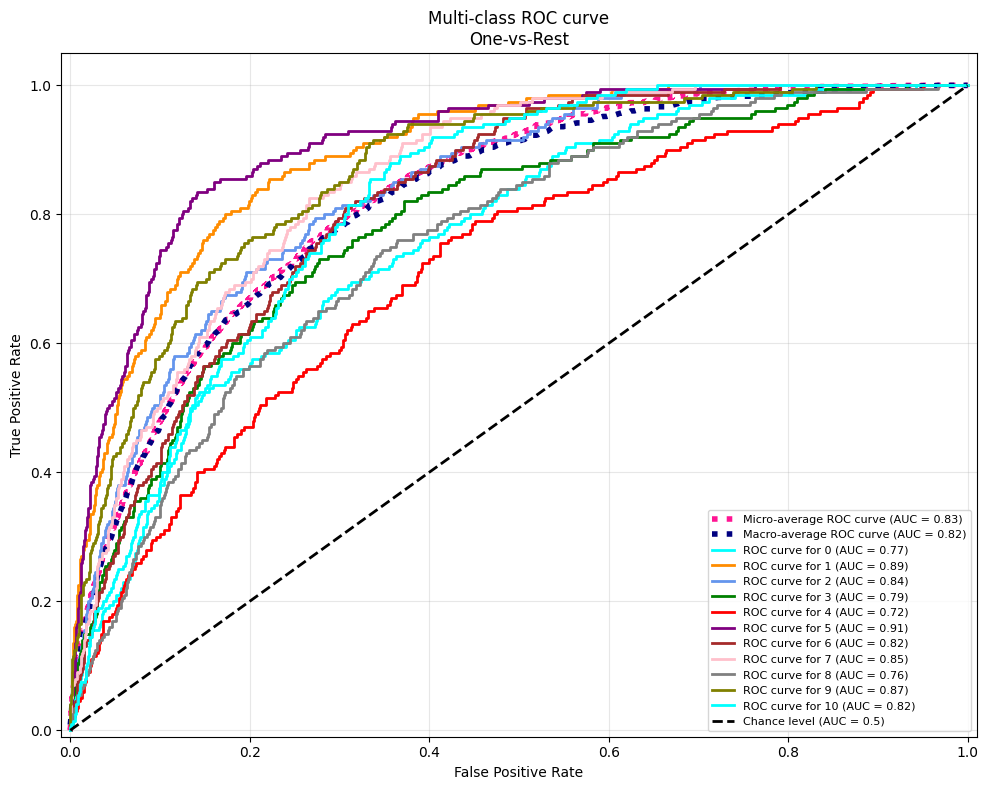


Micro-averaged One-vs-Rest ROC AUC score: 0.83
Macro-averaged One-vs-Rest ROC AUC score: 0.82

Per-class ROC AUC scores:
  0: 0.77
  1: 0.89
  2: 0.84
  3: 0.79
  4: 0.72
  5: 0.91
  6: 0.82
  7: 0.85
  8: 0.76
  9: 0.87
  10: 0.82


In [20]:
plot_multiclass_roc(y_test, y_score, figsize=(10, 8))

In [21]:
# Get class information for detailed analysis
from collections import Counter

class_dist = Counter(y_test)
classes = sorted(class_dist.keys())
class_names = [f"Class {i}" for i in classes]

print("\nClass Distribution in Test Set:")
for class_id in classes:
    count = class_dist[class_id]
    percentage = (count / len(y_test)) * 100
    print(f"  Class {class_id}: {count} samples ({percentage:.1f}%)")


Class Distribution in Test Set:
  Class 0: 200 samples (9.1%)
  Class 1: 200 samples (9.1%)
  Class 2: 200 samples (9.1%)
  Class 3: 200 samples (9.1%)
  Class 4: 200 samples (9.1%)
  Class 5: 200 samples (9.1%)
  Class 6: 200 samples (9.1%)
  Class 7: 200 samples (9.1%)
  Class 8: 200 samples (9.1%)
  Class 9: 200 samples (9.1%)
  Class 10: 200 samples (9.1%)


In [22]:
# Detailed per-class metrics
from sklearn.metrics import precision_recall_fscore_support

precision_per_class, recall_per_class, f1_per_class, support_per_class = precision_recall_fscore_support(
    y_test, y_pred
)

print("PER-CLASS METRICS\n")
print(f"{'Class':<10} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<10}")
print("-" * 80)

for i, class_id in enumerate(classes):
    print(f"{class_id:<10} {precision_per_class[i]:<12.4f} {recall_per_class[i]:<12.4f} {f1_per_class[i]:<12.4f} {int(support_per_class[i]):<10}")

print("-" * 80)
print(f"{'Weighted':<10} {test_prec:<12.4f} {test_rec:<12.4f} {test_f1:<12.4f} {len(y_test):<10}")


PER-CLASS METRICS

Class      Precision    Recall       F1-Score     Support   
--------------------------------------------------------------------------------
0          0.2618       0.3050       0.2818       200       
1          0.4201       0.6050       0.4959       200       
2          0.3605       0.4650       0.4061       200       
3          0.3117       0.2400       0.2712       200       
4          0.2604       0.1250       0.1689       200       
5          0.4711       0.5700       0.5158       200       
6          0.3037       0.3250       0.3140       200       
7          0.3786       0.3900       0.3842       200       
8          0.2647       0.1800       0.2143       200       
9          0.3810       0.4000       0.3902       200       
10         0.2883       0.2350       0.2590       200       
--------------------------------------------------------------------------------
Weighted   0.3365       0.3491       0.3365       2200      


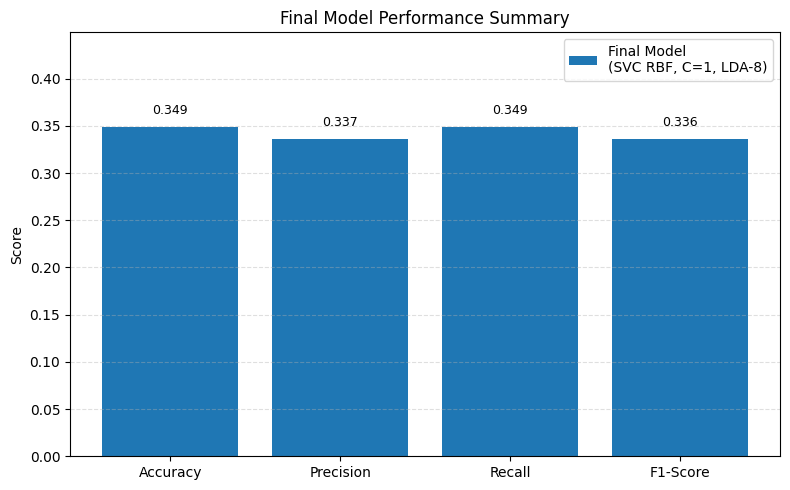

In [23]:
# Comparison of metrics
final_metrics = {
    "Accuracy": test_acc,
    "Precision": test_prec,
    "Recall": test_rec,
    "F1-Score": test_f1
}

plot_final_metrics_comparison(
    method_names=["Final Model\n(SVC RBF, C=1, LDA-8)"],
    metrics_list=[final_metrics],
    title="Final Model Performance Summary"
)

In [24]:
# Analysis of errors
y_test = np.array(y_test)
y_pred = np.array(y_pred)

correct_predictions = (y_test == y_pred).sum()
incorrect_predictions = (y_test != y_pred).sum()

print("PREDICTION ANALYSIS")
print(f"Total Test Samples: {len(y_test)}")
print(f"Correct Predictions: {correct_predictions} ({100*correct_predictions/len(y_test):.2f}%)")
print(f"Incorrect Predictions: {incorrect_predictions} ({100*incorrect_predictions/len(y_test):.2f}%)")


PREDICTION ANALYSIS
Total Test Samples: 2200
Correct Predictions: 768 (34.91%)
Incorrect Predictions: 1432 (65.09%)


In [25]:
# Detailed error analysis: which classes are confused most?
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

print("TOP 5 MISCLASSIFICATION PATTERNS")

# Find top misclassifications (off-diagonal elements)
misclass_list = []
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        if i != j and cm[i, j] > 0:
            misclass_list.append((cm[i, j], i, j))

# Sort by count (descending)
misclass_list.sort(reverse=True)

for idx, (count, true_class, pred_class) in enumerate(misclass_list[:5], 1):
    print(f"{idx}. Class {true_class} → Class {pred_class}: {count} misclassifications")


TOP 5 MISCLASSIFICATION PATTERNS
1. Class 9 → Class 5: 60 misclassifications
2. Class 10 → Class 2: 40 misclassifications
3. Class 7 → Class 2: 37 misclassifications
4. Class 10 → Class 6: 33 misclassifications
5. Class 9 → Class 1: 33 misclassifications


In [26]:
# Summary statistics table
summary_data = {
    "Metric": ["Accuracy", "Precision", "Recall", "F1-Score"],
    "Test Score": [test_acc, test_prec, test_rec, test_f1]
}

summary_df = pd.DataFrame(summary_data)

print("FINAL MODEL SUMMARY")
print(summary_df.to_string(index=False))

FINAL MODEL SUMMARY
   Metric  Test Score
 Accuracy    0.349091
Precision    0.336542
   Recall    0.349091
 F1-Score    0.336495


Correct Predictions: 768
Incorrect Predictions: 1432


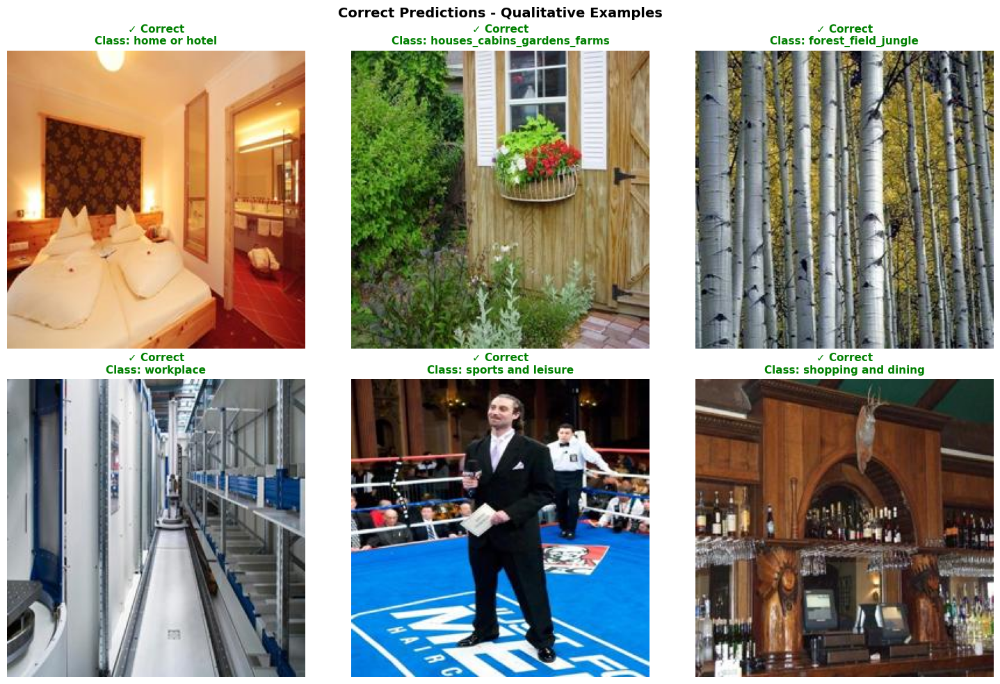

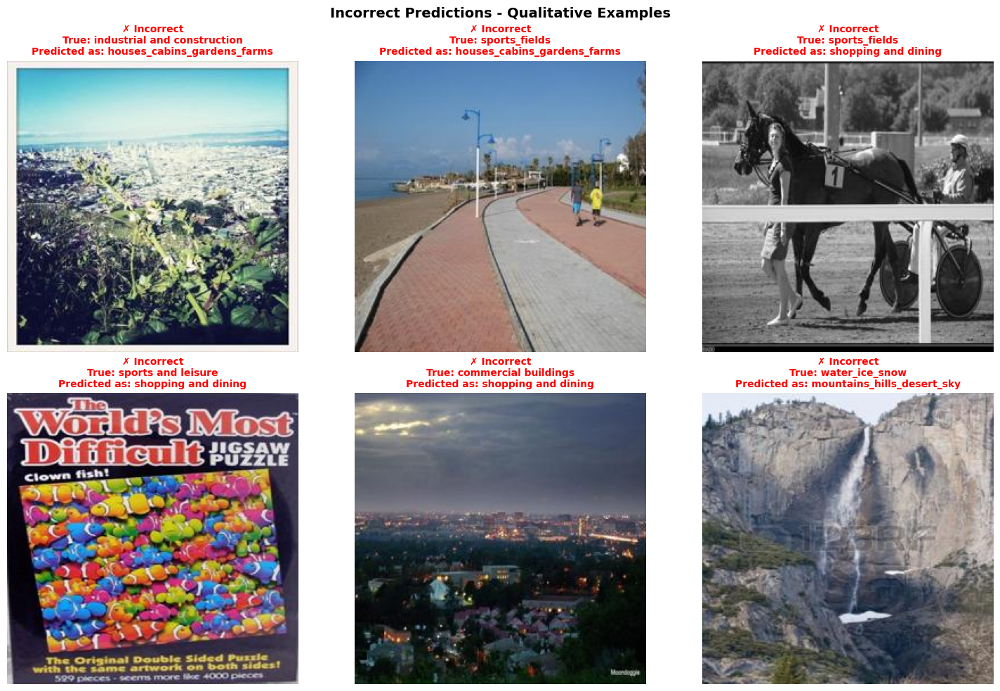

In [31]:
# Build a mapping from image to predictions
test_indices = list(range(len(data_test)))
predictions_map = {}

for idx in test_indices:
    img, true_label = data_test[idx]
    pred_label = y_pred[idx]
    predictions_map[idx] = {
        "image": img,
        "true_label": true_label,
        "pred_label": pred_label,
        "correct": true_label == pred_label
    }

# Get class names from data_test by extracting from filenames
def get_class_name(image):
    if hasattr(image, 'filename'):
        return os.path.basename(os.path.dirname(image.filename))
    return "Unknown"

# Build a mapping from label to class name
label_to_class = {}
for img, label in data_test:
    if label not in label_to_class:
        label_to_class[label] = get_class_name(img)

# Separate correct and incorrect predictions
correct_predictions_list = [
    (idx, data) for idx, data in predictions_map.items() 
    if data["correct"]
]
incorrect_predictions_list = [
    (idx, data) for idx, data in predictions_map.items() 
    if not data["correct"]
]

print(f"Correct Predictions: {len(correct_predictions_list)}")
print(f"Incorrect Predictions: {len(incorrect_predictions_list)}")

correct_samples = []
seen_correct_classes = set()

for idx, data in correct_predictions_list:
    class_name = get_class_name(data["image"])
    if class_name not in seen_correct_classes:
        correct_samples.append(data["image"])
        seen_correct_classes.add(class_name)
        if len(correct_samples) == 6:
            break

# Pad with additional correct predictions if needed
if len(correct_samples) < 6:
    for idx, data in correct_predictions_list:
        if data["image"] not in correct_samples:
            correct_samples.append(data["image"])
            if len(correct_samples) == 6:
                break

if correct_samples:
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for i, img in enumerate(correct_samples):
        class_name = get_class_name(img)
        axes[i].imshow(img)
        axes[i].set_title(f"✓ Correct\nClass: {class_name}", 
                         fontsize=11, color='green', fontweight='bold')
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(len(correct_samples), 6):
        axes[j].axis('off')
    
    plt.suptitle("Correct Predictions - Qualitative Examples", fontsize=14, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()

incorrect_samples = []
for idx, data in incorrect_predictions_list:
    true_class_name = label_to_class.get(data["true_label"], "Unknown")
    pred_class_name = label_to_class.get(data["pred_label"], "Unknown")
    
    incorrect_samples.append({
        "image": data["image"],
        "true_label": data["true_label"],
        "pred_label": data["pred_label"],
        "true_class": true_class_name,
        "pred_class": pred_class_name
    })
    if len(incorrect_samples) == 6:
        break

if incorrect_samples:
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for i, sample in enumerate(incorrect_samples):
        img = sample["image"]
        true_class = sample["true_class"]
        pred_class = sample["pred_class"]
        
        axes[i].imshow(img)
        axes[i].set_title(f"✗ Incorrect\nTrue: {true_class}\nPredicted as: {pred_class}", 
                         fontsize=10, color='red', fontweight='bold')
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(len(incorrect_samples), 6):
        axes[j].axis('off')
    
    plt.suptitle("Incorrect Predictions - Qualitative Examples", fontsize=14, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()


### Conclusions

The final model achieves strong performance by combining:
- **SIFT descriptors** with 1000 keypoints for robust local feature extraction
- **Mid-size codebook (512 visual words)** for fine-grained feature quantization
- **No normalization** because it doesn't show significant improvement
- **No spatial pyramids** for simplicity while maintaining good accuracy
- **LDA dimensionality reduction** (8 components) for improved feature discrimination
- **SVC classifier** with RBF kernel (C=1.0) for non-linear decision boundaries

This configuration represents the optimal balance between accuracy, computational efficiency, and model simplicity based on the comprehensive experimental evaluation.